In [1]:
import jax
import jax.nn as jnn
import jax.numpy as jnp
import numpy as np

import equinox as eqx
import diffrax
import optax
from functools import partial

In [2]:
import os
os.chdir("..")
from policy.policy_training import DPCTrainer
from exciting_environments.pmsm.pmsm_env import PMSM, step_eps
import jax_dataclasses as jdc
from models.models import MLP_lin
from policy.networks import MLP#,MLP2
import matplotlib.pyplot as plt

2024-12-17 19:49:44.320911: W external/xla/xla/service/gpu/nvptx_compiler.cc:760] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.6.77). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.


In [3]:
gpus = jax.devices()
jax.config.update("jax_default_device", gpus[0])
#jax.config.update("jax_enable_x64", True)

In [4]:
import matplotlib.pyplot as plt
from matplotlib import cm
def valid_points(Z,D,Q):
    def cond(point):
        return (point[0]**2+point[1]**2-250**2 <= 0).astype(int)
    z_flat=Z.flatten()
    points=jnp.array([D.flatten(),Q.flatten()]).T
    val_points=jax.vmap(cond,in_axes=0)(points)
    z_flat_val=z_flat*val_points
    return z_flat_val.reshape(D.shape)

def eval_psi(expert_model):
    fig = plt.figure(figsize=(12,8))
    xx = np.linspace(-250, 0, 26)
    yy = np.linspace(-250, 250, 51)
    D, Q = np.meshgrid(xx, yy, indexing='ij')
    learned_psi={"Psi_d":expert_model.psi_d_mlp,"Psi_q":expert_model.psi_q_mlp}

    for  i,name in  zip(range(2),["Psi_d","Psi_q"]):
        
        interp=expert_model.motor_env.LUT_interpolators[name]
        Z = interp((D,Q))
        
        Z=Z*1000
        Z=valid_points(Z,D,Q)
        ax = fig.add_subplot(2, 3, 3*i +1, projection='3d')
        norm = plt.Normalize(Z.min(), Z.max())
        colors = cm.viridis(norm(Z))
        rcount, ccount, _ = colors.shape
        surf = ax.plot_surface(D,Q, Z, rcount=rcount, ccount=ccount,
                        facecolors=colors, shade=False)
        surf.set_facecolor((0,0,0,0))
        ax.azim=225
        ax.set_xlabel("i_d in A")
        ax.set_ylabel("i_q in A")
        ax.set_title(name+' in mH - LUT')

        mlp=learned_psi[name]
        z_flatt=jax.vmap(mlp)(jnp.array([D.flatten(),Q.flatten()]).T/expert_model.motor_env.env_properties.physical_constraints.i_d) #
        Z_d=z_flatt.reshape(D.shape)*1000
        
        Z_d=valid_points(Z_d,D,Q)

        ax = fig.add_subplot(2, 3, 3*i +2, projection='3d')
        norm = plt.Normalize(Z_d.min(), Z_d.max())
        colors = cm.viridis(norm(Z_d))
        rcount, ccount, _ = colors.shape
        surf = ax.plot_surface(D, Q, Z_d, rcount=rcount, ccount=ccount,
                        facecolors=colors, shade=False)
        surf.set_facecolor((0,0,0,0))
        ax.azim=225
        ax.set_xlabel("i_d in A")
        ax.set_ylabel("i_q in A")
        ax.set_title(name+' in mH - learned MLP')

        Z_difference=jnp.abs(Z - Z_d) #np.abs
        ax = fig.add_subplot(2, 3, 3*i +3, projection='3d')
        norm = plt.Normalize(Z_difference.min(), Z_difference.max())
        colors = cm.viridis(norm(Z_difference))
        rcount, ccount, _ = colors.shape
        surf = ax.plot_surface(D, Q, Z_difference, rcount=rcount, ccount=ccount,
                        facecolors=colors, shade=False)
        surf.set_facecolor((0,0,0,0))
        ax.azim=225
        ax.set_xlabel("i_d in A")
        ax.set_ylabel("i_q in A")
        ax.set_title('abs. error in mH')
        ax.ticklabel_format(style='plain')

    fig.show()

def eval_psi_and_L(expert_model):
    fig = plt.figure(figsize=(12,20))
    xx = np.linspace(-250, 0, 26)
    yy = np.linspace(-250, 250, 51)
    D, Q = np.meshgrid(xx, yy, indexing='ij')
    learned_psi={"Psi_d":expert_model.psi_d_mlp,"Psi_q":expert_model.psi_q_mlp,
                 "L_dd":expert_model.L_dd,"L_dq":expert_model.L_dq,"L_qd":expert_model.L_qd,"L_qq":expert_model.L_qq}

    for  i,name in  zip(range(6),["Psi_d","Psi_q","L_dd","L_dq","L_qd","L_qq"]):
        
        interp=expert_model.motor_env.LUT_interpolators[name]
        Z = interp((D,Q))
        
        Z=Z*1000
        Z=valid_points(Z,D,Q)
        ax = fig.add_subplot(6, 3, 3*i +1, projection='3d')
        norm = plt.Normalize(Z.min(), Z.max())
        colors = cm.viridis(norm(Z))
        rcount, ccount, _ = colors.shape
        surf = ax.plot_surface(D,Q, Z, rcount=rcount, ccount=ccount,
                        facecolors=colors, shade=False)
        surf.set_facecolor((0,0,0,0))
        ax.azim=225
        ax.set_xlabel("i_d in A")
        ax.set_ylabel("i_q in A")
        ax.set_title(name+' in mH - LUT')

        mlp=learned_psi[name]
        z_flatt=jax.vmap(mlp)(jnp.array([D.flatten(),Q.flatten()]).T/expert_model.motor_env.env_properties.physical_constraints.i_d)#
        Z_d=z_flatt.reshape(D.shape)*1000
        
        Z_d=valid_points(Z_d,D,Q)

        ax = fig.add_subplot(6, 3, 3*i +2, projection='3d')
        norm = plt.Normalize(Z_d.min(), Z_d.max())
        colors = cm.viridis(norm(Z_d))
        rcount, ccount, _ = colors.shape
        surf = ax.plot_surface(D, Q, Z_d, rcount=rcount, ccount=ccount,
                        facecolors=colors, shade=False)
        surf.set_facecolor((0,0,0,0))
        ax.azim=225
        ax.set_xlabel("i_d in A")
        ax.set_ylabel("i_q in A")
        ax.set_title(name+' in mH - learned MLP')

        Z_difference=jnp.abs(Z - Z_d) #np.abs
        ax = fig.add_subplot(6, 3, 3*i +3, projection='3d')
        norm = plt.Normalize(Z_difference.min(), Z_difference.max())
        colors = cm.viridis(norm(Z_difference))
        rcount, ccount, _ = colors.shape
        surf = ax.plot_surface(D, Q, Z_difference, rcount=rcount, ccount=ccount,
                        facecolors=colors, shade=False)
        surf.set_facecolor((0,0,0,0))
        ax.azim=225
        ax.set_xlabel("i_d in A")
        ax.set_ylabel("i_q in A")
        ax.set_title('abs. error in mH')
        ax.ticklabel_format(style='plain')

    fig.show()

In [5]:
class ExpertModel(eqx.Module):
    motor_env: PMSM = eqx.field(static=True)
    psi_d_mlp: MLP_lin
    psi_q_mlp: MLP_lin
    # L_dd_mlp: MLP_lin
    # L_dq_mlp: MLP_lin
    # L_qd_mlp: MLP_lin
    # L_qq_mlp: MLP_lin
    
    def __init__(self,motor_env,psi_layer_sizes,L_layer_sizes,key):
        self.motor_env=motor_env
        key , subkey = jax.random.split(key)
        self.psi_d_mlp=MLP_lin(psi_layer_sizes,key=subkey)
        key , subkey = jax.random.split(key)
        self.psi_q_mlp=MLP_lin(psi_layer_sizes,key=subkey)
        # key , subkey = jax.random.split(key)
        # self.L_dd_mlp=MLP_lin(L_layer_sizes,key=subkey)
        # key , subkey = jax.random.split(key)
        # self.L_dq_mlp=MLP_lin(L_layer_sizes,key=subkey)
        # key , subkey = jax.random.split(key)
        # self.L_qd_mlp=MLP_lin(L_layer_sizes,key=subkey)
        # key , subkey = jax.random.split(key)
        # self.L_qq_mlp=MLP_lin(L_layer_sizes,key=subkey)

    def __call__(self, init_obs, actions, tau):

        def body_fun(carry, action):
            obs = carry
            obs = self.step(obs, action, tau)
            return obs, obs

        _, observations = jax.lax.scan(body_fun, init_obs, actions)
        observations = jnp.concatenate([init_obs[None, :], observations], axis=0)
        return observations
    
    def step(self, obs ,action,tau):
        obs1,_= self.motor_env.reset(self.motor_env.env_properties)  #
        obs1 = obs1.at[2].set((3*1500 / 60 * 2 * jnp.pi) / (2 * jnp.pi * 3 * 11000 / 60))
        obs1 = obs1.at[0].set(obs[0])
        obs1 = obs1.at[1].set(obs[1])
        obs1 = obs1.at[4].set(obs[2])
        obs1 = obs1.at[5].set(obs[3])
        state=self.motor_env.generate_state_from_observation(obs1,self.motor_env.env_properties)
        #obs,_= self.motor_env.step(state, action, self.motor_env.env_properties)
        obs,_=self.step_expert(state,action,self.motor_env.env_properties)
        return jnp.concatenate([obs[0:2],obs[4:6]])
    
    @partial(jax.jit, static_argnums=[0, 3])
    def ode_step(self, state, u_dq, properties):
        """Computes state by simulating one step.

        Args:
            system_state: The state from which to calculate state for the next step.
            u_dq: The action to apply to the environment.
            properties: Parameters and settings of the environment, that do not change over time.

        Returns:
            state: The computed state after the one step simulation.
        """
        system_state = state.physical_state
        omega_el = system_state.omega_el
        i_d = system_state.i_d
        i_q = system_state.i_q
        eps = system_state.epsilon

        args = (u_dq, properties.static_params)
        if properties.saturated:

            def vector_field(t, y, args):
                i_d, i_q = y
                u_dq, _ = args

                J_k = jnp.array([[0, -1], [1, 0]])
                i_dq = jnp.array([i_d, i_q])
                #p_d = {q: interp(jnp.array([i_d, i_q])) for q, interp in self.motor_env.LUT_interpolators.items()}
                i_dq_norm=i_dq/properties.physical_constraints.i_d
                # l_d_dq=self.l_d_dq(i_dq)
                # l_q_dq=self.l_q_dq(i_dq)
                # p_d["L_dd"]=l_d_dq[0]
                # p_d["L_dq"]=l_d_dq[1]
                # p_d["L_qd"]=l_q_dq[0]
                # p_d["L_qq"]=l_q_dq[1]
                p_d = {"Psi_d":self.psi_d_mlp(i_dq_norm),
                       "Psi_q":self.psi_q_mlp(i_dq_norm),
                       "L_dd":self.L_dd(i_dq_norm),
                       "L_dq":self.L_dq(i_dq_norm),
                       "L_qd":self.L_qd(i_dq_norm),
                       "L_qq":self.L_qq(i_dq_norm),
                       }
                # p_d = {"Psi_d":self.psi_d_mlp(i_dq_norm),
                #        "Psi_q":self.psi_q_mlp(i_dq_norm),
                #        "L_dd":self.L_dd_mlp(i_dq_norm),
                #        "L_dq":self.L_dq_mlp(i_dq_norm),
                #        "L_qd":self.L_qd_mlp(i_dq_norm),
                #        "L_qq":self.L_qq_mlp(i_dq_norm)
                #        }
                # p_d["L_dd"]=self.L_dd_mlp(i_dq_norm)
                # p_d["L_dq"]=self.L_dd_mlp(i_dq_norm)
                # p_d["L_qd"]=self.L_dd_mlp(i_dq_norm)
                # p_d["L_qq"]=self.L_dd_mlp(i_dq_norm)
                # p_d["Psi_d"]=self.psi_d_mlp(i_dq_norm)
                # p_d["Psi_q"]=self.psi_q_mlp(i_dq_norm)

                L_diff = jnp.column_stack([p_d[q] for q in ["L_dd", "L_dq", "L_qd", "L_qq"]]).reshape(2, 2)
                L_diff_inv = jnp.linalg.inv(L_diff)
                psi_dq = jnp.column_stack([p_d[psi] for psi in ["Psi_d", "Psi_q"]]).reshape(-1)
                di_dq_1 = jnp.einsum(
                    "ij,j->i",
                    (-L_diff_inv * properties.static_params.r_s),
                    i_dq,
                )
                di_dq_2 = jnp.einsum("ik,k->i", L_diff_inv, u_dq)
                di_dq_3 = jnp.einsum("ij,jk,k->i", -L_diff_inv, J_k, psi_dq) * omega_el
                i_dq_diff = di_dq_1 + di_dq_2 + di_dq_3
                d_y = i_dq_diff[0], i_dq_diff[1]

                # L_diff = jnp.column_stack([p_d[q] for q in ["L_dd", "L_dq", "L_qd", "L_qq"]]).reshape(2, 2)

                # psi_dq = jnp.column_stack([p_d[psi] for psi in ["Psi_d", "Psi_q"]]).reshape(-1)
                # ones=jnp.eye(2)
                # di_dq_1 = jnp.einsum(
                #     "ij,j->i",
                #     (-ones * properties.static_params.r_s),
                #     i_dq,
                # )
                # di_dq_2 = jnp.einsum("ik,k->i", ones, u_dq)
                # di_dq_3 = jnp.einsum("ij,jk,k->i", -ones, J_k, psi_dq) * omega_el
                # i_dq_diff = jnp.linalg.solve(L_diff,di_dq_1 + di_dq_2 + di_dq_3)
                # d_y = i_dq_diff[0], i_dq_diff[1]
                return d_y

        else:

            def vector_field(t, y, args):
                i_d, i_q = y
                u_dq, params = args
                u_d = u_dq[0]
                u_q = u_dq[1]
                l_d = params.l_d
                l_q = params.l_q
                psi_p = params.psi_p
                r_s = params.r_s
                i_d_diff = (u_d + omega_el * l_q * i_q - r_s * i_d) / l_d
                i_q_diff = (u_q - omega_el * (l_d * i_d + psi_p) - r_s * i_q) / l_q
                d_y = i_d_diff, i_q_diff
                return d_y

        term = diffrax.ODETerm(vector_field)
        t0 = 0
        t1 = self.motor_env.tau
        y0 = tuple([i_d, i_q])
        env_state = self.motor_env._solver.init(term, t0, t1, y0, args)
        y, _, _, env_state, _ = self.motor_env._solver.step(term, t0, t1, y0, args, env_state, made_jump=False)

        i_d_k1 = y[0]
        i_q_k1 = y[1]

        if properties.saturated:
            torque = jnp.array([self.motor_env.currents_to_torque_saturated(i_d=i_d_k1, i_q=i_q_k1, env_properties=properties)])[
                0
            ]
        else:
            torque = jnp.array([self.motor_env.currents_to_torque(i_d_k1, i_q_k1, properties)])[0]

        with jdc.copy_and_mutate(system_state, validate=False) as system_state_next:
            system_state_next.epsilon = step_eps(eps, omega_el, self.motor_env.tau, 1.0)
            system_state_next.i_d = i_d_k1
            system_state_next.i_q = i_q_k1
            system_state_next.torque = torque  # [0]

        with jdc.copy_and_mutate(state, validate=False) as state_next:
            state_next.physical_state = system_state_next
        return state_next

    @partial(jax.jit, static_argnums=[0, 3])
    def step_expert(self, state, action, env_properties):
        """Computes state by simulating one step taking the deadtime into account.

        Args:
            system_state: The state from which to calculate state for the next step.
            action: The action to apply to the environment.
            properties: Parameters and settings of the environment, that do not change over time.

        Returns:
            state: The computed state after the one step simulation.
        """

        action = self.motor_env.constraint_denormalization(action, state, env_properties)

        action_buffer = jnp.array([state.physical_state.u_d_buffer, state.physical_state.u_q_buffer])

        if env_properties.static_params.deadtime > 0:

            updated_buffer = jnp.array([action[0], action[1]])
            u_dq = action_buffer
        else:
            updated_buffer = action_buffer

            u_dq = action

        next_state = self.ode_step(state, u_dq, env_properties)
        with jdc.copy_and_mutate(next_state, validate=True) as next_state_update:
            next_state_update.physical_state.u_d_buffer = updated_buffer[0]
            next_state_update.physical_state.u_q_buffer = updated_buffer[1]

        observation = self.motor_env.generate_observation(next_state_update, env_properties)
        return observation, next_state_update

    def psi_d(self,i_dq):
        i_dq_norm=i_dq/self.motor_env.env_properties.physical_constraints.i_d
        return self.psi_d_mlp(i_dq_norm)[0] #self.motor_env.LUT_interpolators["Psi_d"](i_dq)[0]
    def psi_q(self,i_dq):
        i_dq_norm=i_dq/self.motor_env.env_properties.physical_constraints.i_d
        return self.psi_q_mlp(i_dq_norm)[0]# self.motor_env.LUT_interpolators["Psi_q"](i_dq)[0]
    def l_d_dq(self,i_dq):
        return jax.grad(self.psi_d)(i_dq)
    def l_q_dq(self,i_dq):
        return jax.grad(self.psi_q)(i_dq)
    
    def L_dd(self,i_dq_norm):
        i_dq=i_dq_norm*self.motor_env.env_properties.physical_constraints.i_d
        return jnp.clip(self.l_d_dq(i_dq)[0], -5e-3, 5e-3)
    def L_dq(self,i_dq_norm):
        i_dq=i_dq_norm*self.motor_env.env_properties.physical_constraints.i_d
        return jnp.clip(self.l_d_dq(i_dq)[1], -6e-3, 6e-3)
    def L_qd(self,i_dq_norm):
        i_dq=i_dq_norm*self.motor_env.env_properties.physical_constraints.i_d
        return jnp.clip(self.l_q_dq(i_dq)[0], -6.5e-3, 6.5e-3)
    def L_qq(self,i_dq_norm):
        i_dq=i_dq_norm*self.motor_env.env_properties.physical_constraints.i_d
        return jnp.clip(self.l_q_dq(i_dq)[1], -8e-3, 8e-3)
    

In [6]:
motor_env = PMSM(
    saturated=True,
    LUT_motor_name="BRUSA",
    batch_size=1,
    control_state=[], 
    static_params = {
            "p": 3,
            "r_s": 15e-3,
            "l_d": 0.37e-3,
            "l_q": 1.2e-3,
            "psi_p": 65.6e-3,
            "deadtime": 0,
    })

## Model Learning

In [7]:
from utils.interactions import rollout_traj_env_policy
from models.model_training import ModelTrainer
from models.models import NeuralEulerODE

In [8]:
def featurize_node(obs):
    return obs#jnp.concatenate([obs[0:2],obs[4:6]])

In [9]:
import json
with open('model_data/dmpe4.json') as json_data:
    d = json.load(json_data)
long_obs=jnp.array(d["observations"])
long_acts=jnp.array(d["actions"])


def step_eps(eps, omega_el, tau, tau_scale=1.0):
    eps += omega_el * tau * tau_scale
    eps %= 2 * jnp.pi
    boolean = eps > jnp.pi
    summation_mask = boolean * -2 * jnp.pi
    eps = eps + summation_mask
    return eps
eps=[0]
for i in range(long_obs.shape[0]):
    eps.append(step_eps(eps[-1],3*1500 / 60 * 2 * jnp.pi,1e-4))
cos_long_eps=jnp.cos(jnp.array(eps[:-1])[:,None])
sin_long_eps=jnp.sin(jnp.array(eps[:-1])[:,None])
long_obs=jnp.hstack([long_obs,cos_long_eps,sin_long_eps])

long_obs_train=long_obs[:-400]
long_acts_train=long_acts[:-400]
long_obs_val=long_obs[-400:]
long_acts_val=long_acts[-399:]

In [10]:
jax_key = jax.random.PRNGKey(4)
node = ExpertModel(motor_env=motor_env,psi_layer_sizes=[2,8,8,1],L_layer_sizes=[2,32,32,1],key=jax_key)#NeuralEulerODE([4,128,128,128,128,2],key=jax_key)
optimizer_node = optax.adam(1e-4)
opt_state = optimizer_node.init(node)

In [11]:
from utils.interactions import vmap_rollout_traj_node,rollout_traj_env
#obs=vmap_rollout_traj_ode(node,featurize_node,jnp.array([long_obs_val,long_obs_val])[:,0,:],jnp.array([long_acts_val,long_acts_val]),1e-4)
obs1,_= motor_env.reset(motor_env.env_properties)  #
obs1 = obs1.at[2].set((3*1500 / 60 * 2 * jnp.pi) / (2 * jnp.pi * 3 * 11000 / 60))
obs1 = obs1.at[0].set(long_obs_val[0][0])
obs1 = obs1.at[1].set(long_obs_val[0][1])
obs1 = obs1.at[4].set(long_obs_val[0][2])
obs1 = obs1.at[5].set(long_obs_val[0][3])
obs= rollout_traj_env(env=motor_env,init_obs=obs1,actions=long_acts_val)

In [12]:
def data_gen_single(rng, sequence_len):
    rng, subkey = jax.random.split(rng)
    idx = jax.random.randint(subkey, shape=(1,),minval=0, maxval=(long_obs_train.shape[0]-sequence_len-1))

    slice = jnp.linspace(
            start=idx, stop=idx + sequence_len, num=sequence_len+1, dtype=int
        ).T
    act_slice = jnp.linspace(
            start=idx, stop=idx + sequence_len-1, num=sequence_len, dtype=int
        ).T
    
    obs=long_obs_train[slice][0]
    acts=long_acts_train[act_slice][0]
    return obs,acts,rng

In [13]:
@eqx.filter_jit
def val_data_gen_single(rng, sequence_len):
    obs=long_obs_val
    acts=long_acts_val
    return obs,acts,rng

In [14]:
batch_size=100
mtrainer=ModelTrainer(
    train_steps=200_000,
    batch_size=batch_size,
    sequence_len=1,
    featurize=featurize_node,
    train_data_gen_sin=data_gen_single,
    val_data_gen_sin= val_data_gen_single,
    model_optimizer=optimizer_node,
    tau= 1e-4
    )
keys=jax.vmap(jax.random.PRNGKey)(np.random.randint(0, 2**31, size=(batch_size,)))

  0%|          | 0/200000 [00:00<?, ?it/s]

Current val_loss: nan


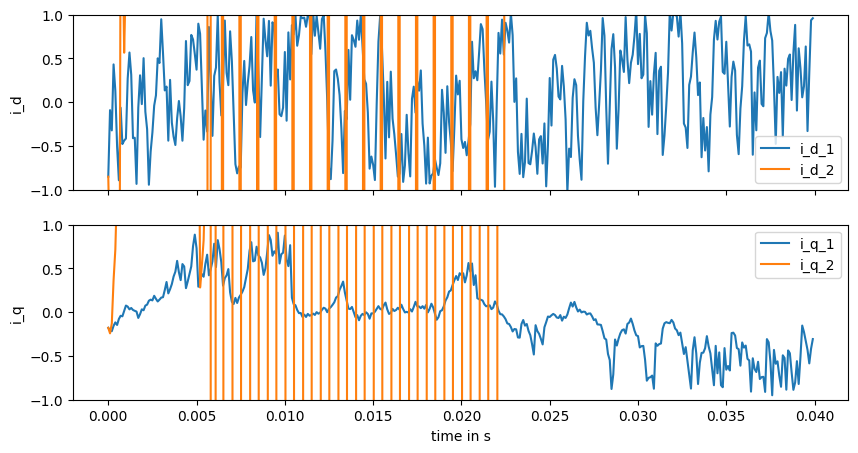

  2%|▏         | 4994/200000 [00:11<06:47, 478.99it/s]

Current val_loss: 3.4421667e+19


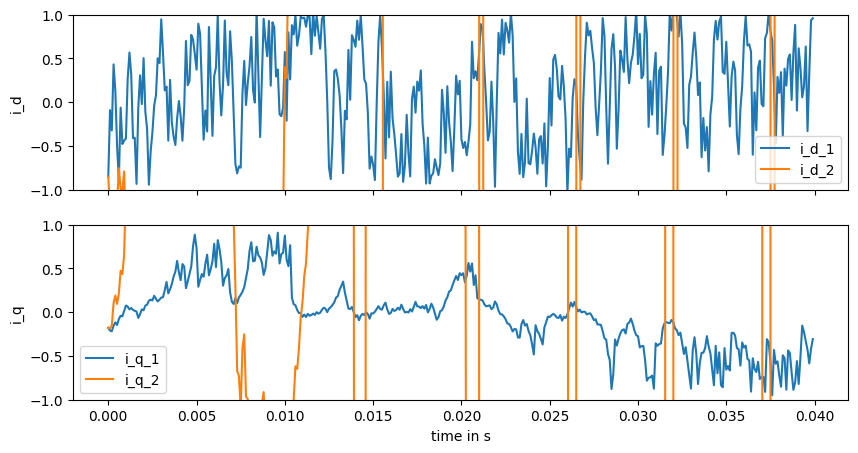

  5%|▍         | 9988/200000 [00:22<06:44, 469.80it/s]

Current val_loss: 179.44318


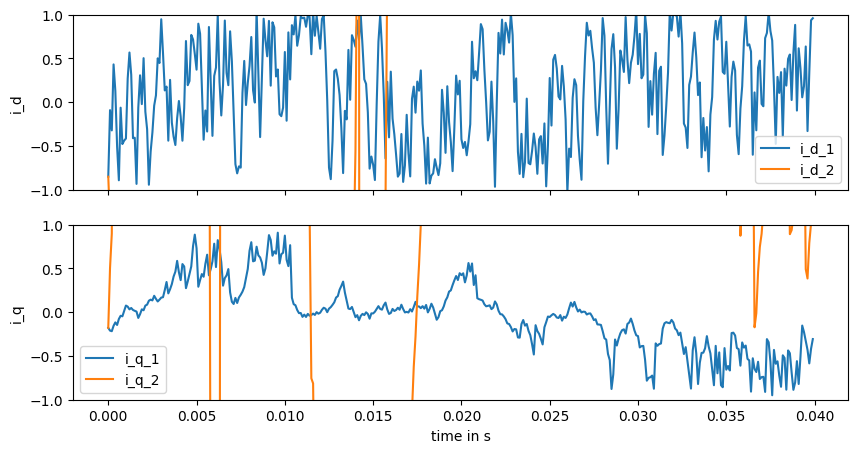

  7%|▋         | 14990/200000 [00:33<06:27, 477.91it/s]

Current val_loss: 1275.2927


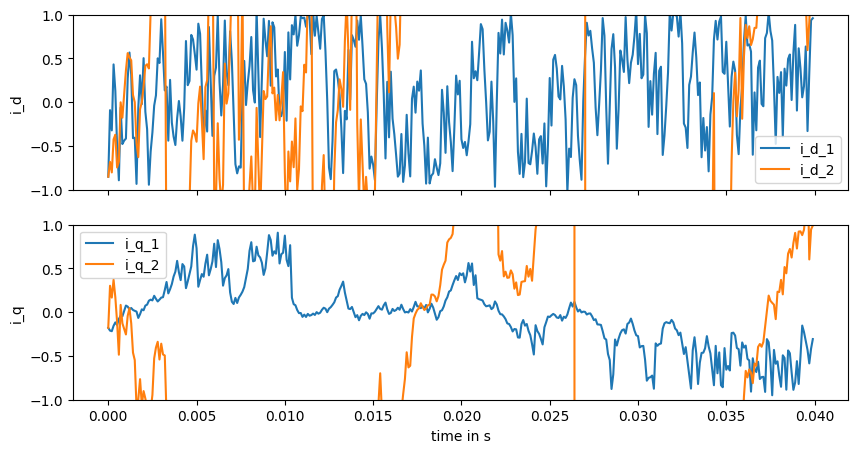

 10%|▉         | 19978/200000 [00:45<06:18, 476.24it/s]

Current val_loss: 25.075895


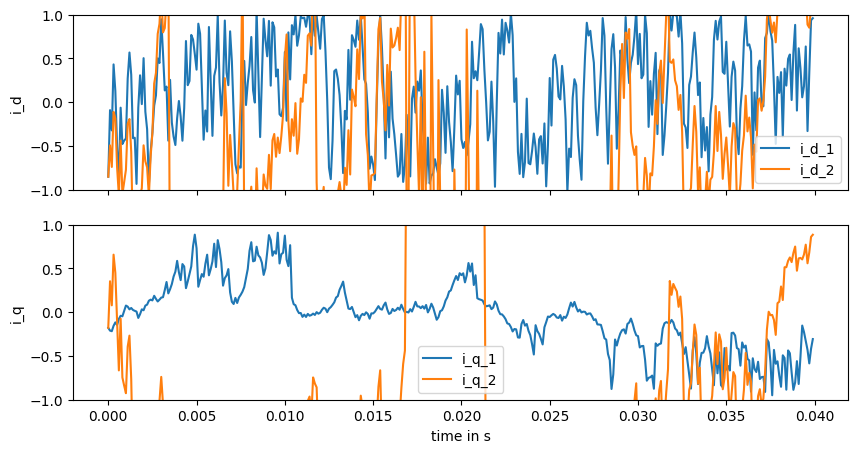

 12%|█▏        | 24966/200000 [00:56<06:02, 482.59it/s]

Current val_loss: 348167070.0


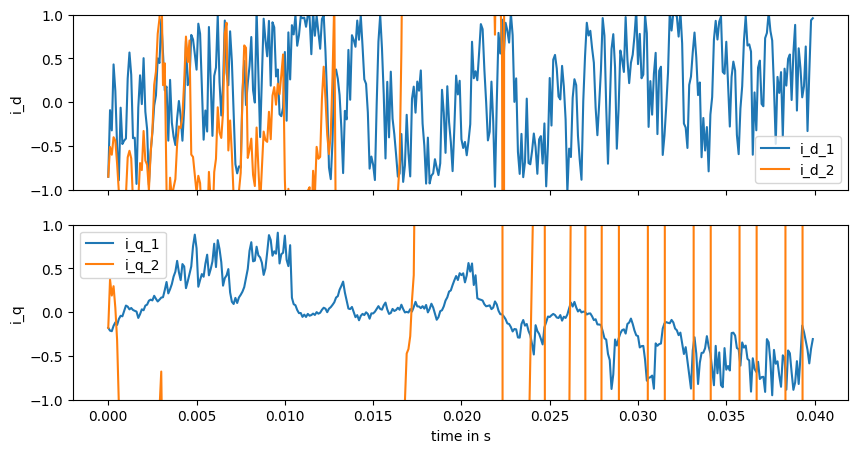

 15%|█▍        | 29955/200000 [01:07<05:51, 483.70it/s]

Current val_loss: 137.86597


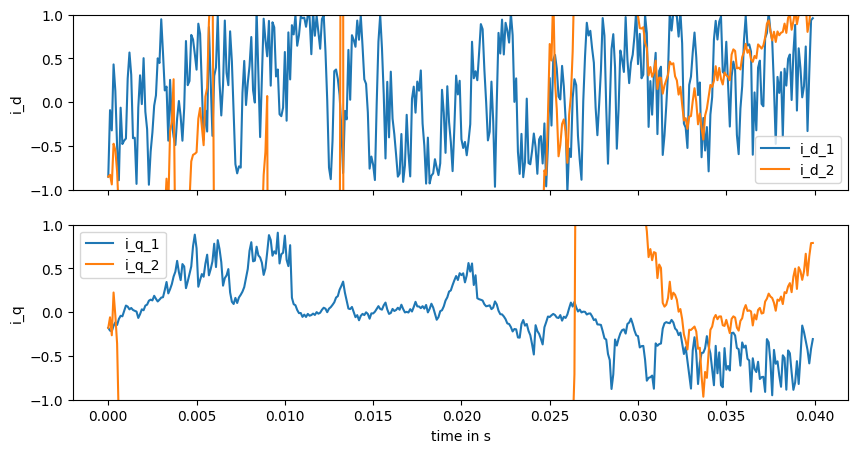

 17%|█▋        | 34964/200000 [01:18<05:42, 481.67it/s]

Current val_loss: 10229.611


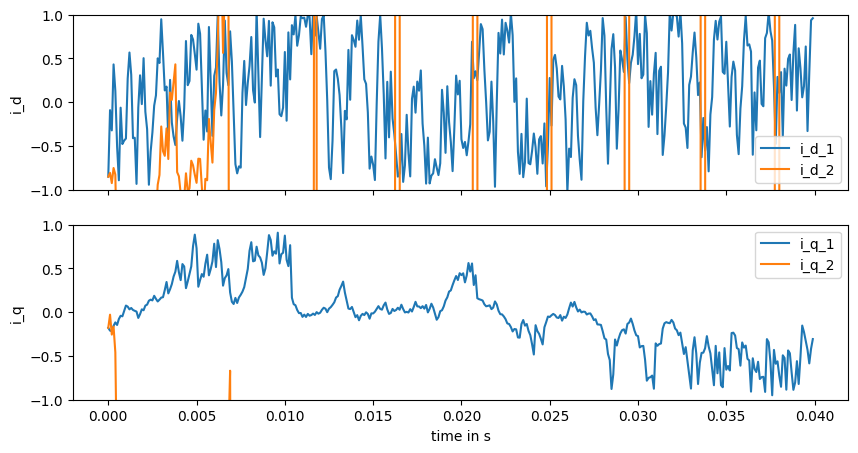

 20%|█▉        | 39968/200000 [01:29<05:35, 477.52it/s]

Current val_loss: 244.35652


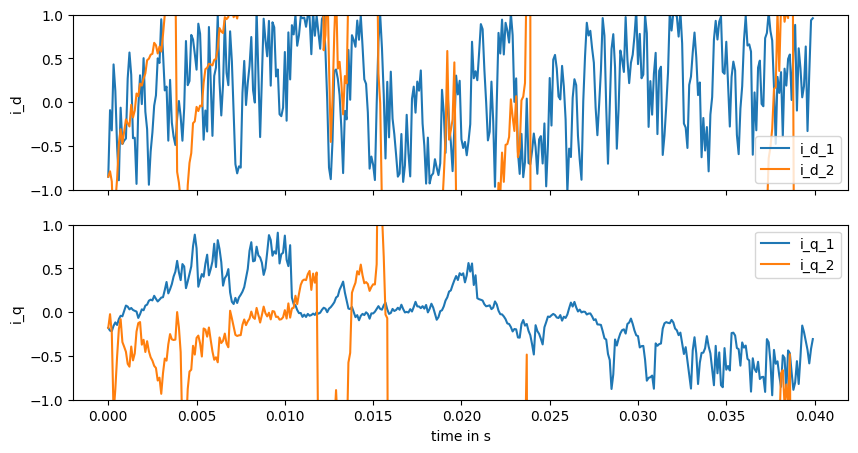

 22%|██▏       | 44992/200000 [01:40<05:23, 479.79it/s]

Current val_loss: 150.2329


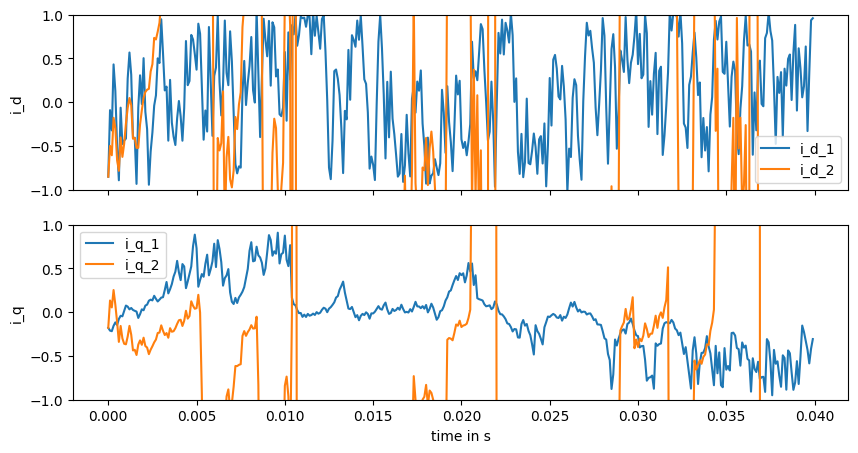

 25%|██▍       | 49991/200000 [01:51<05:13, 478.74it/s]

Current val_loss: 9.093323


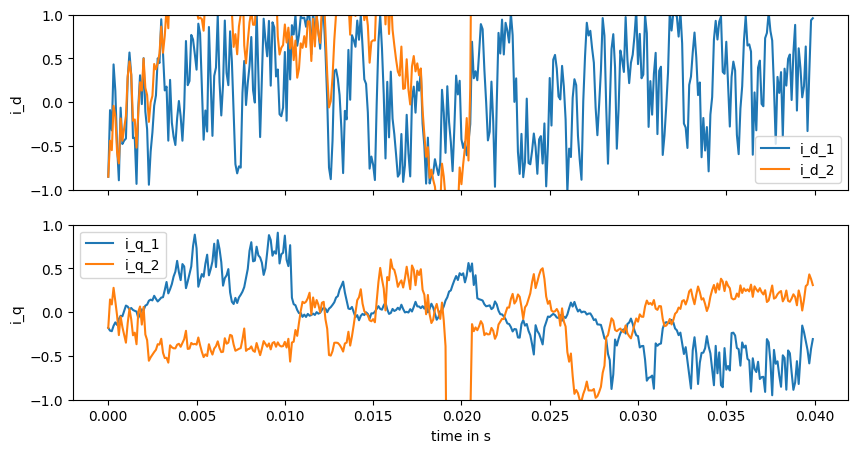

 27%|██▋       | 54998/200000 [02:03<05:24, 447.24it/s]

Current val_loss: nan


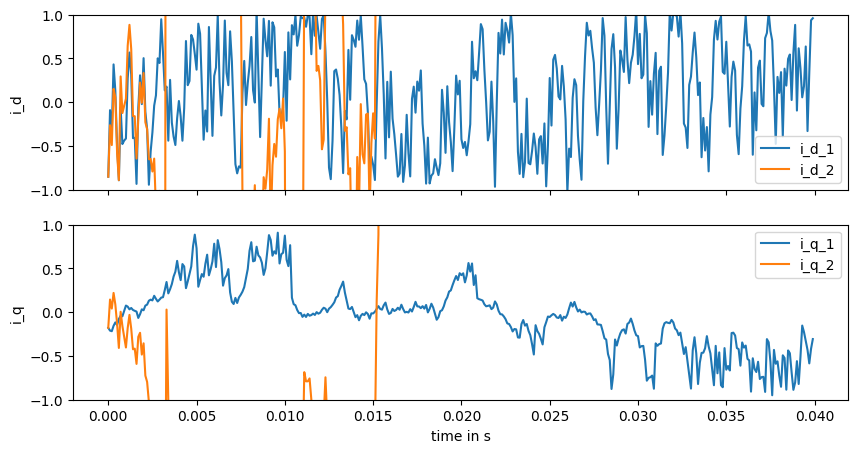

 30%|██▉       | 59976/200000 [02:14<04:53, 477.81it/s]

Current val_loss: 6.248141e+28


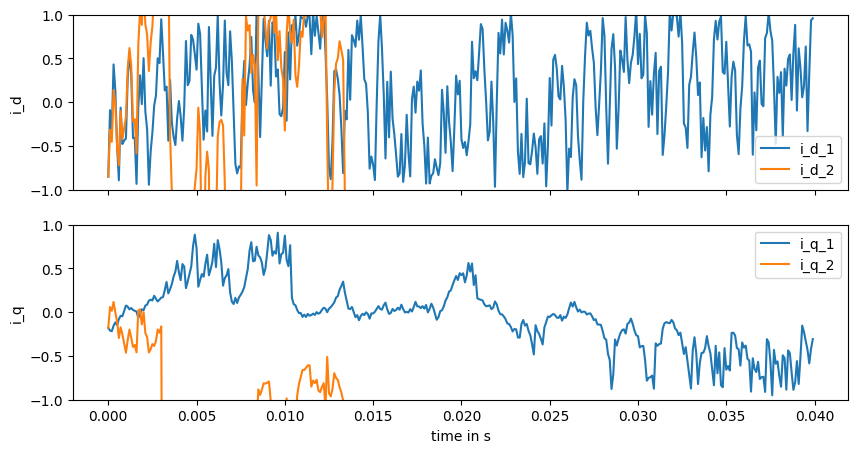

 32%|███▏      | 64982/200000 [02:25<04:42, 477.57it/s]

Current val_loss: 112.05142


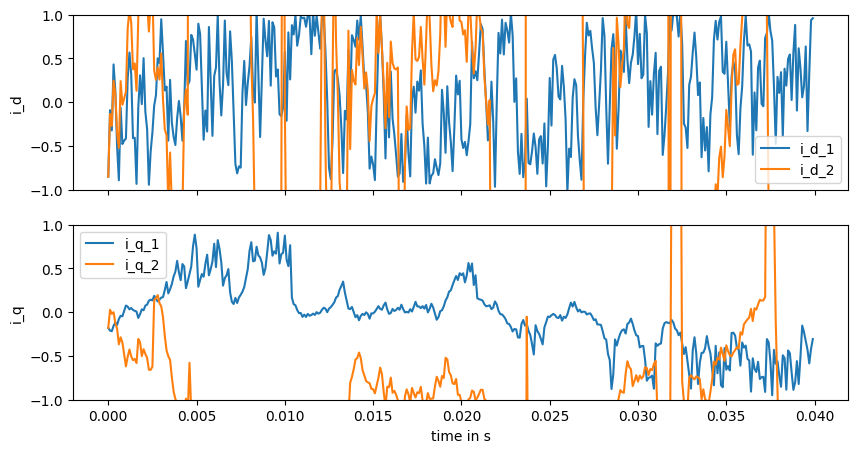

 35%|███▍      | 69973/200000 [02:37<04:31, 479.72it/s]

Current val_loss: 1.3180266e+18


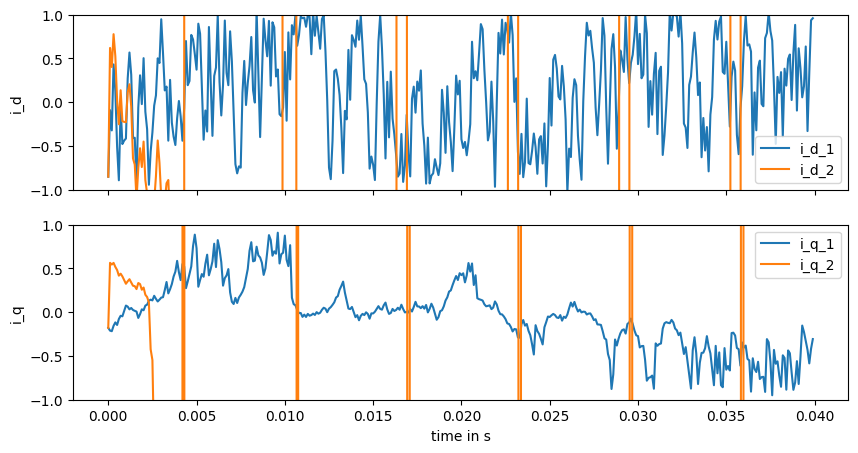

 37%|███▋      | 74966/200000 [02:48<04:29, 463.78it/s]

Current val_loss: inf


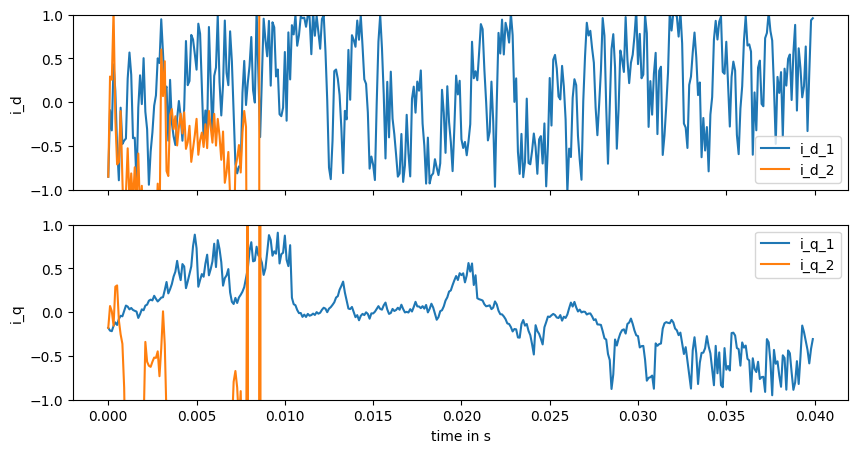

 40%|████      | 80000/200000 [03:00<04:23, 454.81it/s]

Current val_loss: nan


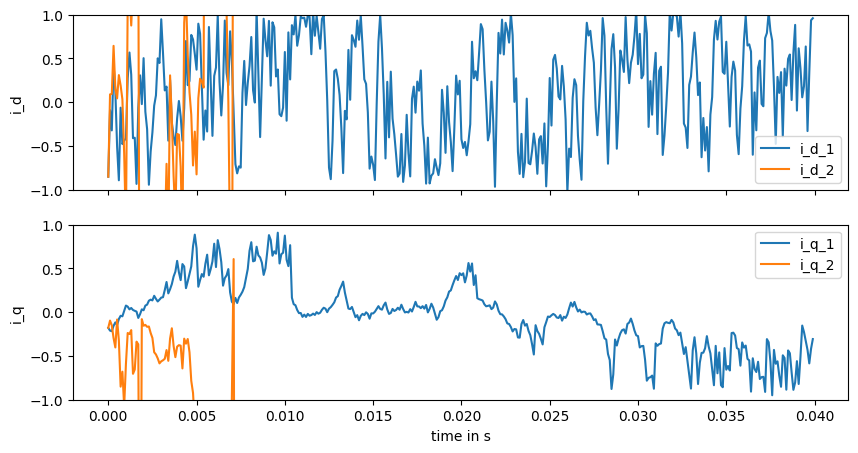

 42%|████▏     | 84956/200000 [03:11<04:11, 457.59it/s]

Current val_loss: nan


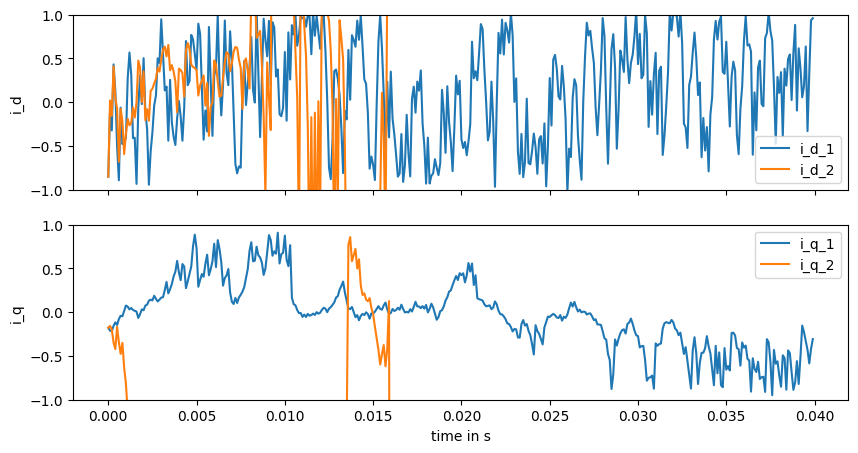

 45%|████▍     | 89994/200000 [03:23<03:59, 458.65it/s]

Current val_loss: nan


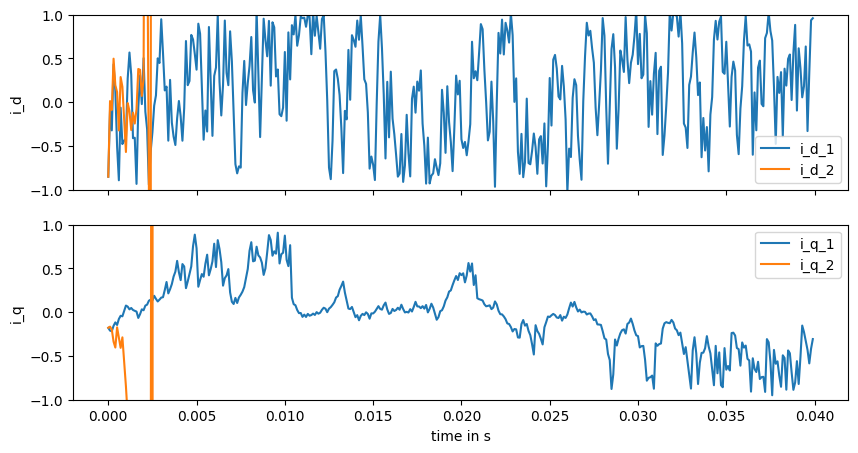

 47%|████▋     | 94960/200000 [03:34<03:43, 470.49it/s]

Current val_loss: nan


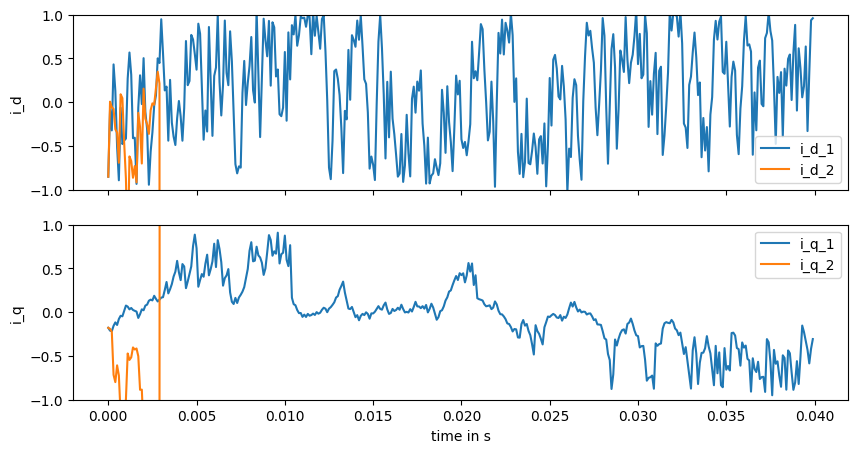

 50%|████▉     | 99965/200000 [03:45<03:34, 466.94it/s]

Current val_loss: nan


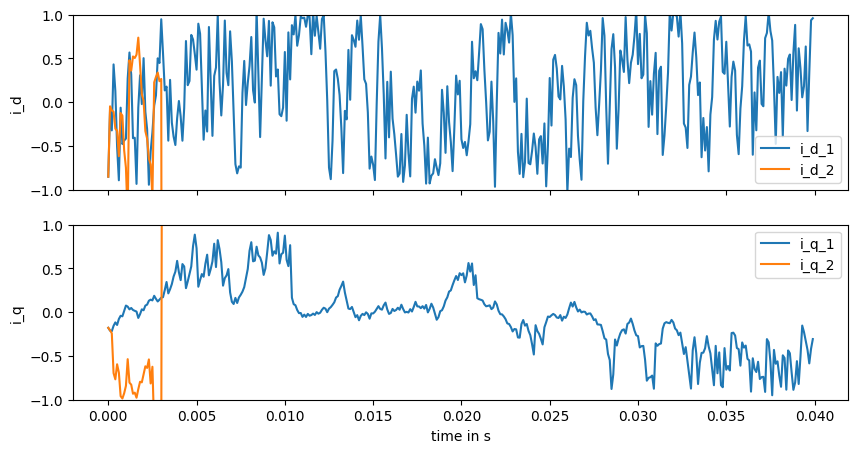

 52%|█████▏    | 104963/200000 [03:57<03:21, 471.70it/s]

Current val_loss: nan


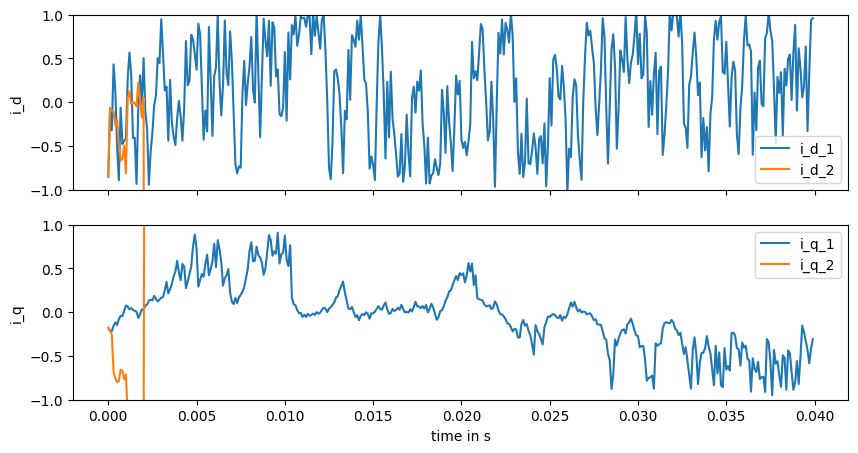

 55%|█████▍    | 109964/200000 [04:09<03:12, 467.33it/s]

Current val_loss: nan


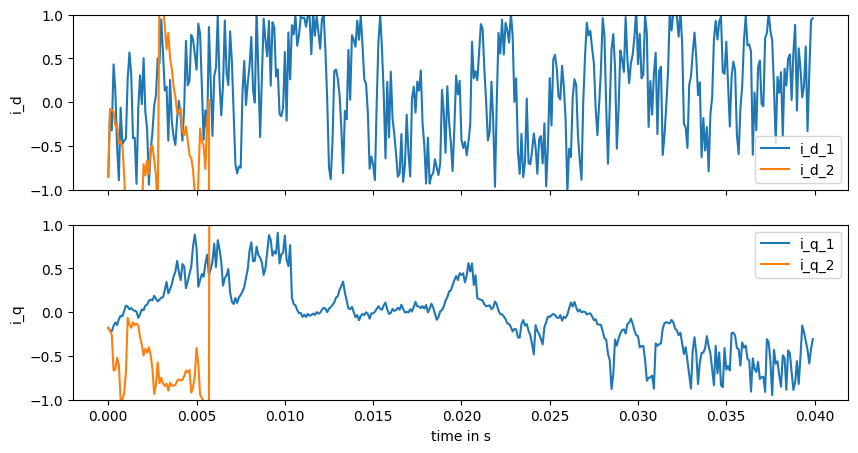

 57%|█████▋    | 114975/200000 [04:20<03:04, 459.71it/s]

Current val_loss: nan


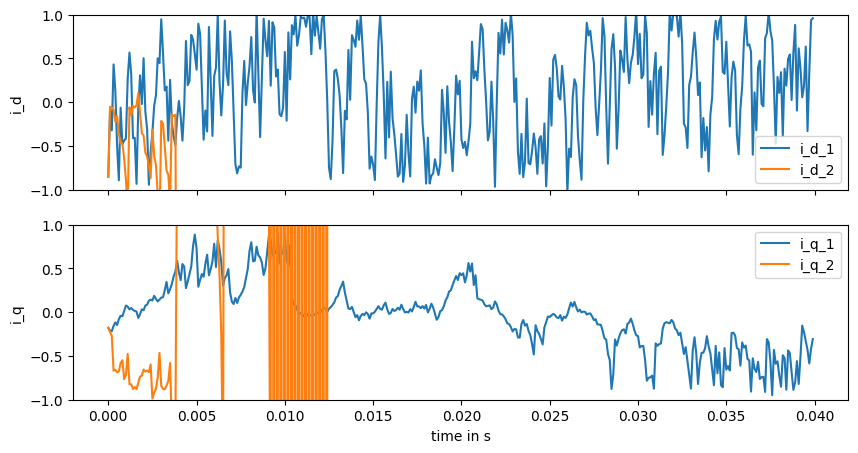

 60%|█████▉    | 119971/200000 [04:32<02:51, 467.82it/s]

Current val_loss: inf


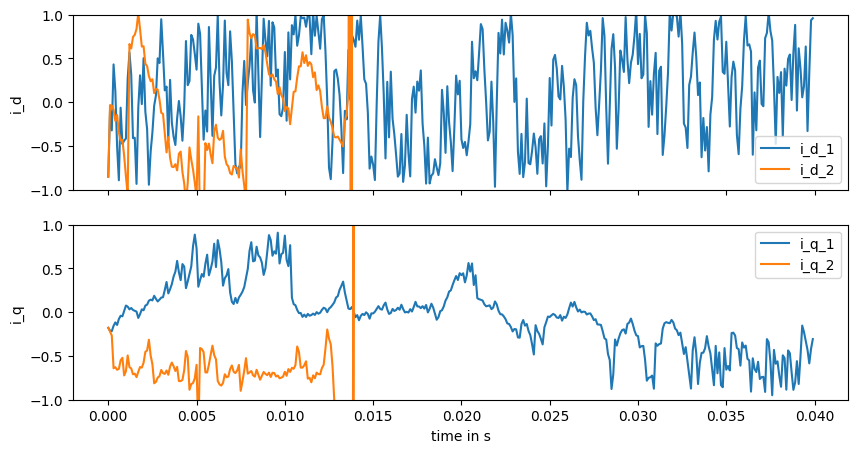

 62%|██████▏   | 124992/200000 [04:43<02:38, 474.14it/s]

Current val_loss: nan


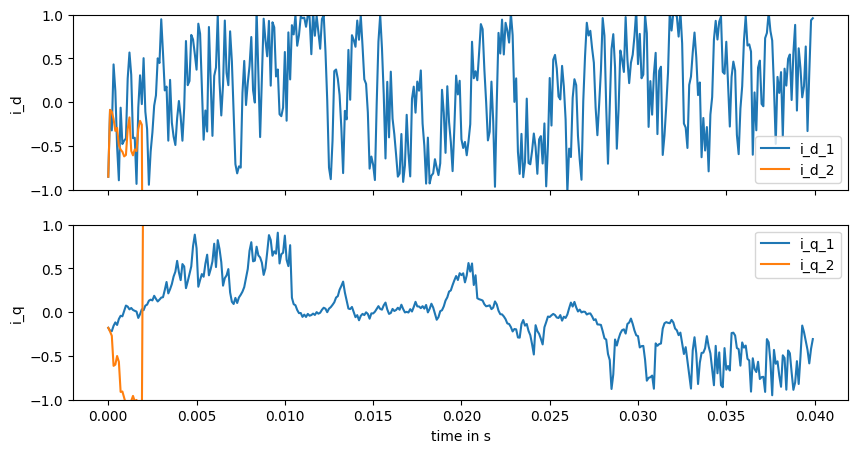

 65%|██████▍   | 129972/200000 [04:54<02:24, 486.00it/s]

Current val_loss: nan


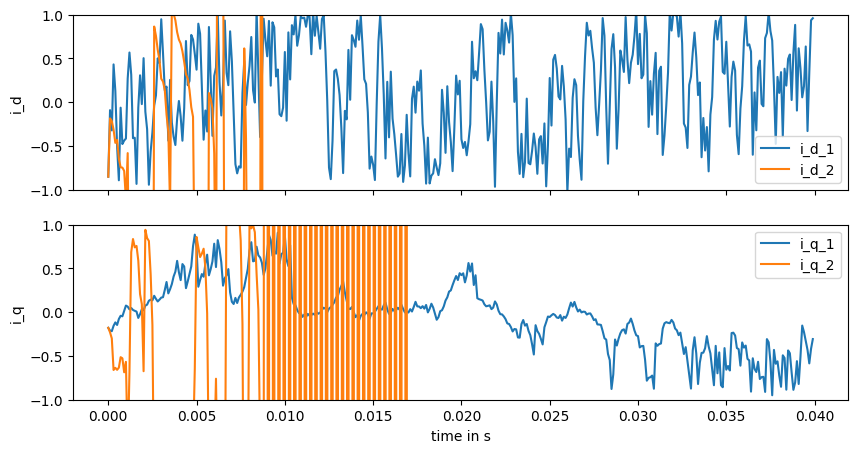

 67%|██████▋   | 134982/200000 [05:05<02:16, 475.81it/s]

Current val_loss: nan


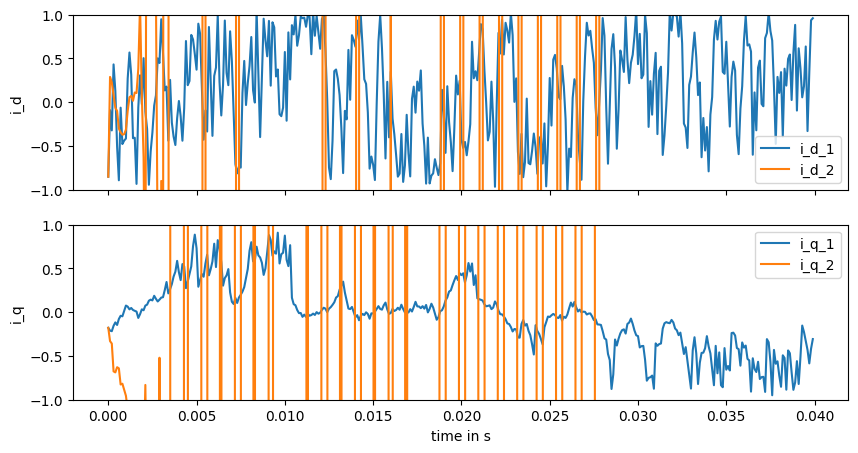

 70%|██████▉   | 139977/200000 [05:17<02:07, 470.78it/s]

Current val_loss: nan


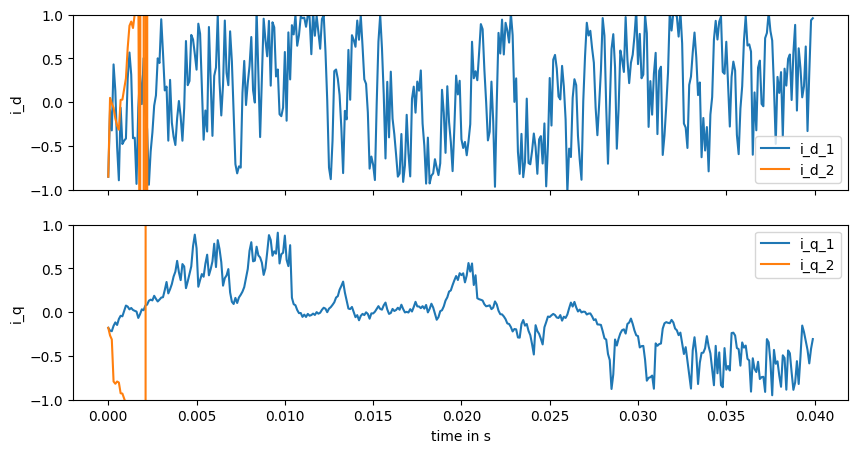

 72%|███████▏  | 144976/200000 [05:28<01:57, 470.00it/s]

Current val_loss: nan


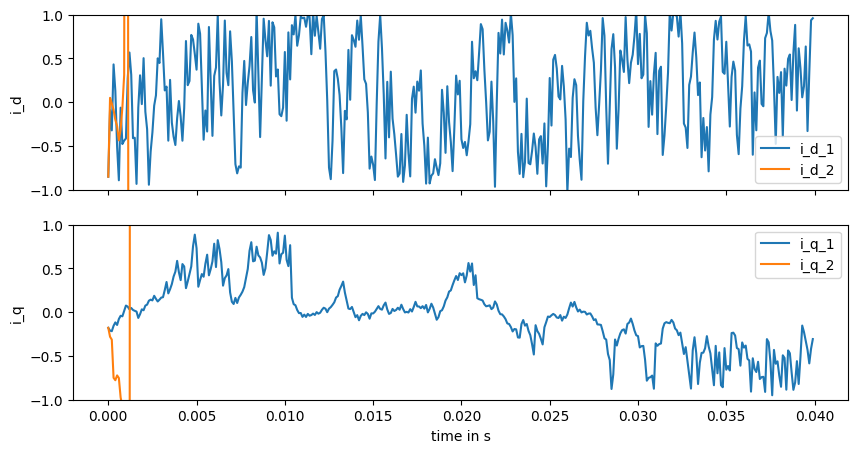

 75%|███████▍  | 149982/200000 [05:39<01:45, 474.29it/s]

Current val_loss: nan


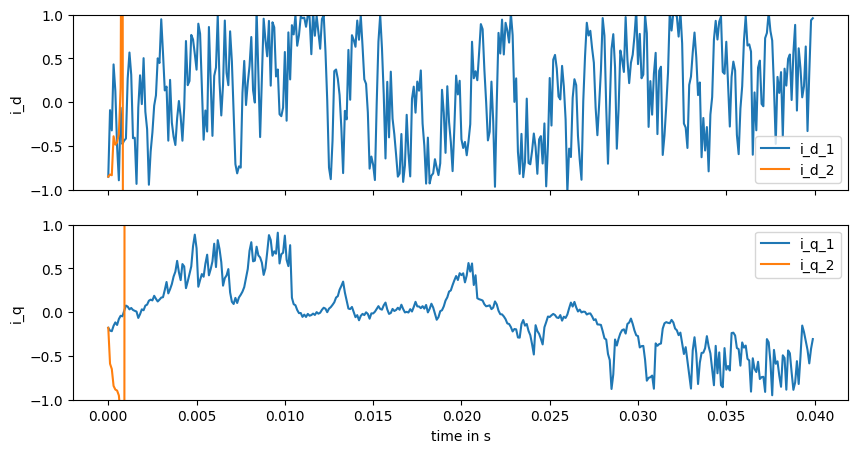

 77%|███████▋  | 154964/200000 [05:51<01:38, 457.96it/s]

Current val_loss: nan


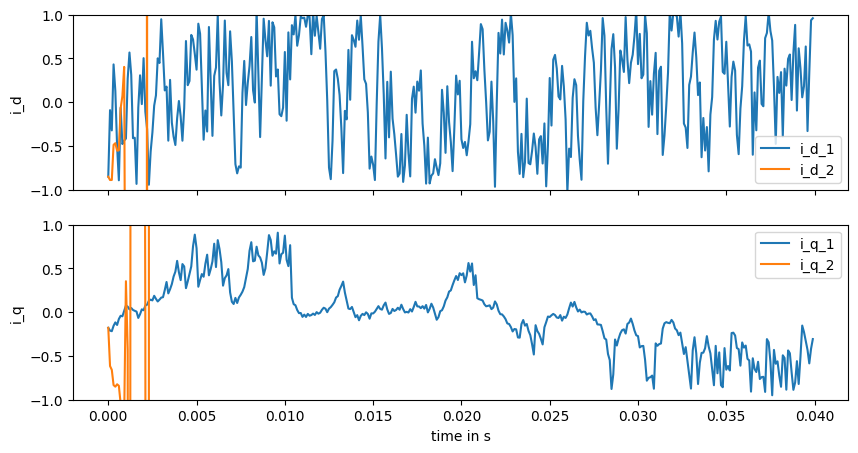

 80%|███████▉  | 159961/200000 [06:02<01:58, 338.58it/s]

Current val_loss: nan


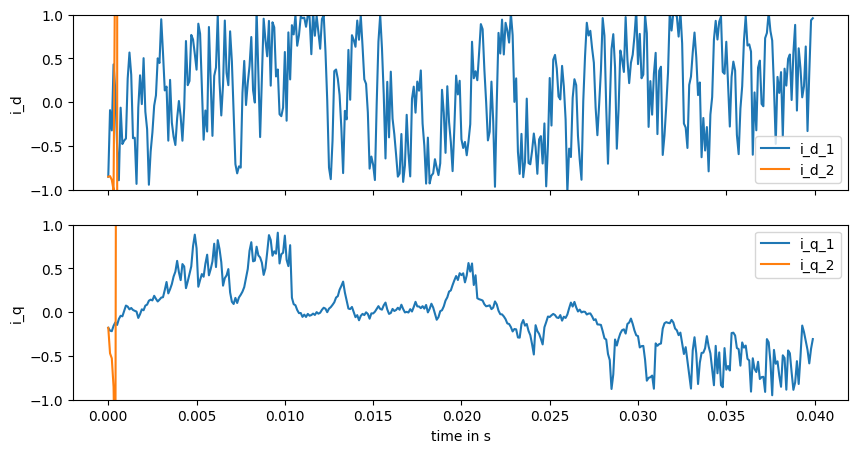

 82%|████████▏ | 164975/200000 [06:14<01:15, 461.19it/s]

Current val_loss: nan


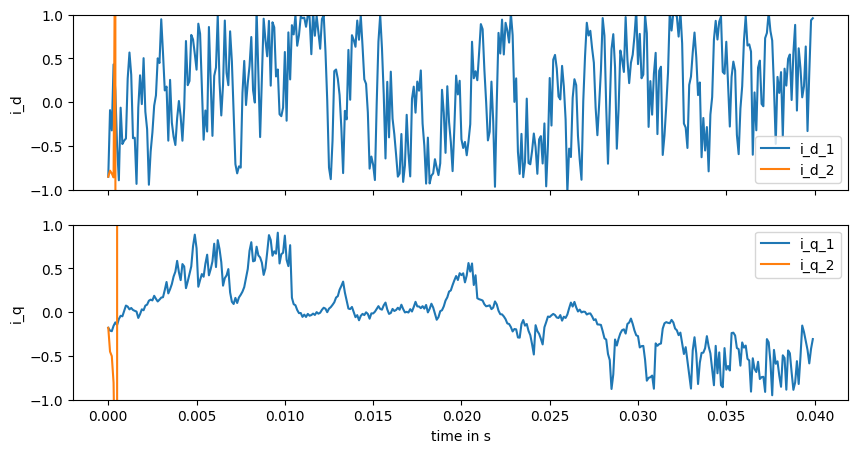

 85%|████████▍ | 169985/200000 [06:26<01:04, 461.98it/s]

Current val_loss: nan


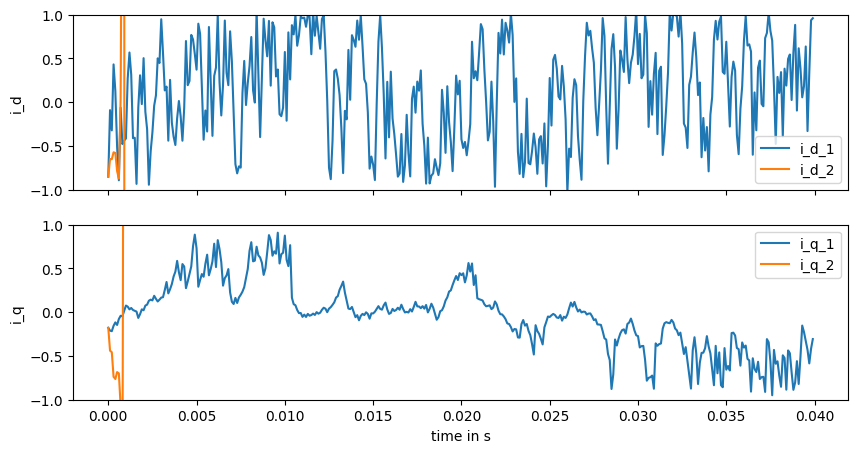

 87%|████████▋ | 174999/200000 [06:37<00:56, 440.34it/s]

Current val_loss: nan


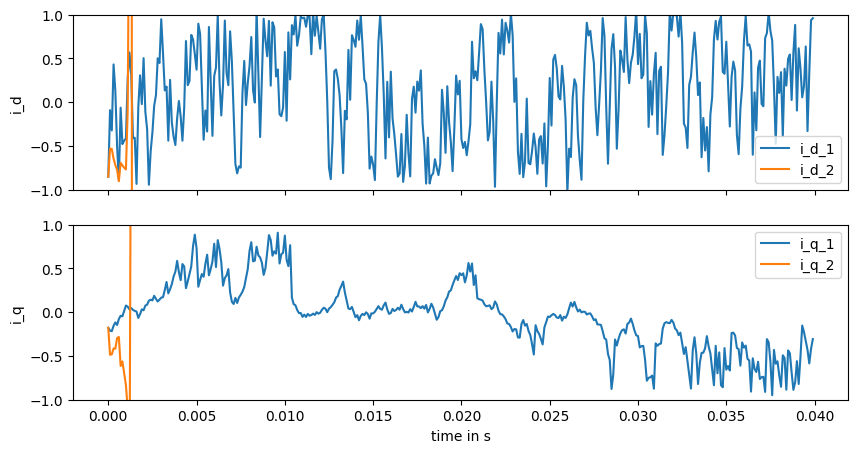

 90%|████████▉ | 179957/200000 [06:49<00:42, 475.68it/s]

Current val_loss: nan


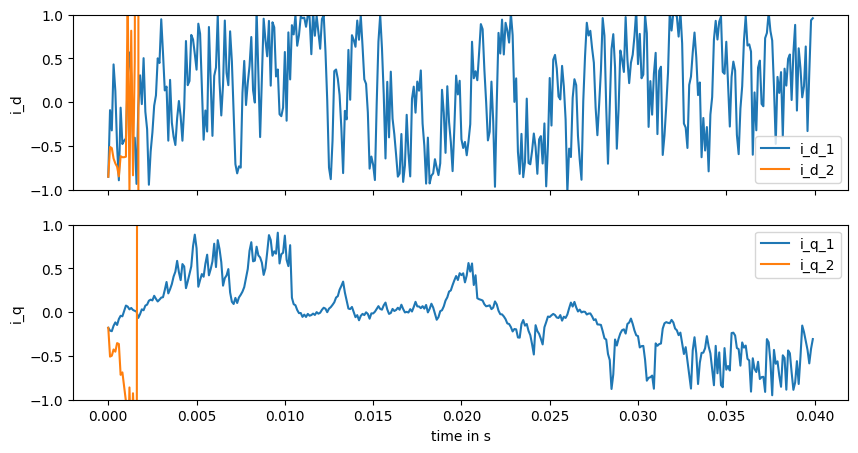

 92%|█████████▏| 184968/200000 [07:00<00:32, 469.37it/s]

Current val_loss: nan


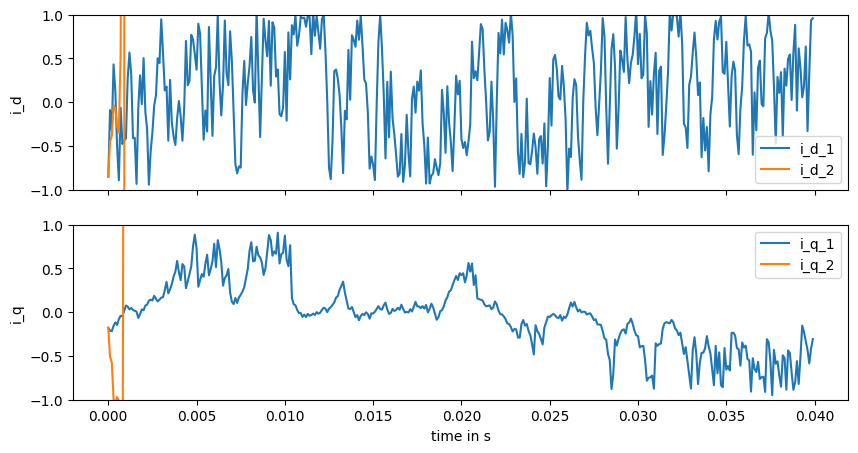

 95%|█████████▍| 189989/200000 [07:12<00:22, 449.64it/s]

Current val_loss: nan


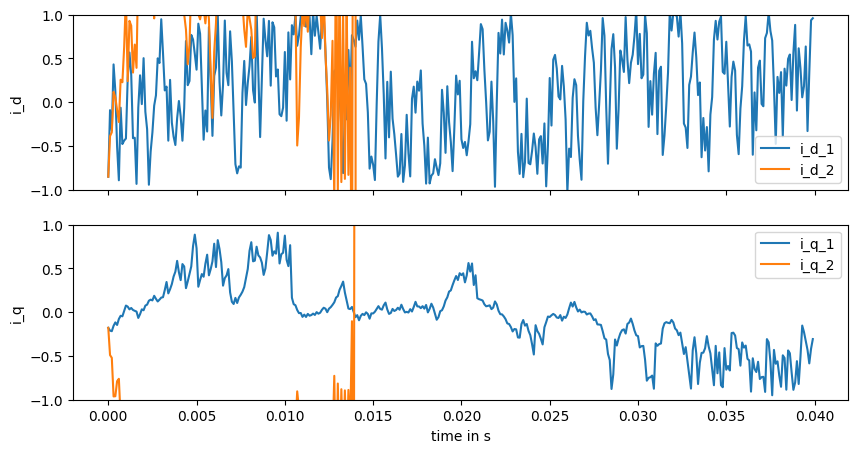

 97%|█████████▋| 194986/200000 [07:23<00:11, 449.44it/s]

Current val_loss: nan


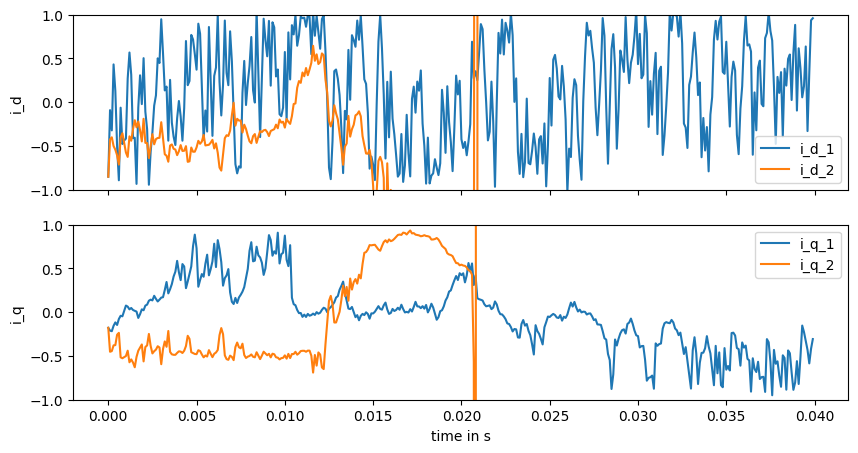

100%|██████████| 200000/200000 [07:35<00:00, 439.35it/s]


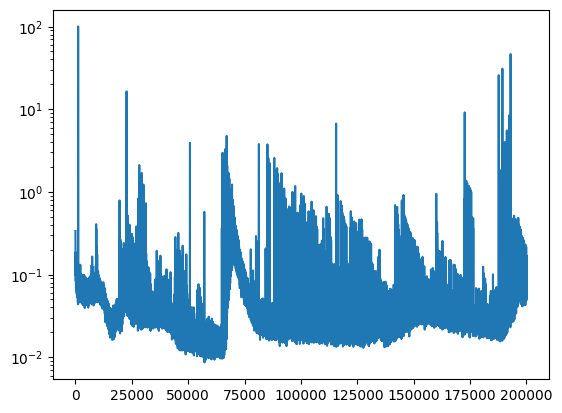

In [16]:
fin_node_1,fin_opt_state,fin_keys,losses, val_losses=mtrainer.fit_non_jit(node,opt_state,keys,plot_every=5000)
plt.plot(losses)
plt.yscale('log')

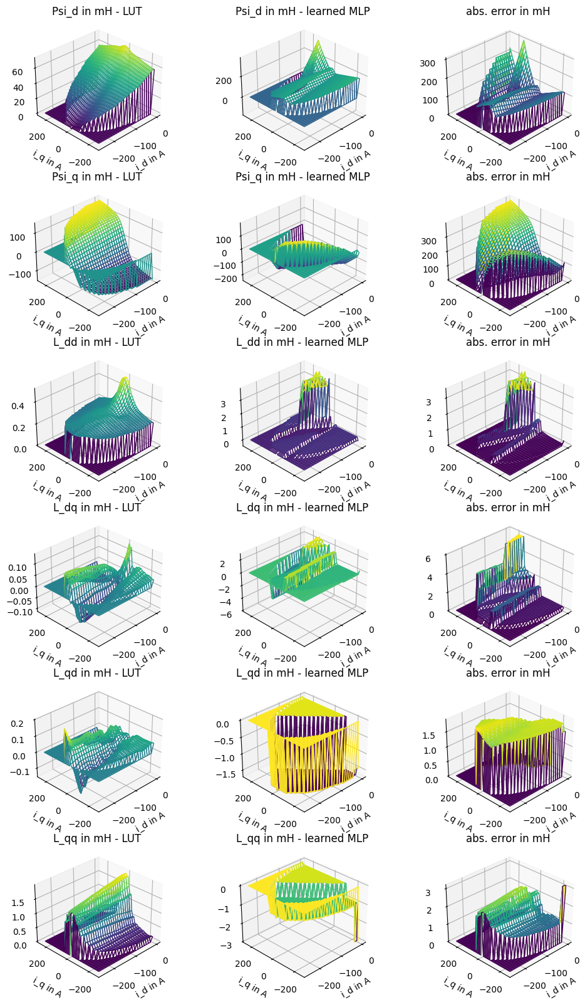

In [19]:
eval_psi_and_L(fin_node_1)

In [20]:
motor_env = PMSM(
    saturated=True,
    LUT_motor_name="BRUSA",
    batch_size=1,
    control_state=[], 
    static_params = {
            "p": 3,
            "r_s": 15e-3,
            "l_d": 0.37e-3,
            "l_q": 1.2e-3,
            "psi_p": 65.6e-3,
            "deadtime": 0,
    })

In [21]:
@eqx.filter_jit
def reset(node,rng):
    obs, _ = motor_env.reset(motor_env.env_properties, rng)  #
    obs = obs.at[2].set((3*1500 / 60 * 2 * jnp.pi) / (2 * jnp.pi * 3 * 11000 / 60))
    return obs

In [22]:
@eqx.filter_jit
def node_dat_gen_sin(node,reset_env, rng, traj_len):
    rng, subkey = jax.random.split(rng)
    ref_obs = reset_env(node,subkey) 
    rng, subkey = jax.random.split(rng)
    init_obs = reset_env(node,subkey)  
    return init_obs, ref_obs, rng

In [23]:
@eqx.filter_jit
def featurize(obs,ref_obs, featurize_state=jnp.array([0,0])):
    feat_obs=jnp.concatenate([obs[0:2],ref_obs[0:2],ref_obs[0:2]-obs[0:2],featurize_state])#jnp.concatenate([obs[0:2],obs[6:8],ref_obs[0:2],ref_obs[0:2]-obs[0:2],featurize_state])
    #featurize_state=jnp.clip(featurize_state + ref_obs[0:2]-obs[0:2],min=-1,max=1) * (jnp.sign(0.01-jnp.sum((ref_obs[0:2]-obs[0:2])**2))*0.5+0.5)
    return feat_obs,featurize_state

In [24]:
@eqx.filter_jit
def mse_loss(feat_obs):
    loss=jnp.mean(jnp.sum((feat_obs[:,4:6])**2,axis=1))#be aware of idx if changing featurize
    return loss

In [25]:
@eqx.filter_jit
def penalty_loss(feat_obs):
    loss=jnp.array([0])
    return loss

In [26]:
jax_key = jax.random.PRNGKey(2)
policy=MLP([8,64,64,64,2],key=jax_key)
optimizer = optax.adam(5e-4)
opt_state = optimizer.init(policy)

In [27]:
data_batch_size=100
trainer=DPCTrainer(
    batch_size=data_batch_size,
    train_steps=2000,
    horizon_length=5,
    reset_env=reset,
    data_gen_sin=node_dat_gen_sin,
    featurize=featurize,
    policy_optimizer=optimizer,
    ref_loss=mse_loss,
    constr_penalty=penalty_loss,
    ref_loss_weight=1)
keys=jax.vmap(jax.random.PRNGKey)(np.random.randint(0, 2**31, size=(data_batch_size,)))
#key=jax.vmap(jax.random.PRNGKey)(jnp.linspace(0,1000,1001).astype(int))

In [28]:
import matplotlib.pyplot as plt
from utils.evaluation import steps_eval

In [29]:
def featurize_node(obs):
    return jnp.concatenate([obs[0:2],obs[4:6]])

  0%|          | 0/2000 [00:00<?, ?it/s]

100%|██████████| 2000/2000 [00:25<00:00, 77.37it/s] 


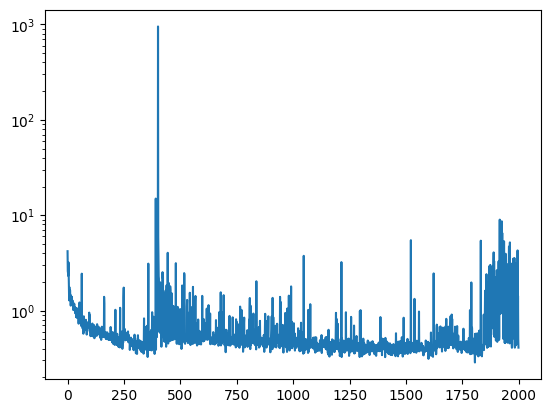

In [30]:
fin_policy_psi_node,fin_opt_state,fin_keys,losses=trainer.fit_on_node_non_jit(policy, node, motor_env.tau, featurize_node, keys, opt_state)
plt.plot(losses)
plt.yscale('log')

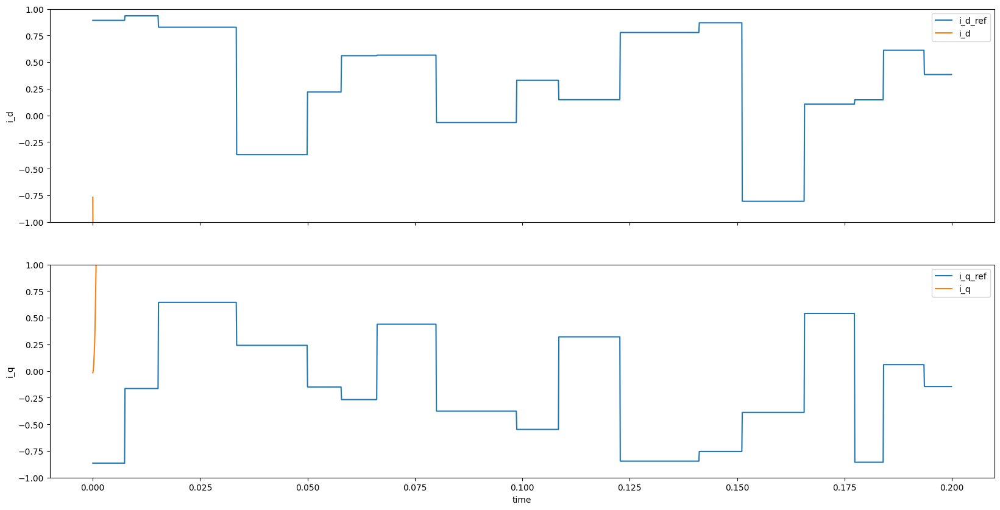

In [31]:
obs,obs2,acts=steps_eval(motor_env,reset,fin_policy_psi_node,featurize,jax.random.PRNGKey(765),2000)

In [28]:
from utils.signals import steps_ref_traj

rng=jax.random.PRNGKey(24)
ref_len=50000
rng, subkey = jax.random.split(rng)
obs_ref = steps_ref_traj(motor_env, reset_env, subkey, ref_len, step_lens=[20,100])
rng, subkey = jax.random.split(rng)
init_obs= reset_env(motor_env,subkey)
long_obs, long_acts = rollout_traj_env_policy(fin_policy2, init_obs, obs_ref, ref_len, motor_env, featurize)

def data_gen_single(rng, sequence_len):
    rng, subkey = jax.random.split(rng)
    idx = jax.random.randint(subkey, shape=(1,),minval=0, maxval=(long_obs.shape[0]-sequence_len-1))

    slice = jnp.linspace(
            start=idx, stop=idx + sequence_len, num=sequence_len+1, dtype=int
        ).T
    act_slice = jnp.linspace(
            start=idx, stop=idx + sequence_len-1, num=sequence_len, dtype=int
        ).T
    
    obs=long_obs[slice][0]
    acts=long_acts[act_slice][0]
    return obs,acts,rng

def data_gen_single_non_predef(rng, sequence_len):
    rng, subkey = jax.random.split(rng)
    ref_obs = reset_env(motor_env,subkey) 
    rng, subkey = jax.random.split(rng)
    init_obs = reset_env(motor_env,subkey)
    obs,acts=rollout_traj_env_policy(fin_policy2, init_obs, ref_obs, sequence_len, motor_env, featurize)
    return obs,acts,rng

rng=jax.random.PRNGKey(245)
ref_len=400
rng, subkey = jax.random.split(rng)
obs_ref_val = steps_ref_traj(motor_env, reset_env, subkey, ref_len, step_lens=[20,50])
rng, subkey = jax.random.split(rng)
init_obs_val = reset_env(motor_env,subkey)
obs_val, acts_val = rollout_traj_env_policy(fin_policy2, init_obs_val, obs_ref_val, ref_len, motor_env, featurize)
@eqx.filter_jit
def val_data_gen_single(rng, sequence_len):
    obs=obs_val
    acts=acts_val
    return obs,acts,rng

In [29]:
jax_key = jax.random.PRNGKey(4)
node = ExpertModel(motor_env=motor_env,psi_layer_sizes=[2,32,32,1],L_layer_sizes=[2,32,32,1],key=jax_key)#NeuralEulerODE([4,128,128,128,128,2],key=jax_key)
optimizer_node = optax.adam(1e-4)
opt_state = optimizer_node.init(node)

In [30]:
batch_size=100
mtrainer=ModelTrainer(
    train_steps=300_000,
    batch_size=batch_size,
    sequence_len=1,
    featurize=featurize_node,
    train_data_gen_sin=data_gen_single_non_predef,
    val_data_gen_sin= val_data_gen_single,
    model_optimizer=optimizer_node,
    tau= motor_env.tau
    )
keys=jax.vmap(jax.random.PRNGKey)(np.random.randint(0, 2**31, size=(batch_size,)))

  0%|          | 0/300000 [00:00<?, ?it/s]

Current val_loss: 11797.311648529927


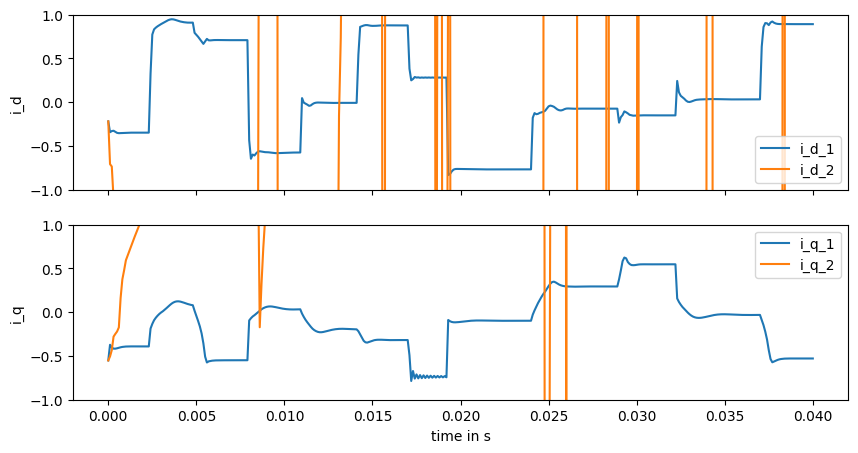

  1%|          | 1987/300000 [00:26<18:06, 274.24it/s] 

Current val_loss: 97497315.03259774


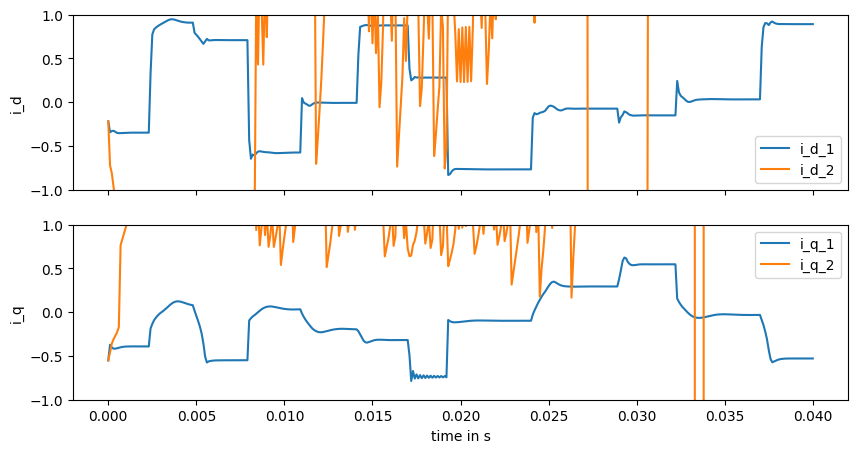

  1%|▏         | 3975/300000 [00:34<17:59, 274.25it/s] 

Current val_loss: 6595.347718315087


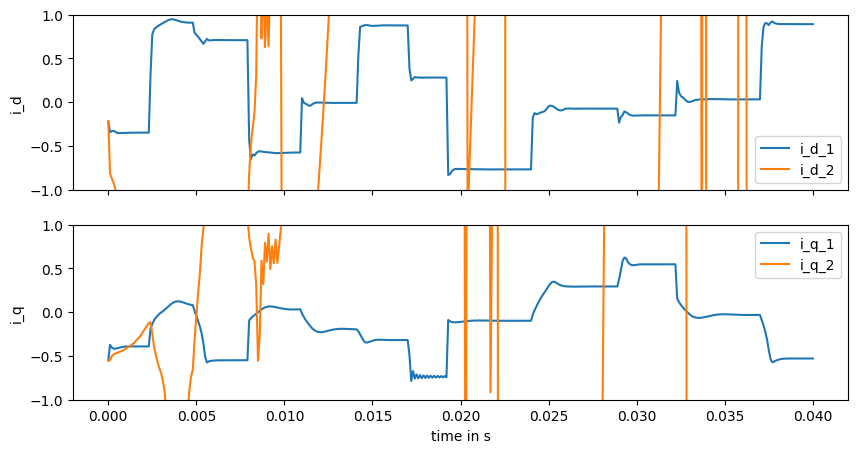

  2%|▏         | 5991/300000 [00:43<17:39, 277.48it/s] 

Current val_loss: 294829997.6749315


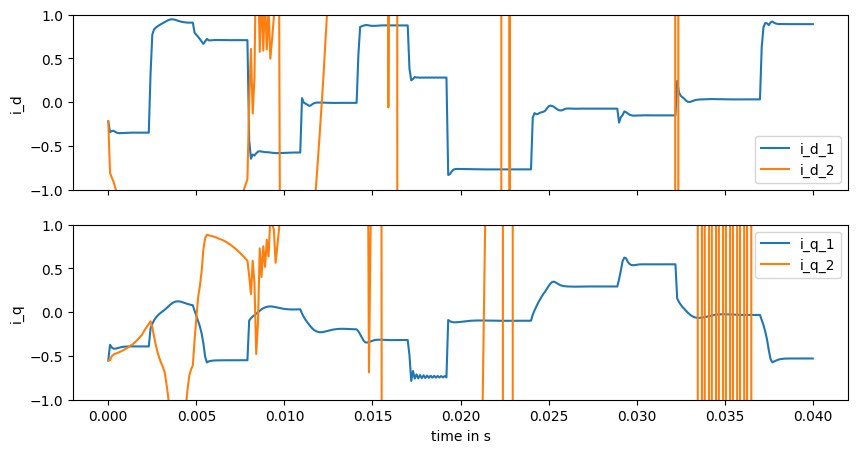

  3%|▎         | 7974/300000 [00:51<17:34, 276.88it/s] 

Current val_loss: 483030241134.6884


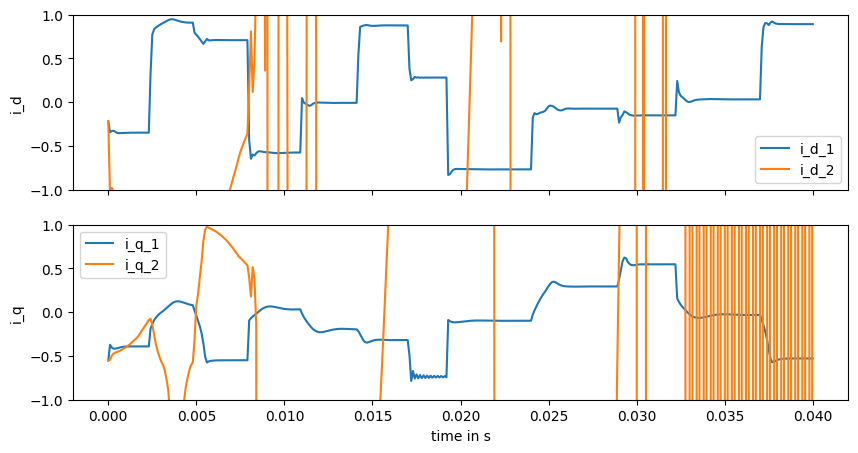

  3%|▎         | 9988/300000 [00:59<17:34, 275.13it/s] 

Current val_loss: 3829.2276128753456


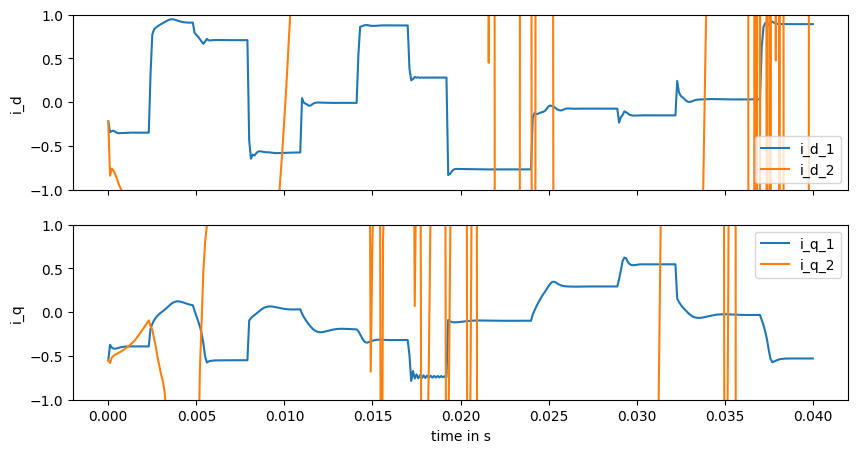

  4%|▍         | 11985/300000 [01:08<17:18, 277.23it/s] 

Current val_loss: 2226310.571388818


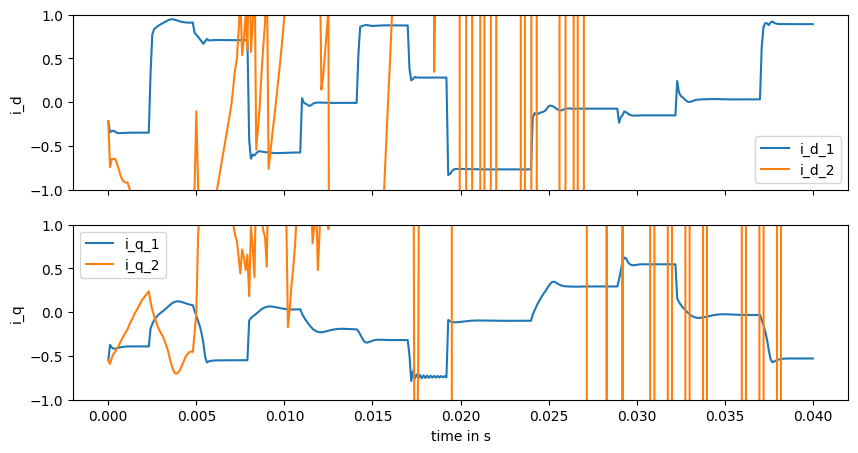

  5%|▍         | 13974/300000 [01:16<17:11, 277.36it/s] 

Current val_loss: 2493.0045793673785


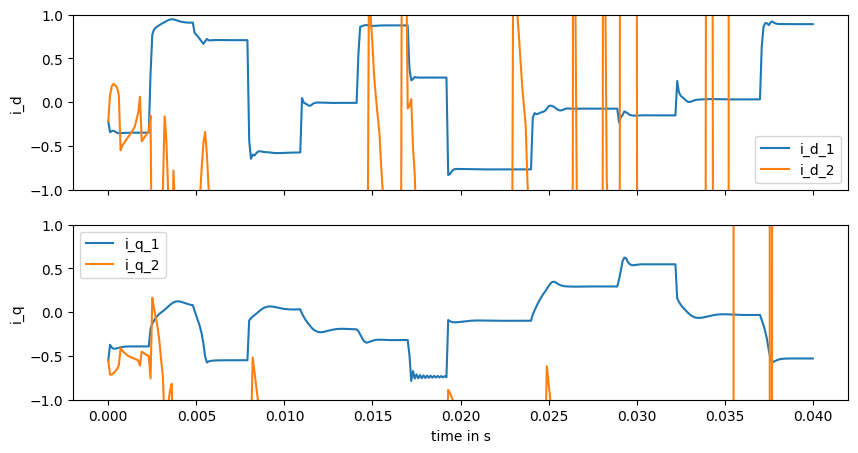

  5%|▌         | 15989/300000 [01:24<17:04, 277.30it/s] 

Current val_loss: 1088225534.1789918


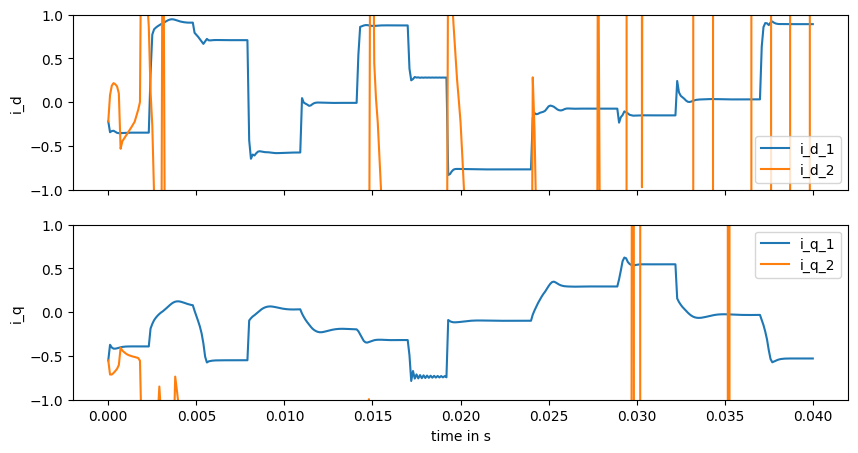

  6%|▌         | 18000/300000 [01:32<16:55, 277.77it/s] 

Current val_loss: 1462.5342538714206


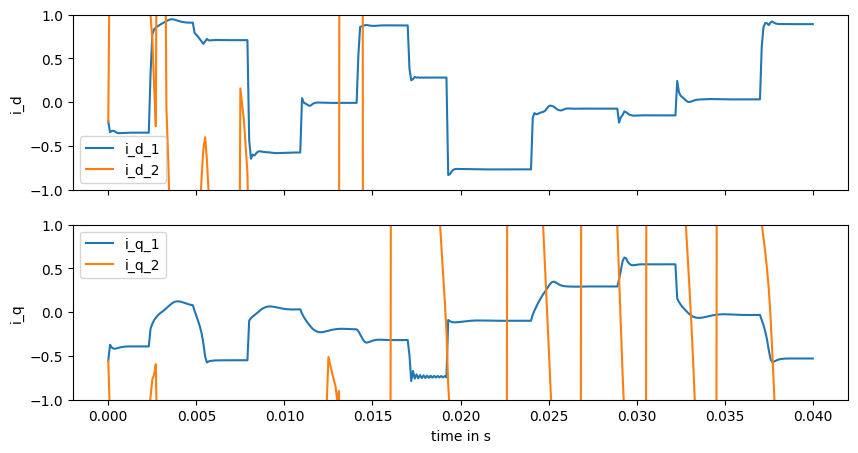

  7%|▋         | 19979/300000 [01:40<16:50, 277.24it/s] 

Current val_loss: 15.38380615340306


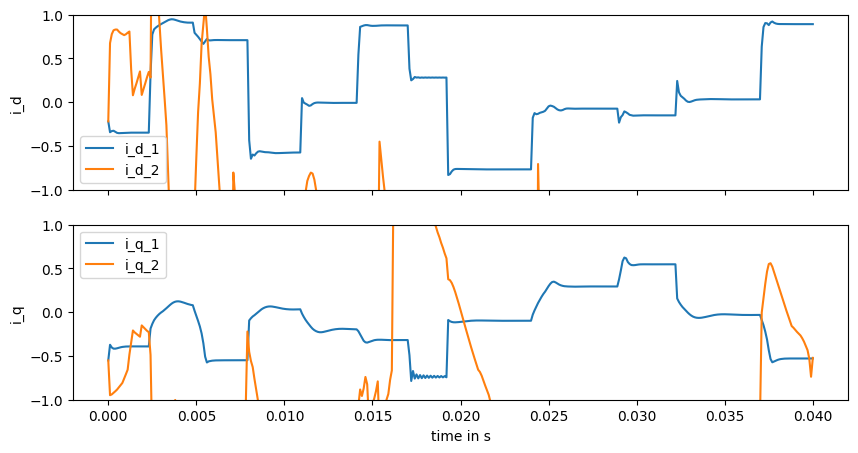

  7%|▋         | 21992/300000 [01:48<16:45, 276.38it/s] 

Current val_loss: 358.56761593733484


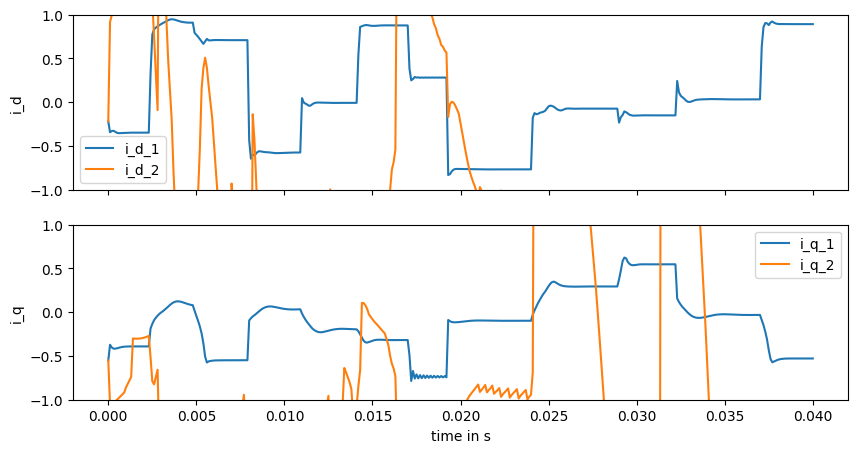

  8%|▊         | 23980/300000 [01:56<16:40, 275.98it/s] 

Current val_loss: 17.102398095482314


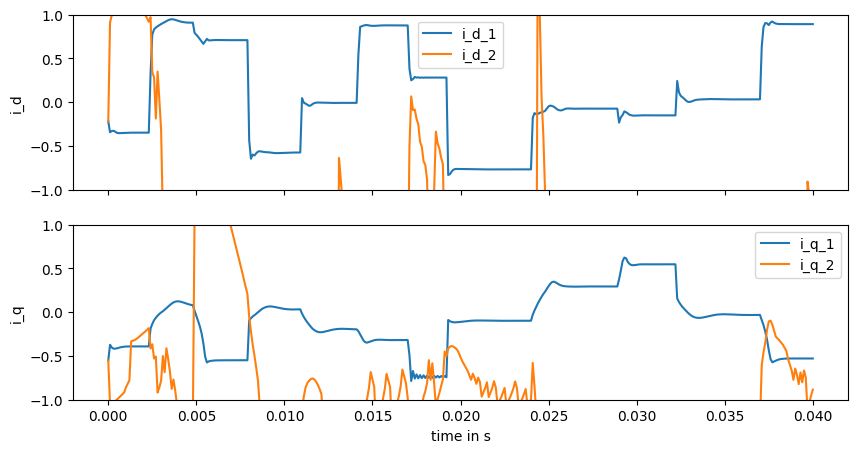

  9%|▊         | 25992/300000 [02:05<16:30, 276.76it/s] 

Current val_loss: 1687.5938565550964


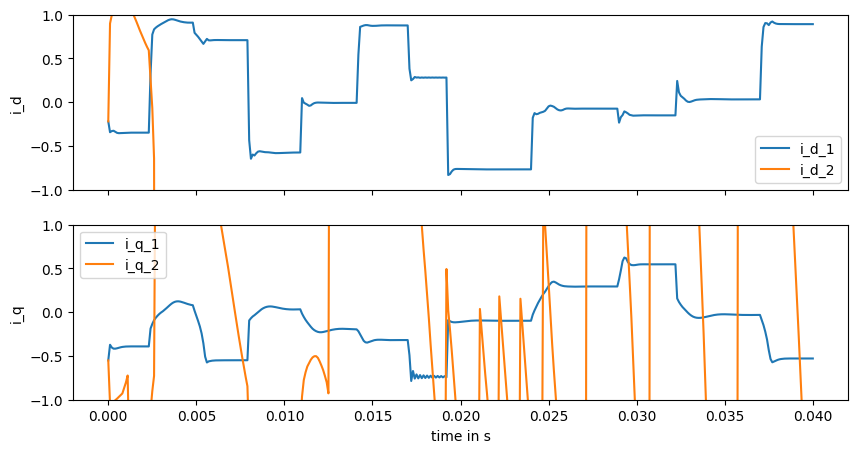

  9%|▉         | 27982/300000 [02:13<16:18, 277.99it/s] 

Current val_loss: 243.41128610282672


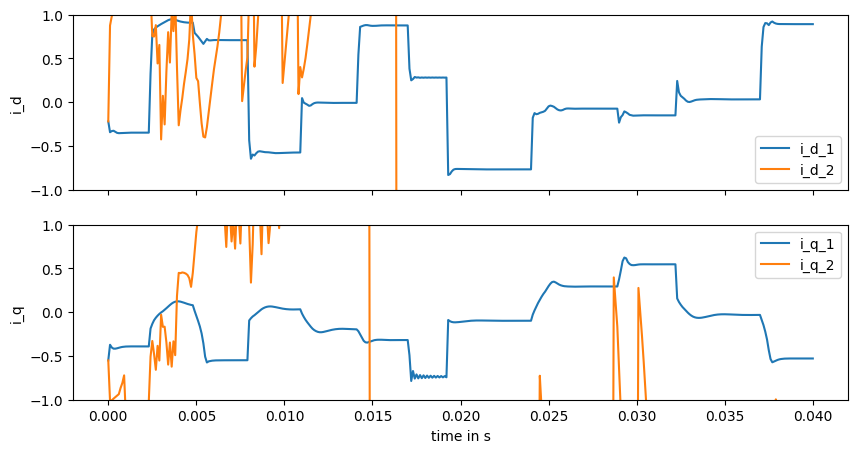

 10%|▉         | 29999/300000 [02:21<16:20, 275.41it/s] 

Current val_loss: 14374.974799054751


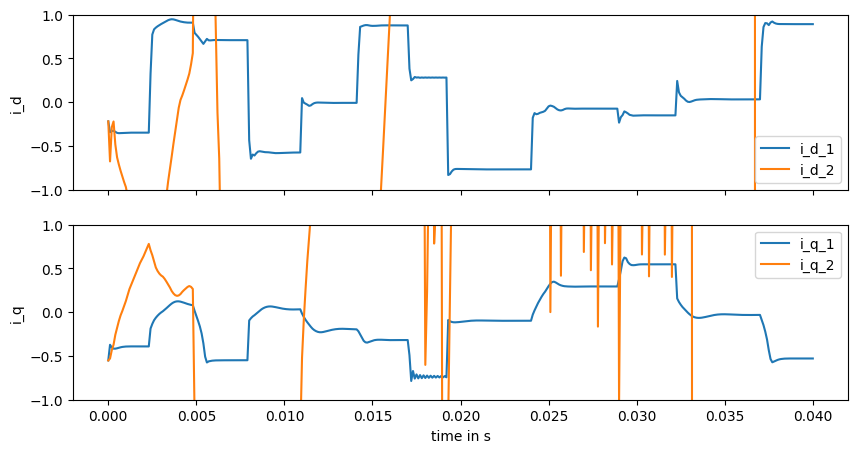

 11%|█         | 31989/300000 [02:29<16:09, 276.32it/s] 

Current val_loss: 136221.99010153193


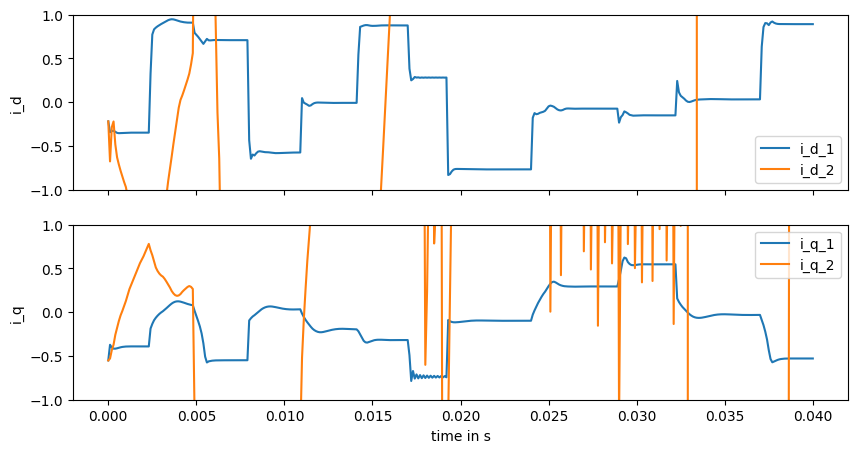

 11%|█▏        | 33978/300000 [02:38<16:01, 276.57it/s] 

Current val_loss: 197884.52843524815


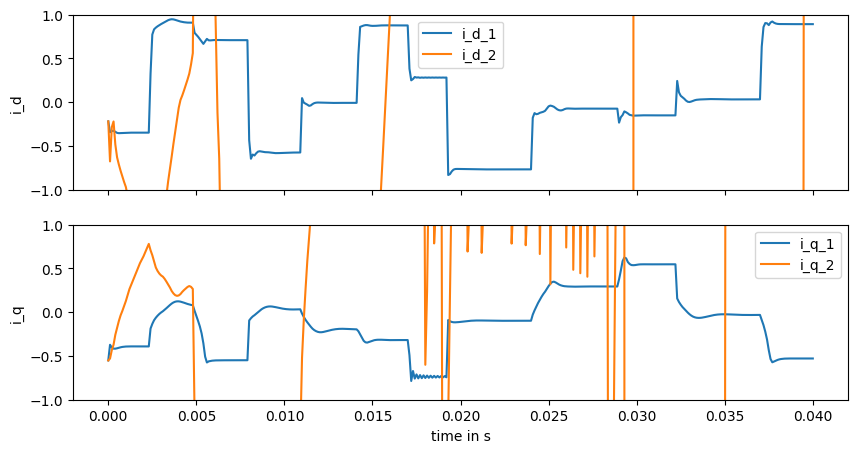

 12%|█▏        | 35986/300000 [02:46<15:54, 276.52it/s] 

Current val_loss: 13958.838868586305


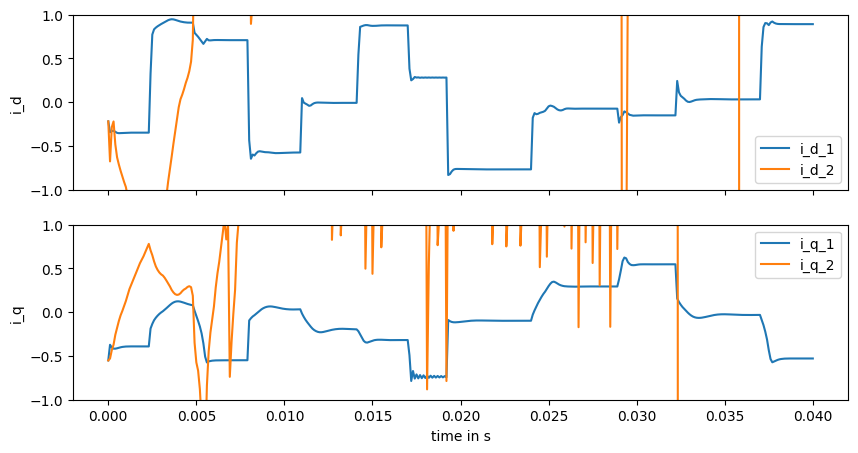

 13%|█▎        | 37989/300000 [02:54<15:34, 280.39it/s]

Current val_loss: 144688.80289178222


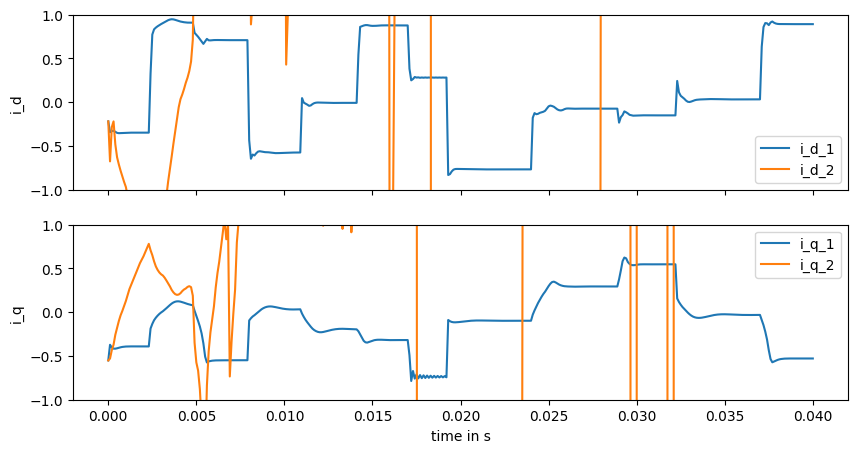

 13%|█▎        | 39977/300000 [03:02<15:44, 275.24it/s]

Current val_loss: 81368.16532929875


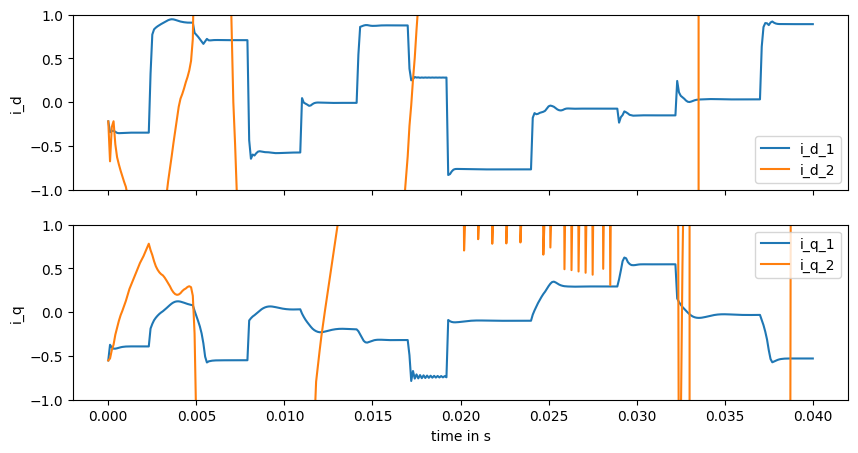

 14%|█▍        | 41978/300000 [03:11<15:20, 280.19it/s]

Current val_loss: 200605.27635432302


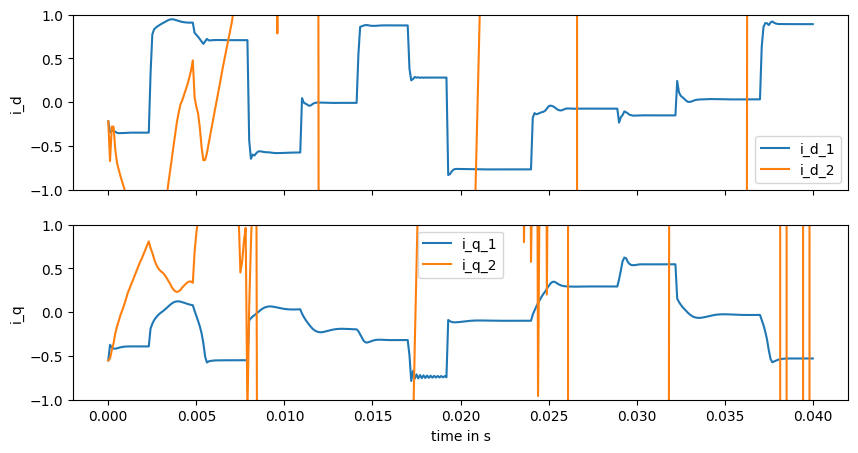

 15%|█▍        | 43993/300000 [03:19<15:13, 280.33it/s]

Current val_loss: 11174.739373550065


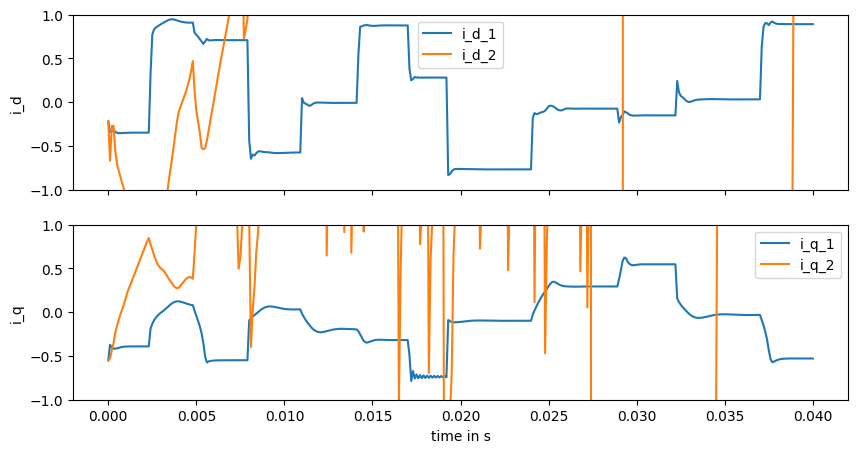

 15%|█▌        | 45985/300000 [03:27<15:11, 278.78it/s]

Current val_loss: 28024.657090276098


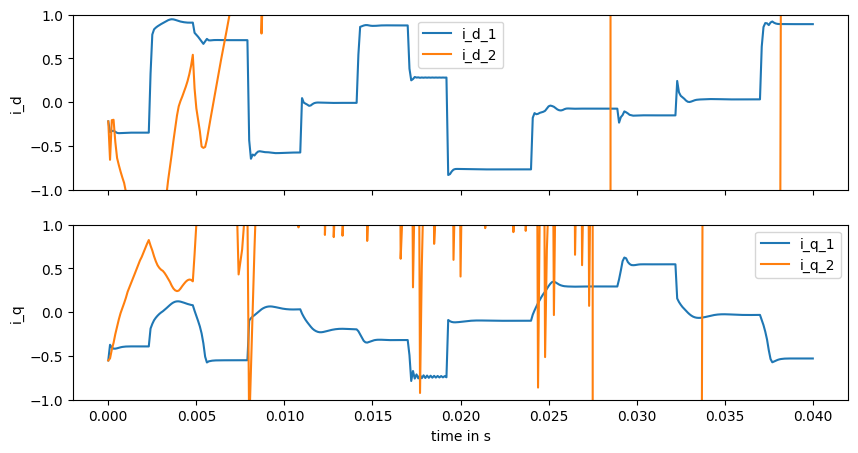

 16%|█▌        | 47979/300000 [03:35<15:10, 276.82it/s]

Current val_loss: 2079329.3225901122


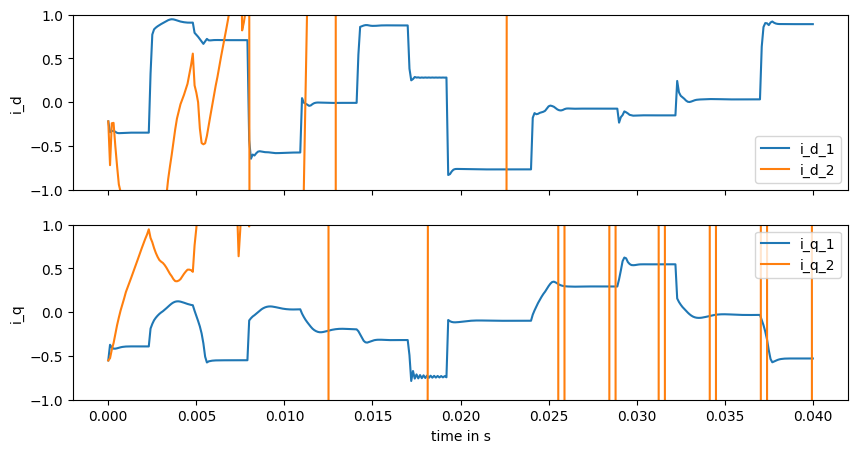

 17%|█▋        | 49998/300000 [03:43<15:00, 277.61it/s]

Current val_loss: 23169.582135929737


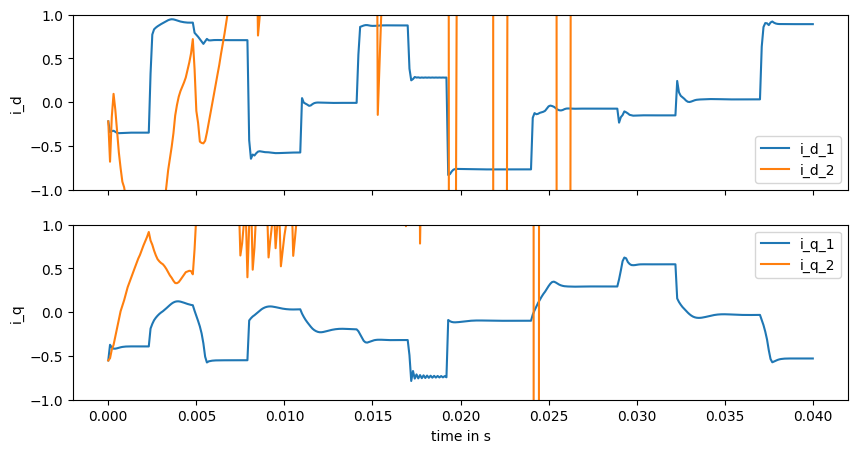

 17%|█▋        | 51987/300000 [03:51<15:07, 273.26it/s]

Current val_loss: 31519.00722087075


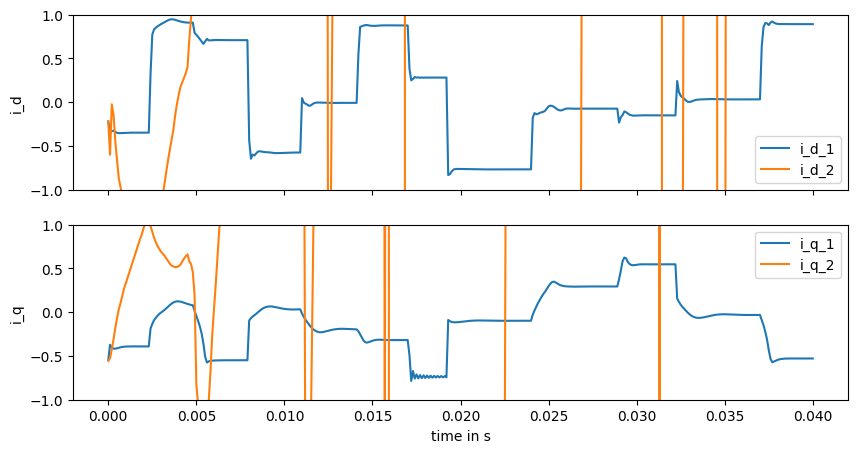

 18%|█▊        | 53972/300000 [04:00<14:36, 280.64it/s]

Current val_loss: 25728603.021688312


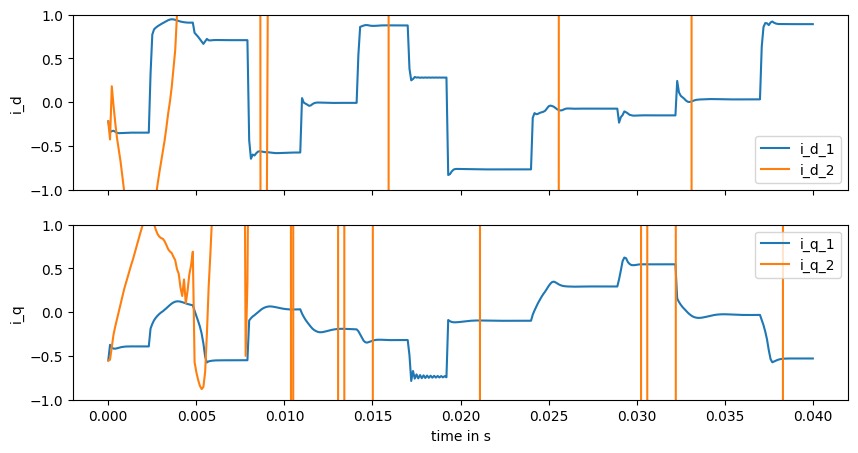

 19%|█▊        | 55988/300000 [04:08<14:27, 281.34it/s]

Current val_loss: 12821.727882468962


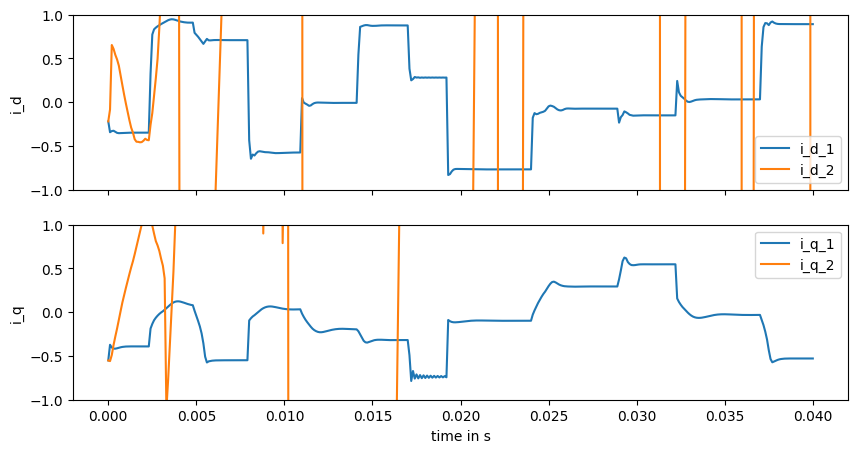

 19%|█▉        | 57990/300000 [04:16<14:47, 272.64it/s]

Current val_loss: 48502421.02273066


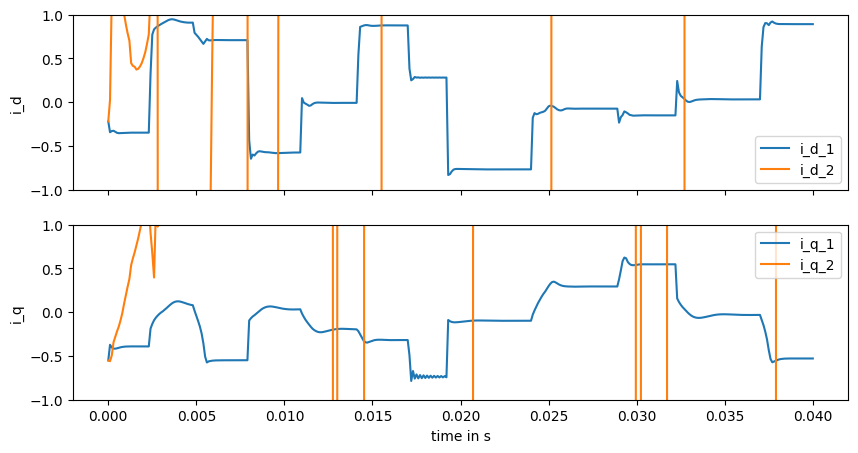

 20%|█▉        | 59988/300000 [04:24<14:26, 277.08it/s]

Current val_loss: 297901.3304464891


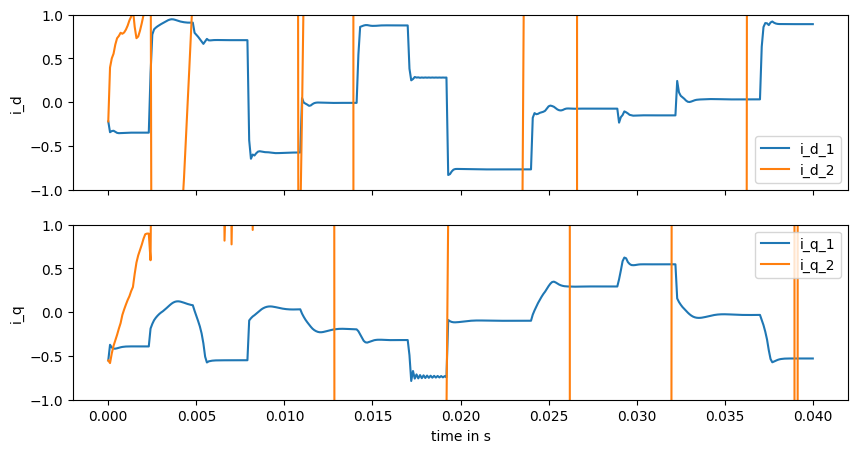

 21%|██        | 61976/300000 [04:33<14:08, 280.43it/s] 

Current val_loss: 118216.44518785753


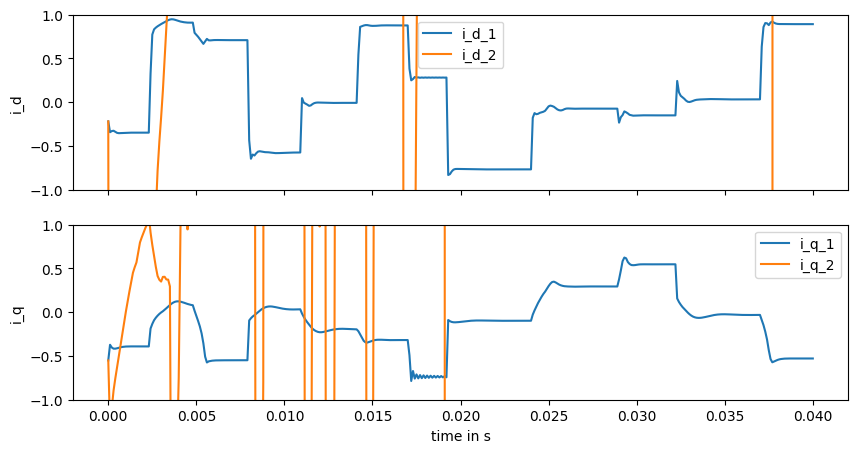

 21%|██▏       | 63997/300000 [04:41<14:01, 280.48it/s]

Current val_loss: 14696512.183703326


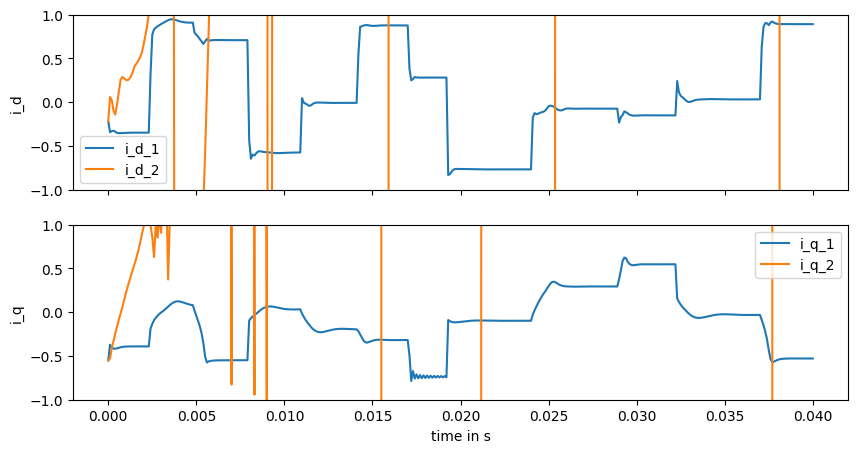

 22%|██▏       | 65979/300000 [04:50<14:03, 277.31it/s]

Current val_loss: 535.7276989908149


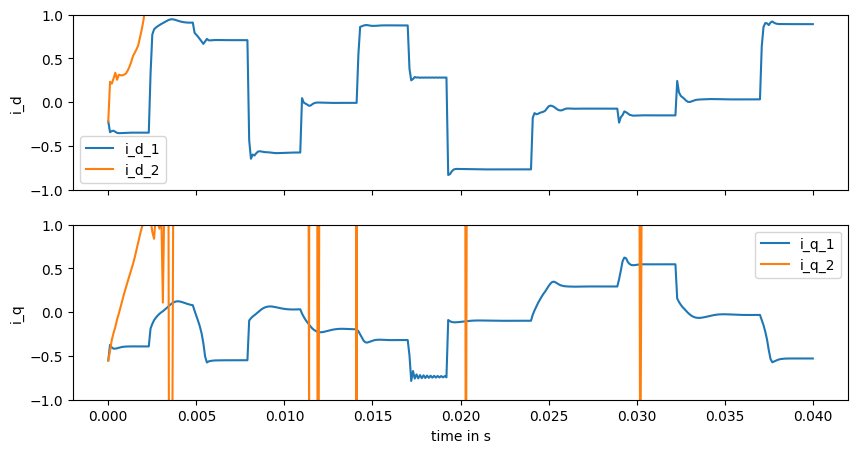

 23%|██▎       | 67980/300000 [04:58<14:10, 272.92it/s]

Current val_loss: 318.6983504453543


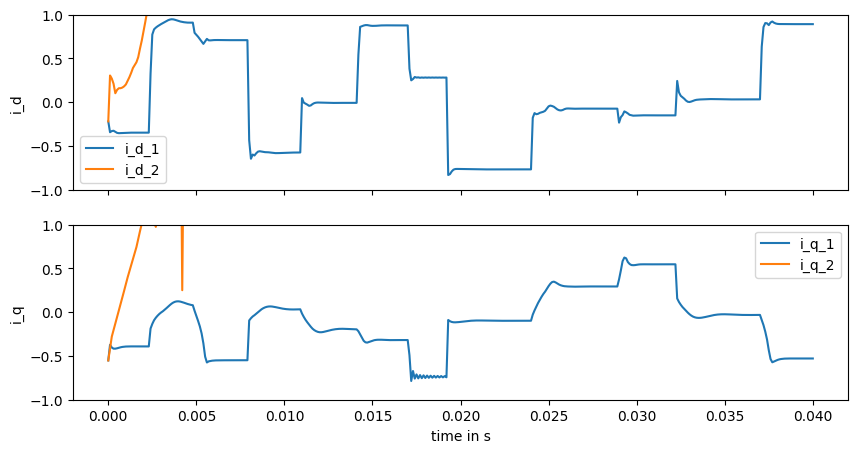

 23%|██▎       | 69991/300000 [05:06<14:21, 267.14it/s]

Current val_loss: 330.1138395488222


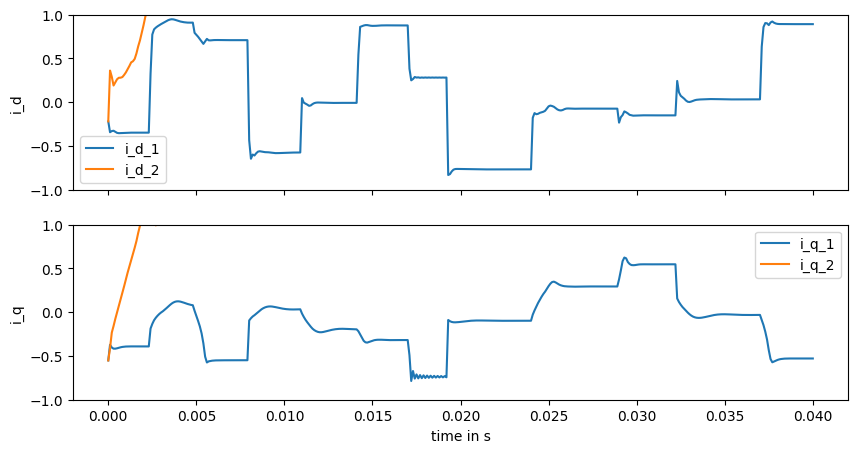

 24%|██▍       | 71983/300000 [05:15<13:51, 274.30it/s]

Current val_loss: 341.8340693259765


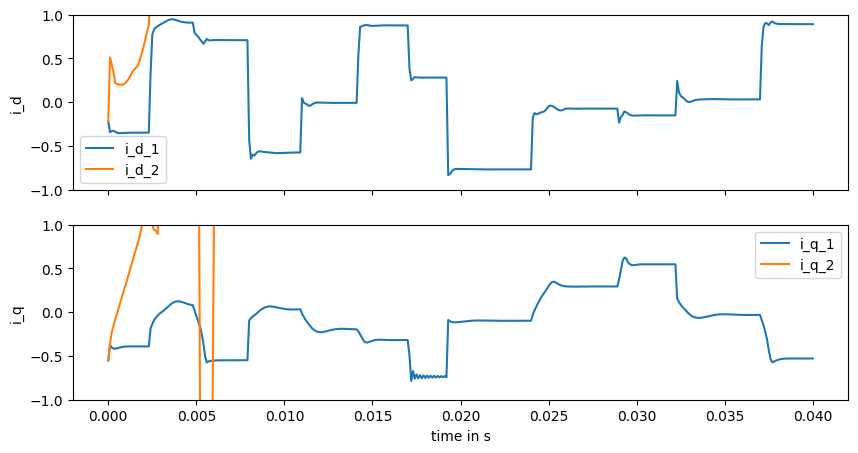

 25%|██▍       | 73995/300000 [05:23<14:05, 267.44it/s]

Current val_loss: 116.21634805000167


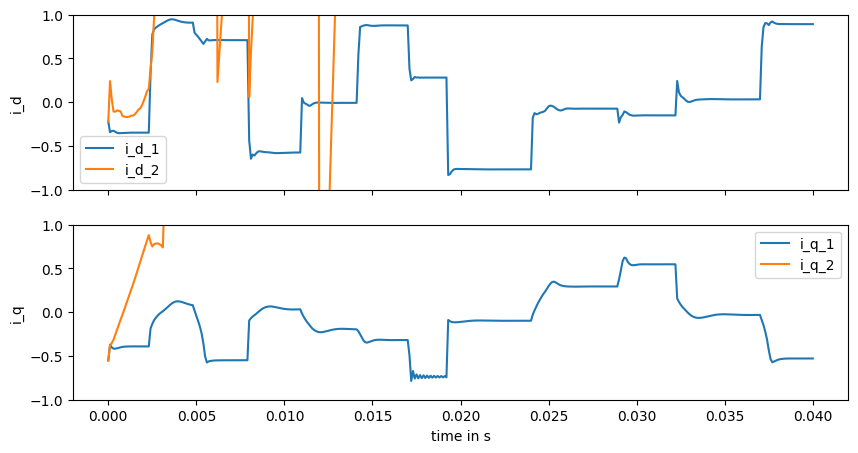

 25%|██▌       | 75975/300000 [05:31<13:31, 276.01it/s]

Current val_loss: 935.9745936163122


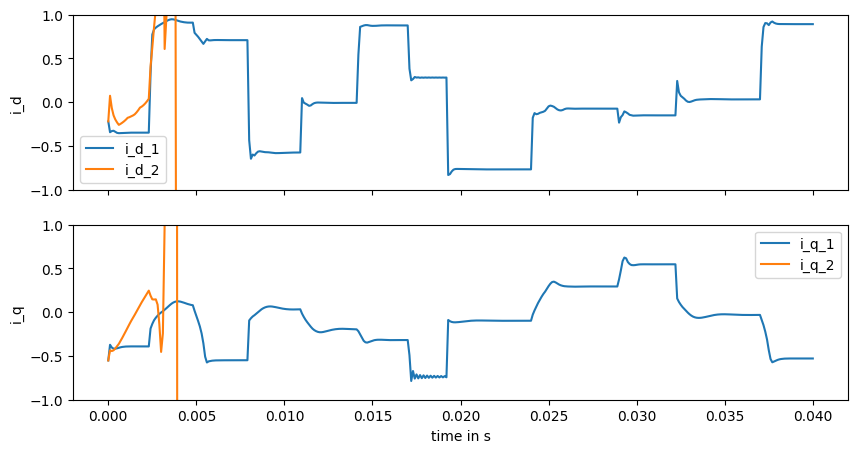

 26%|██▌       | 77982/300000 [05:39<13:23, 276.46it/s]

Current val_loss: 135.9437660462433


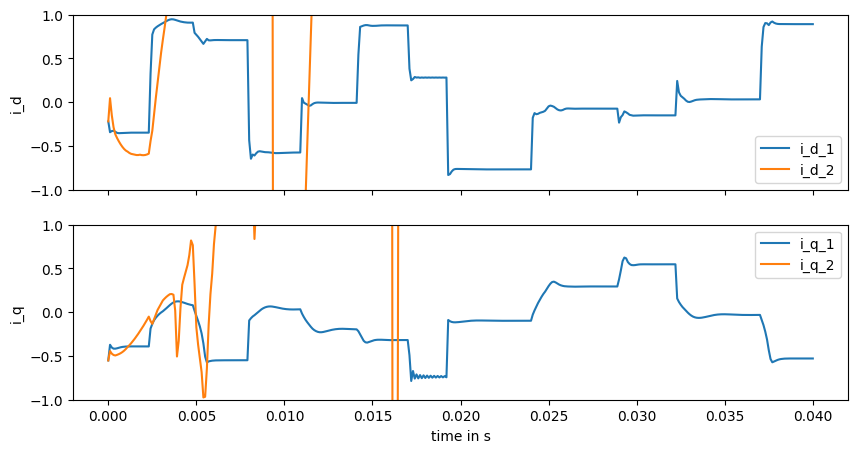

 27%|██▋       | 79998/300000 [05:48<13:16, 276.12it/s]

Current val_loss: 2530344.88226613


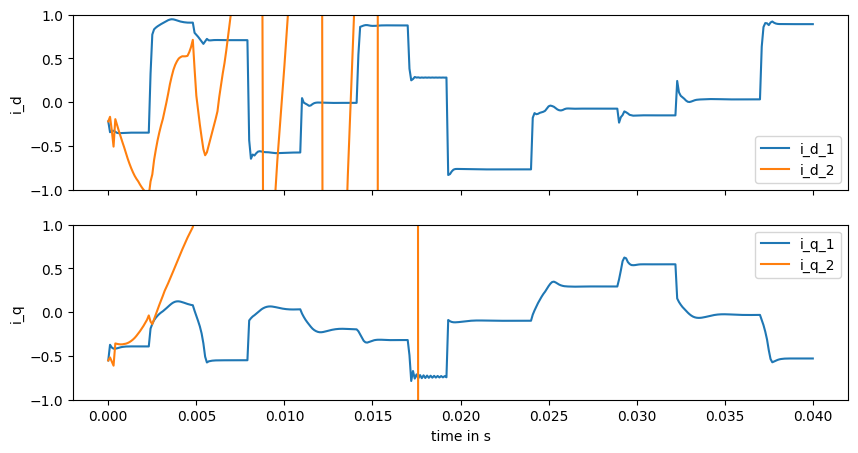

 27%|██▋       | 81984/300000 [05:56<13:08, 276.41it/s]

Current val_loss: 107.5189385876228


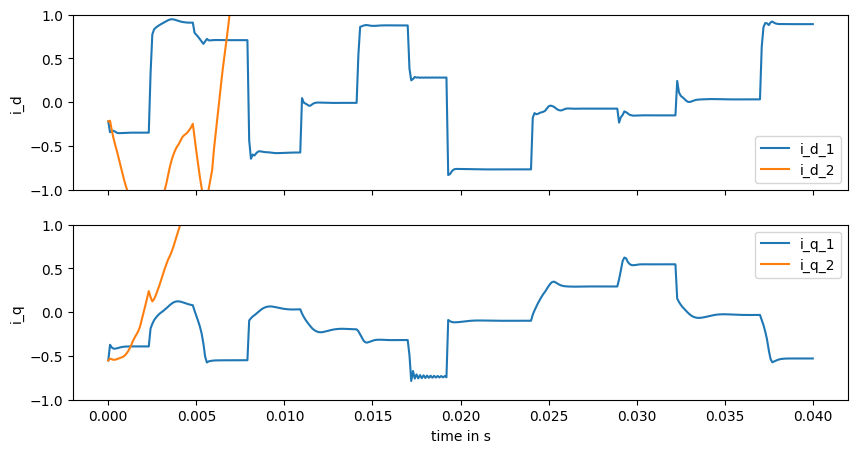

 28%|██▊       | 83995/300000 [06:04<13:07, 274.22it/s]

Current val_loss: 100.53258827857478


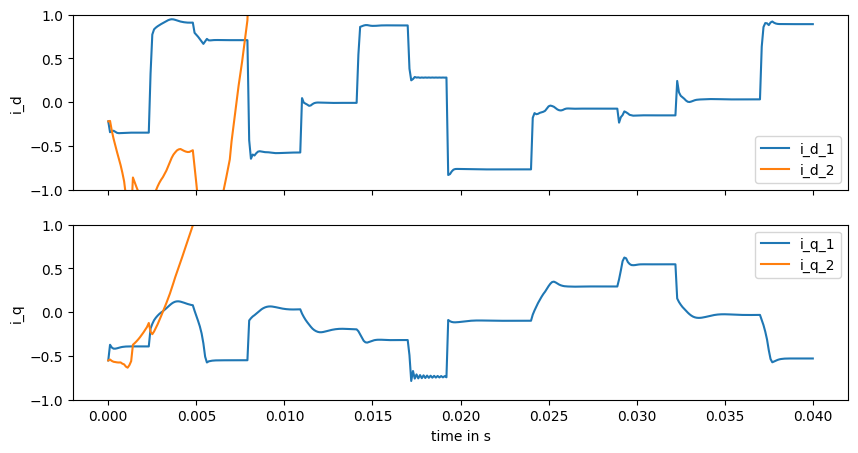

 29%|██▊       | 85991/300000 [06:13<12:44, 280.06it/s]

Current val_loss: 42.314692418322146


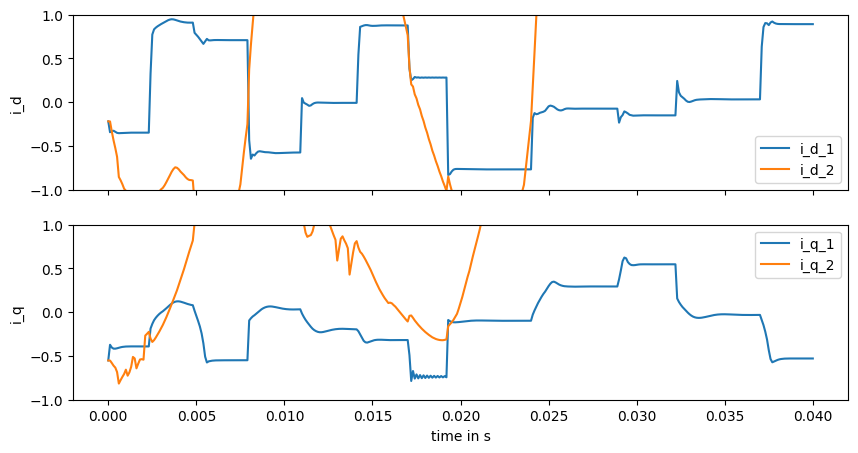

 29%|██▉       | 87988/300000 [06:21<12:42, 277.95it/s]

Current val_loss: 222202050982.67447


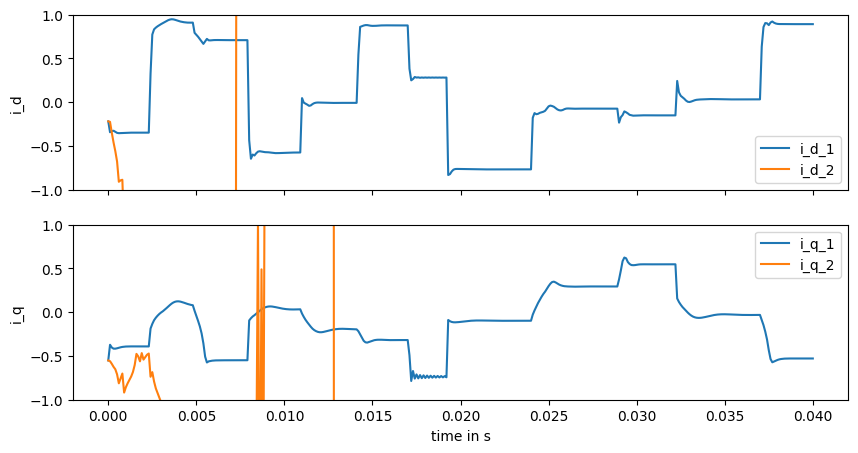

 30%|██▉       | 89979/300000 [06:29<12:48, 273.35it/s]

Current val_loss: 9569.470067022048


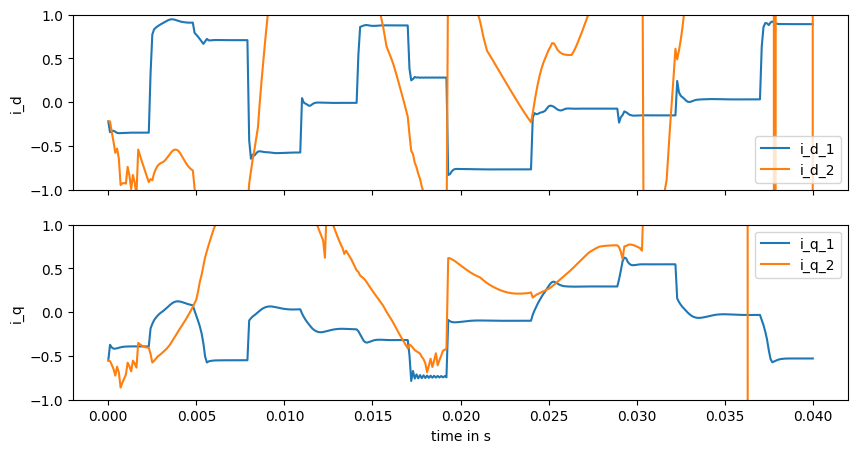

 31%|███       | 91994/300000 [06:37<12:30, 277.11it/s]

Current val_loss: 857490138079.1976


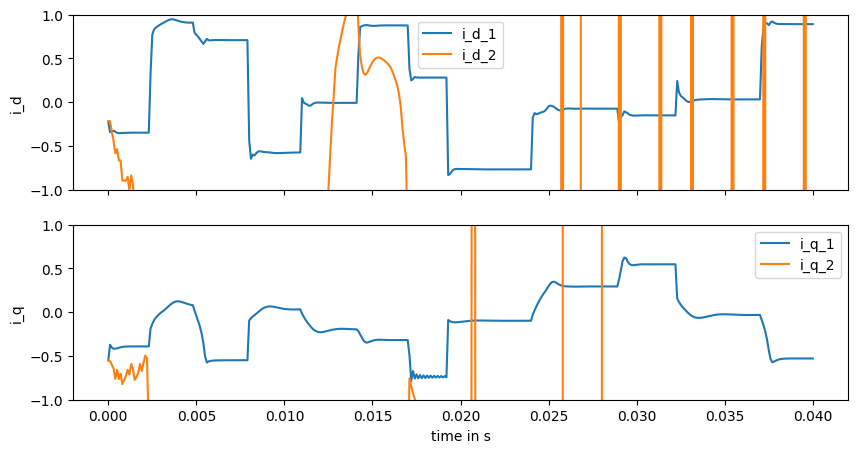

 31%|███▏      | 93986/300000 [06:46<12:35, 272.57it/s]

Current val_loss: 9.98888527069343


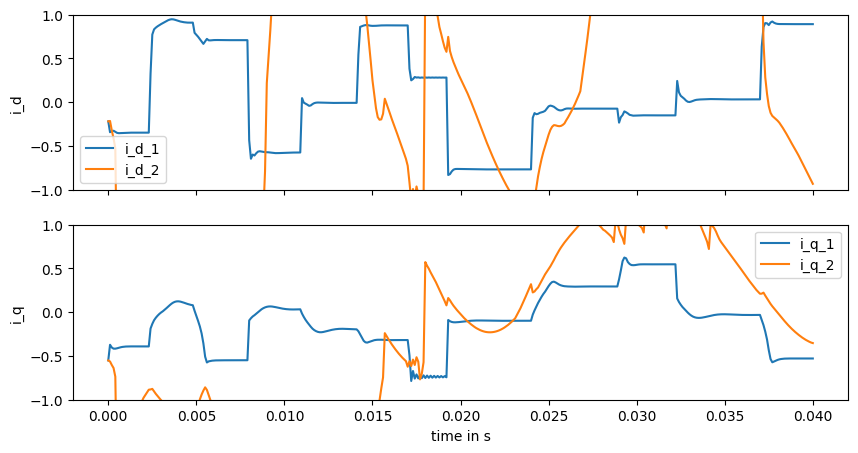

 32%|███▏      | 95998/300000 [06:54<12:20, 275.45it/s]

Current val_loss: 8.512057657606839e+19


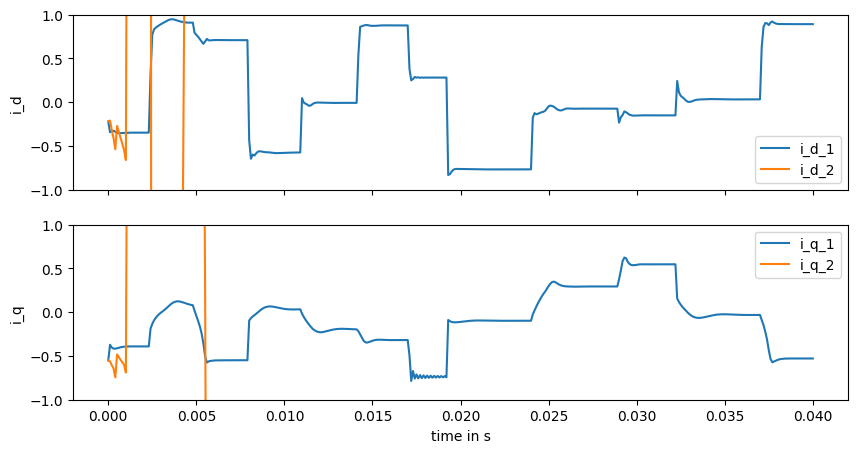

 33%|███▎      | 97981/300000 [07:02<12:11, 276.20it/s]

Current val_loss: 5.860493523458355


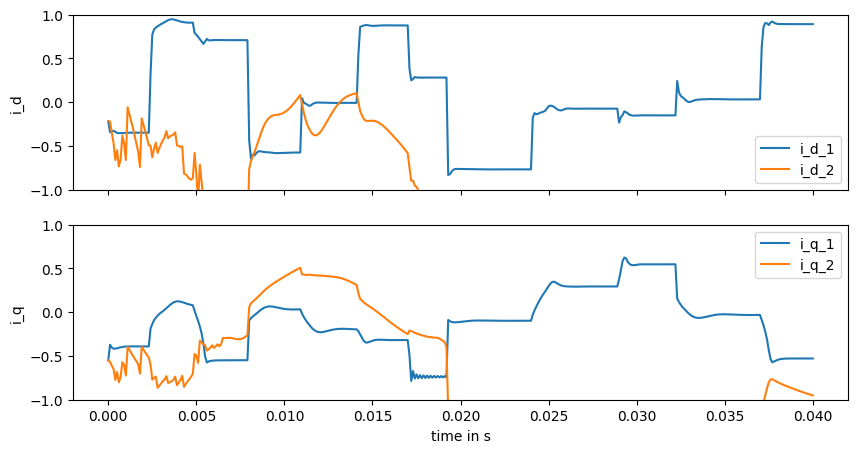

 33%|███▎      | 99992/300000 [07:10<12:04, 275.98it/s]

Current val_loss: 10.54621625481198


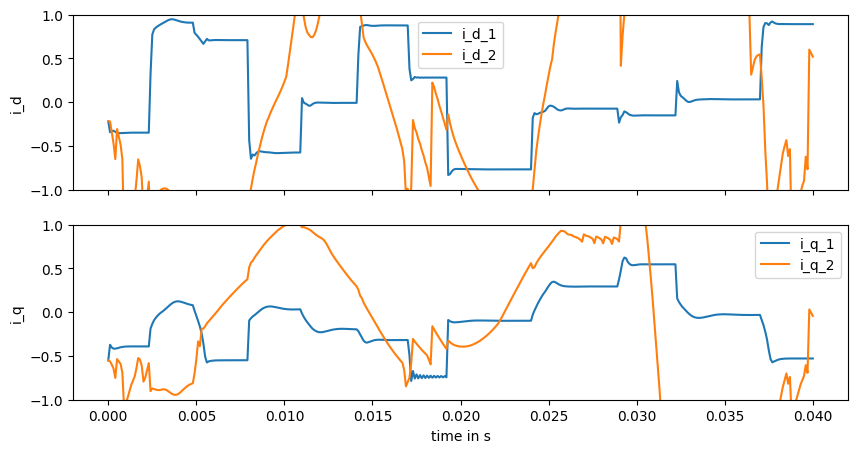

 34%|███▍      | 101979/300000 [07:18<11:59, 275.27it/s]

Current val_loss: 1200477892794124.5


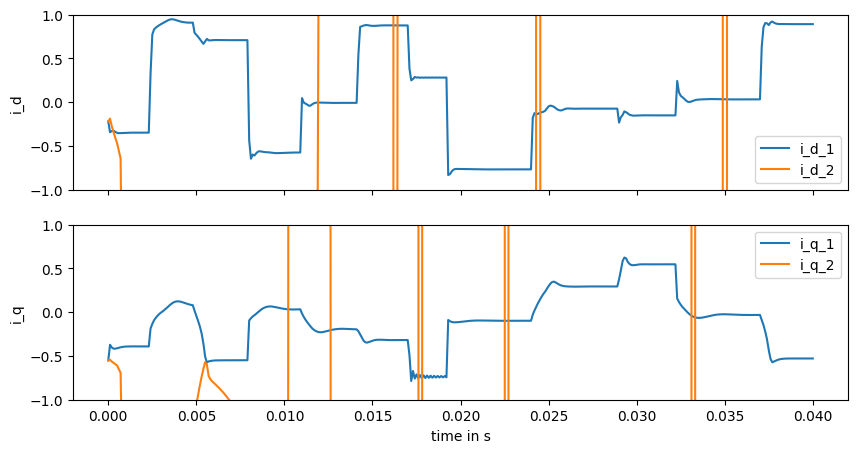

 35%|███▍      | 103989/300000 [07:27<11:50, 275.84it/s]

Current val_loss: 9280.222137176537


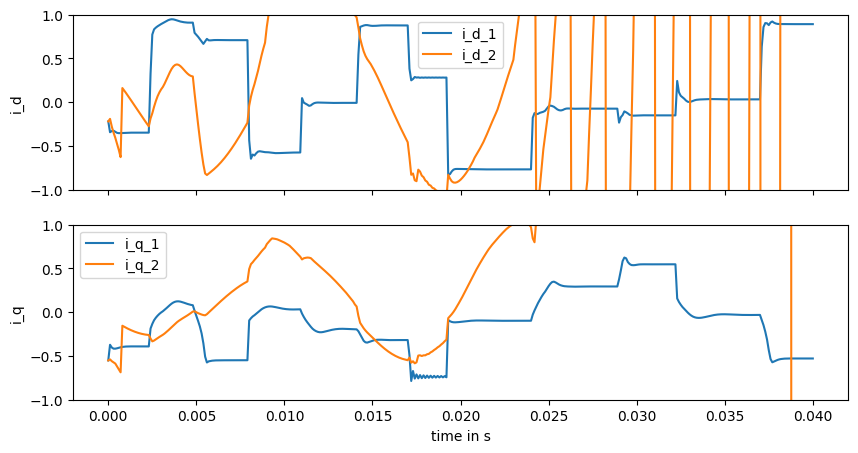

 35%|███▌      | 105983/300000 [07:35<11:41, 276.45it/s]

Current val_loss: 84807.03123099332


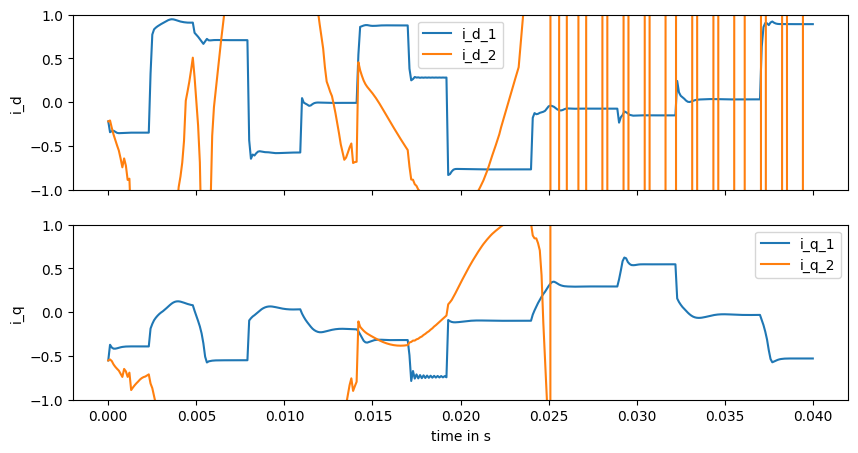

 36%|███▌      | 107972/300000 [07:43<11:30, 277.92it/s]

Current val_loss: 5.076242453728999


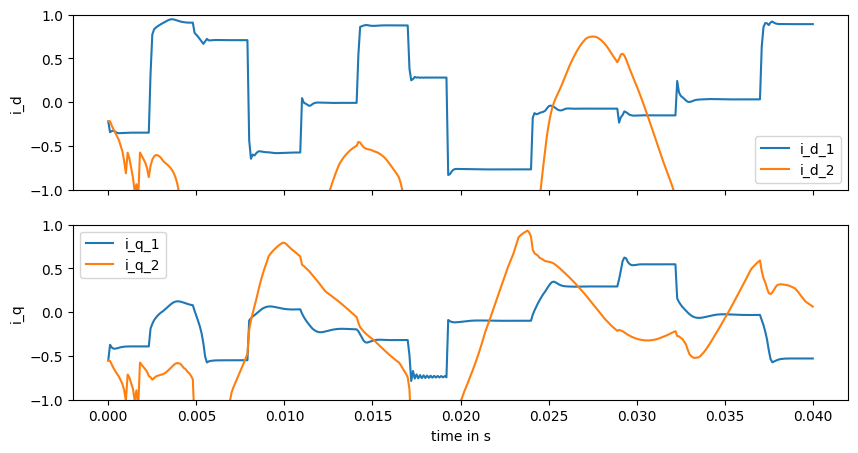

 37%|███▋      | 109979/300000 [07:51<11:23, 277.95it/s]

Current val_loss: 78.98809331448545


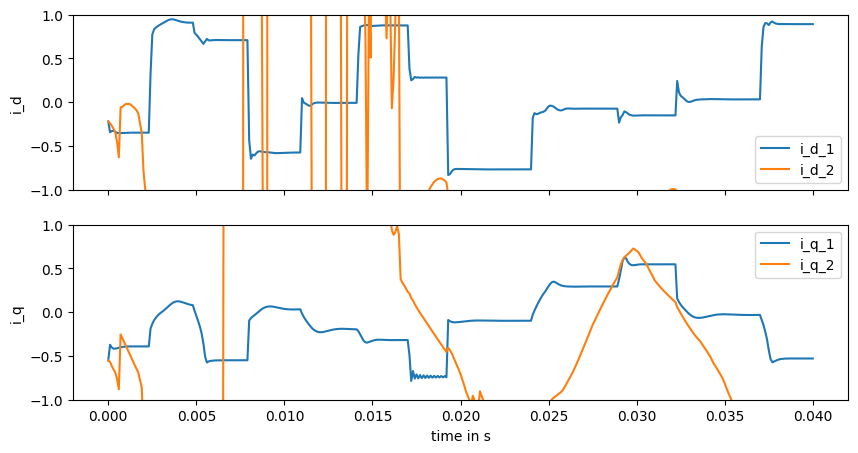

 37%|███▋      | 111983/300000 [07:59<11:19, 276.58it/s]

Current val_loss: 6.495818502416096


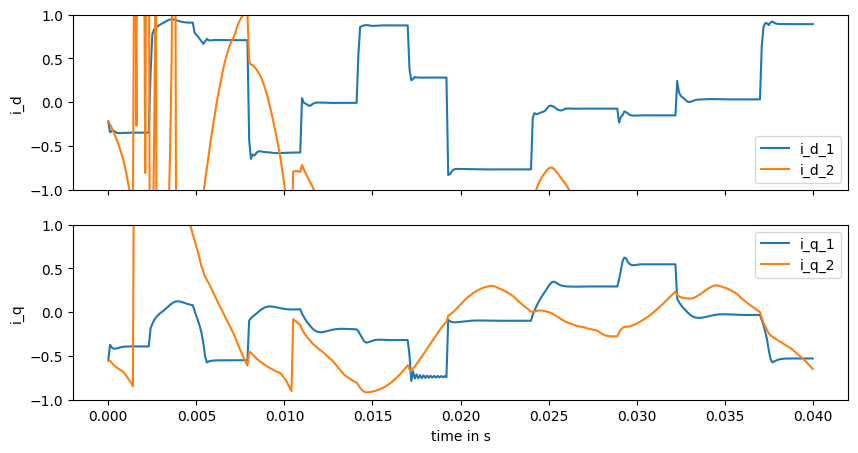

 38%|███▊      | 113994/300000 [08:07<11:17, 274.61it/s]

Current val_loss: 14.173488925900486


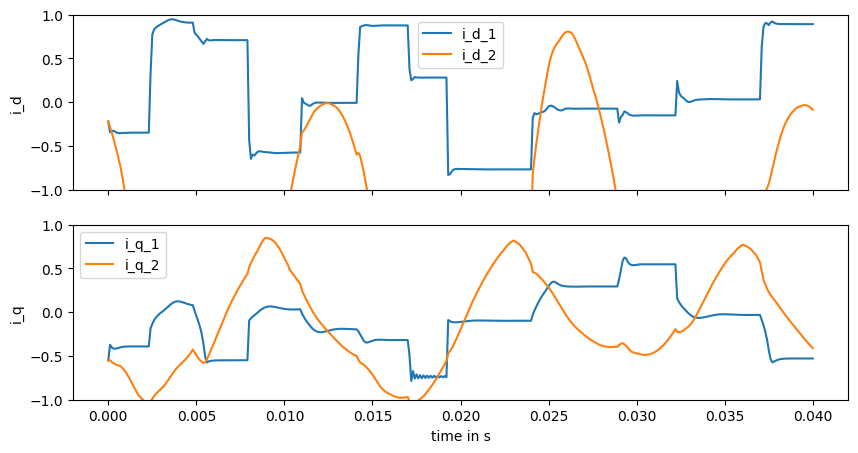

 39%|███▊      | 115982/300000 [08:16<11:05, 276.71it/s] 

Current val_loss: 20.69809311861299


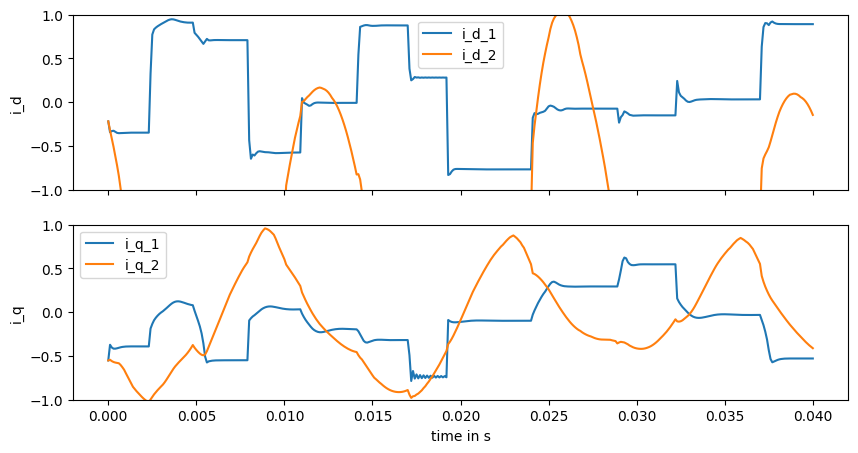

 39%|███▉      | 117998/300000 [08:25<11:01, 275.07it/s]

Current val_loss: 67.13987585095838


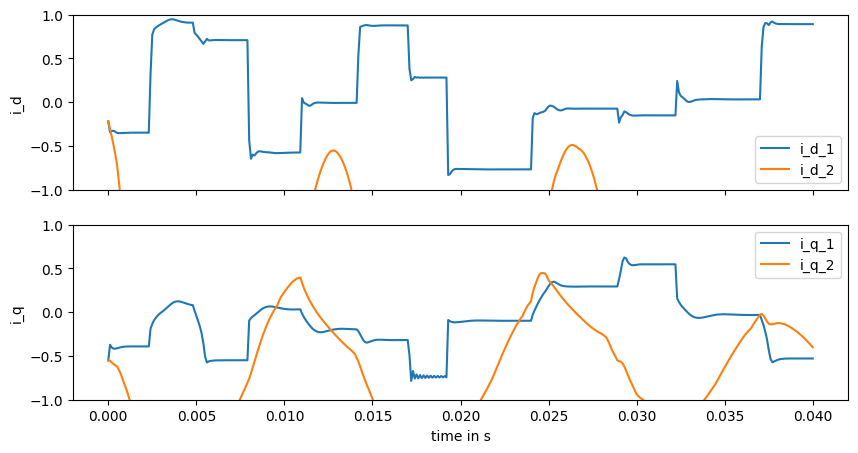

 40%|███▉      | 119985/300000 [08:33<10:54, 275.19it/s]

Current val_loss: 1551.1183091664343


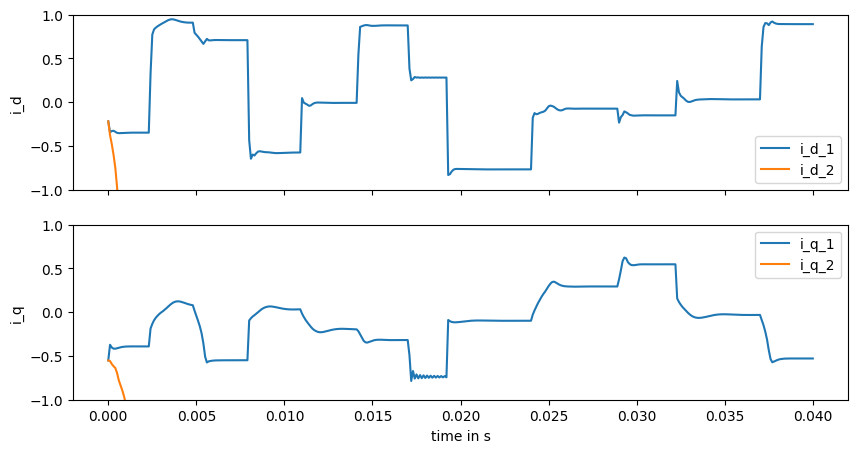

 41%|████      | 122000/300000 [08:41<10:52, 272.64it/s]

Current val_loss: 3417925.1154188816


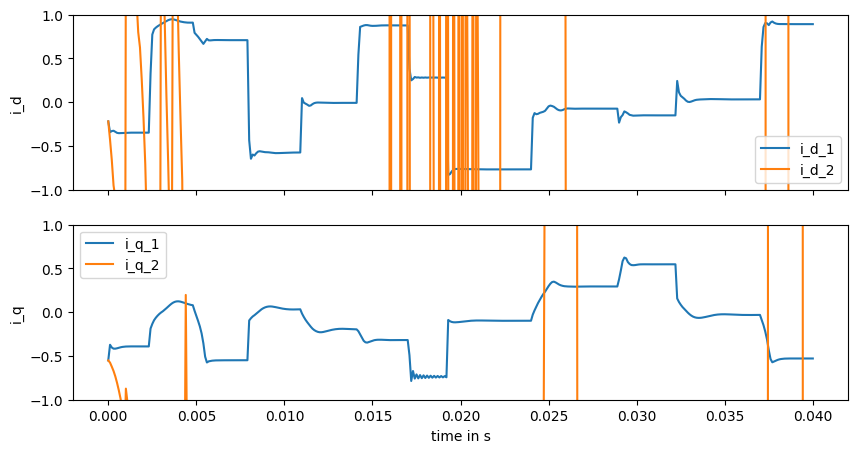

 41%|████▏     | 123984/300000 [08:49<10:36, 276.72it/s]

Current val_loss: 64168.475320572594


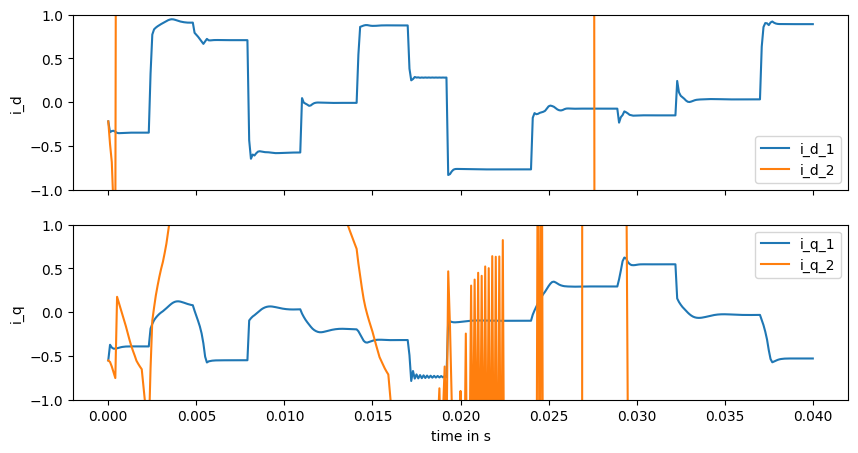

 42%|████▏     | 125979/300000 [08:58<10:27, 277.23it/s]

Current val_loss: 36227.51861303726


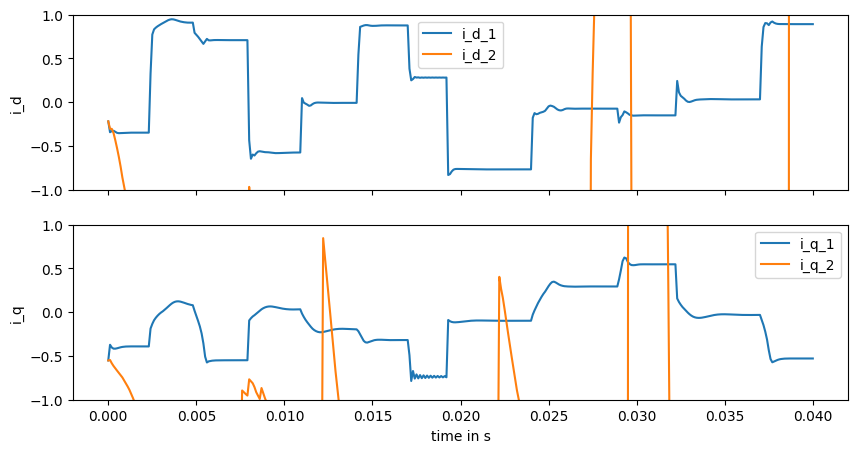

 43%|████▎     | 127975/300000 [09:06<10:23, 276.04it/s]

Current val_loss: 15.383069245288123


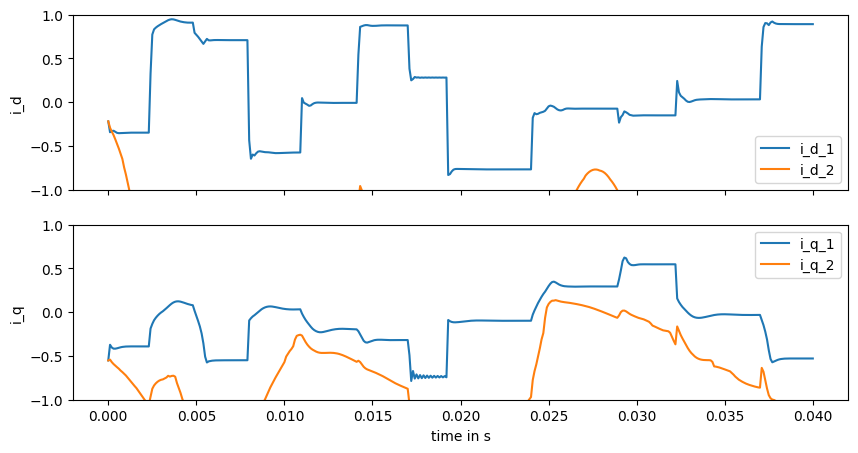

 43%|████▎     | 129983/300000 [09:14<10:20, 274.05it/s]

Current val_loss: 1.0185315834645814


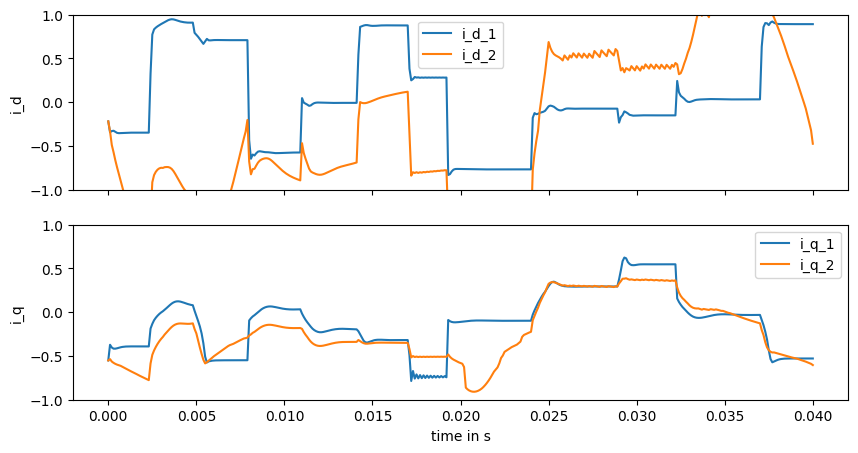

 44%|████▍     | 131988/300000 [09:23<10:14, 273.49it/s]

Current val_loss: 0.6707633281751546


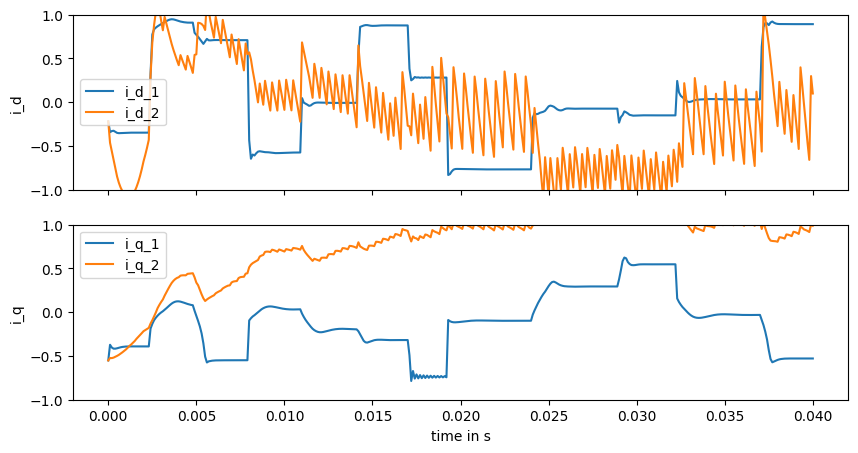

 45%|████▍     | 133999/300000 [09:31<09:54, 279.00it/s]

Current val_loss: 19.575056456774085


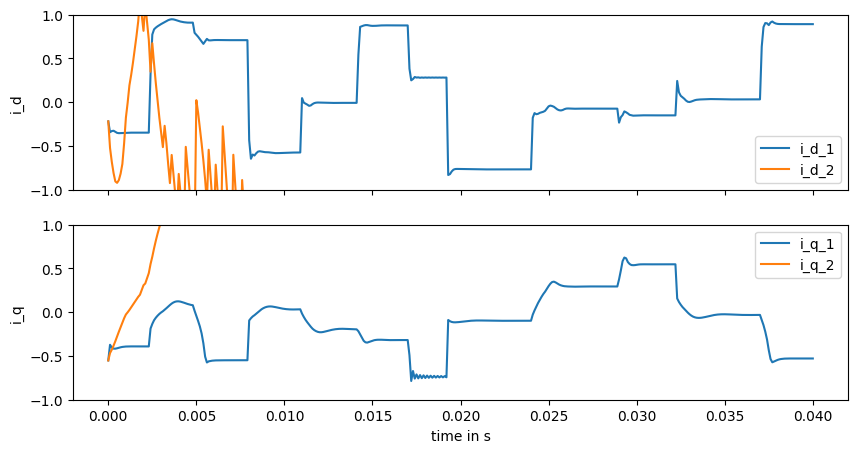

 45%|████▌     | 135984/300000 [09:39<10:05, 270.96it/s]

Current val_loss: 109.67318365781938


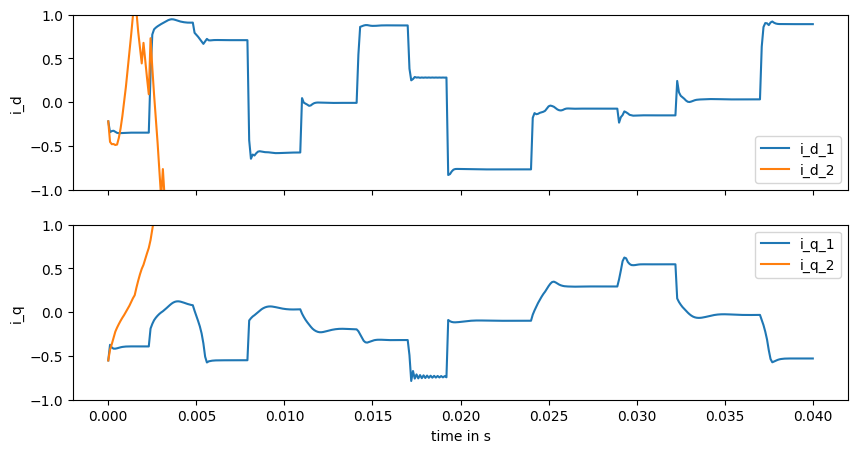

 46%|████▌     | 137999/300000 [09:47<09:45, 276.84it/s]

Current val_loss: 597515.883978031


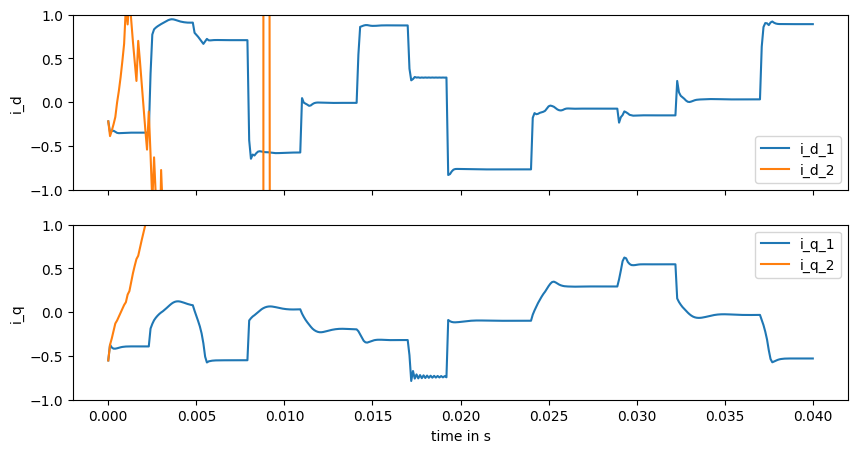

 47%|████▋     | 139985/300000 [09:55<09:38, 276.45it/s]

Current val_loss: 591973.2681445387


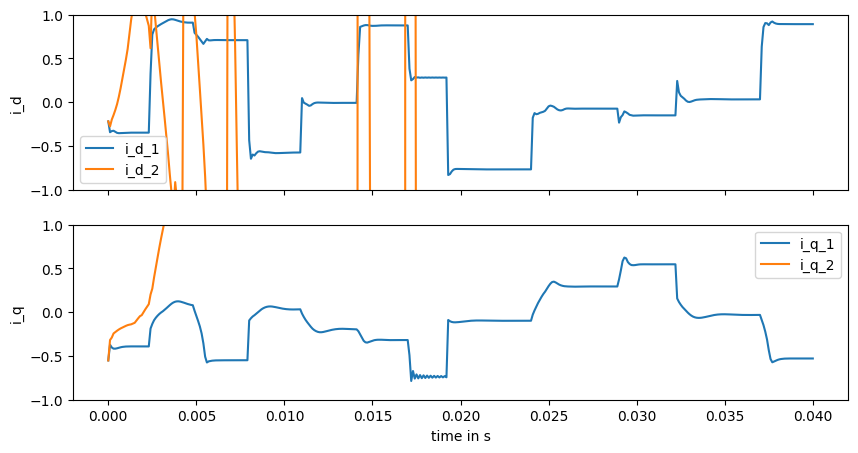

 47%|████▋     | 141993/300000 [10:04<09:51, 266.97it/s]

Current val_loss: 5.483985417918721e+19


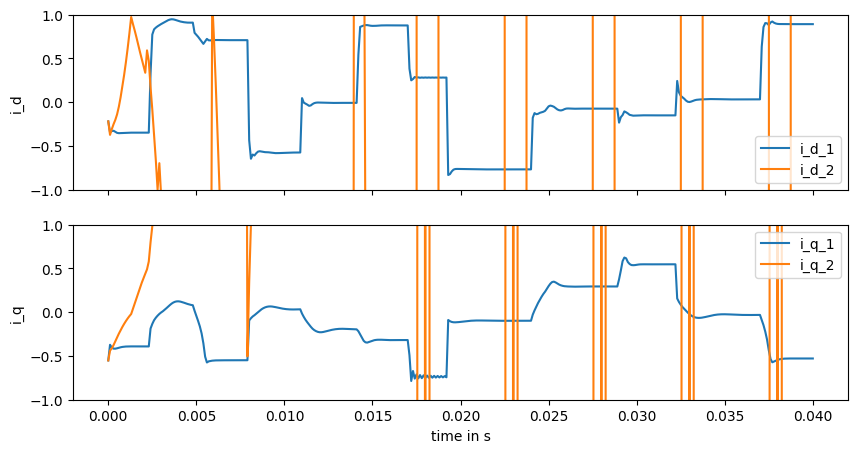

 48%|████▊     | 143977/300000 [10:12<09:35, 270.98it/s]

Current val_loss: 1.4480534852542865e+21


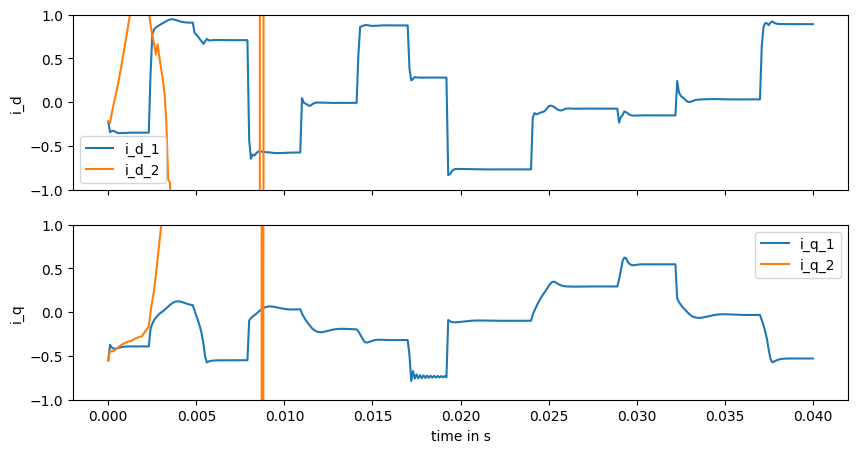

 49%|████▊     | 145992/300000 [10:20<09:22, 273.56it/s]

Current val_loss: 3.4557299637066113e+50


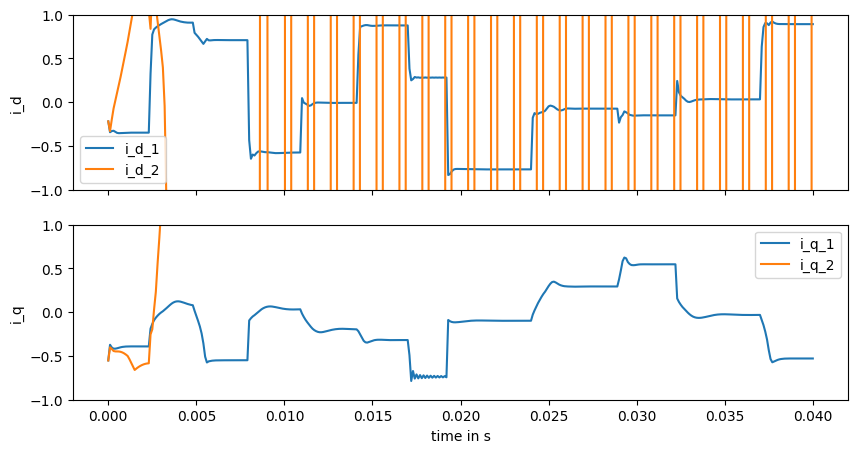

 49%|████▉     | 147978/300000 [10:29<09:12, 275.18it/s]

Current val_loss: 1.785848328371329e+58


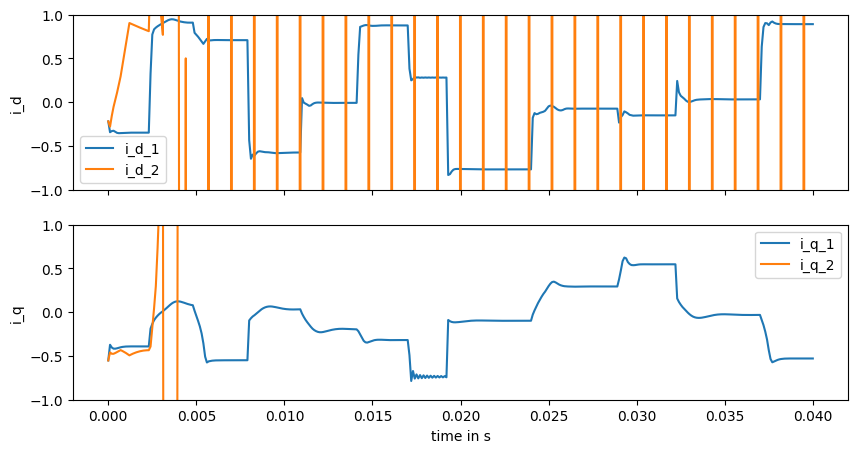

 50%|█████     | 150000/300000 [10:37<09:03, 275.78it/s]

Current val_loss: 4.21441902468899e+112


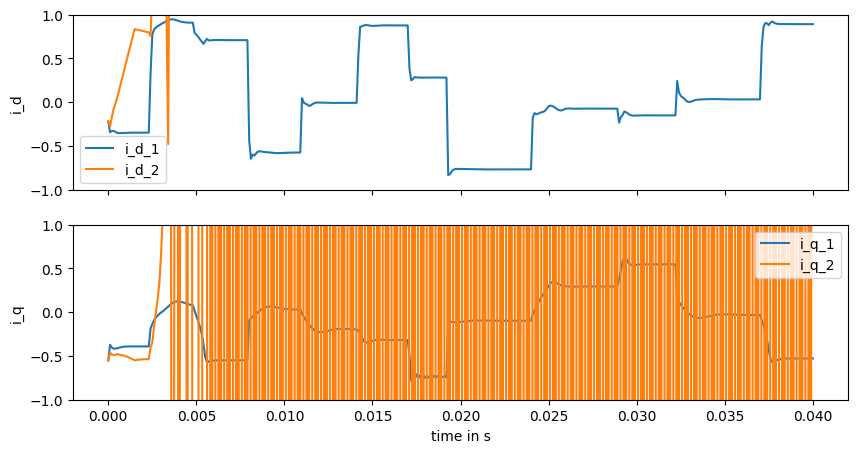

 51%|█████     | 151979/300000 [10:45<08:56, 275.67it/s]

Current val_loss: 2.9321515175283836e+89


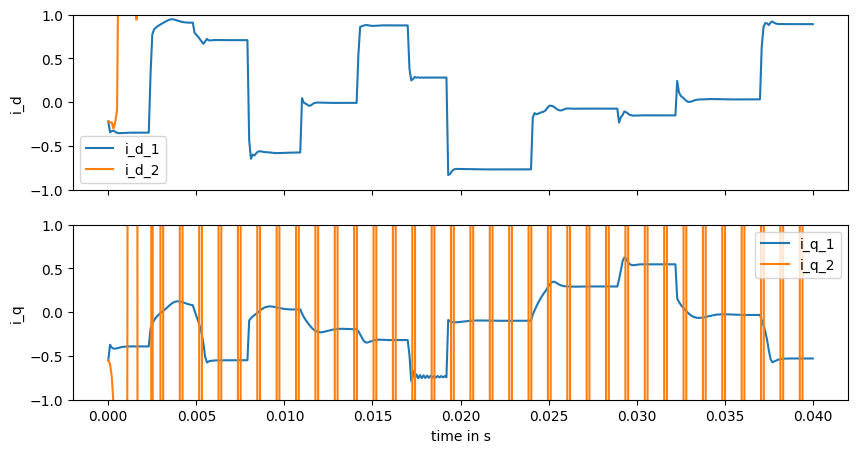

 51%|█████▏    | 153991/300000 [10:54<08:49, 275.54it/s]

Current val_loss: 1.917722913995638e+61


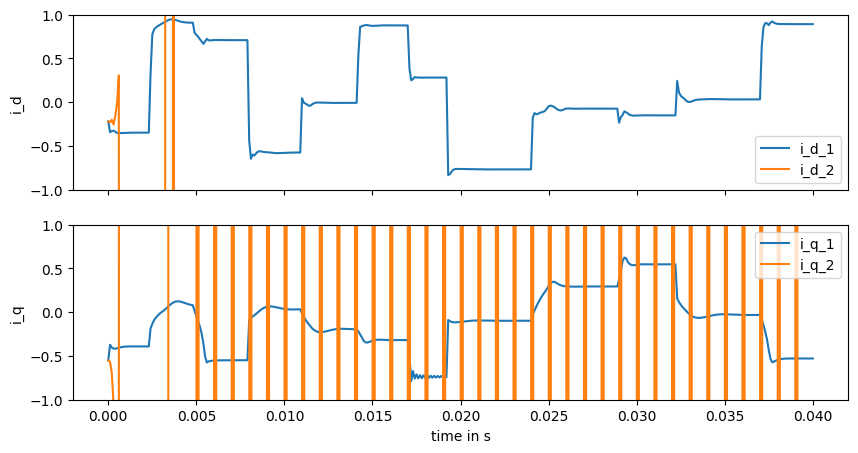

 52%|█████▏    | 155980/300000 [11:02<08:50, 271.72it/s]

Current val_loss: 2.2364168173182568e+138


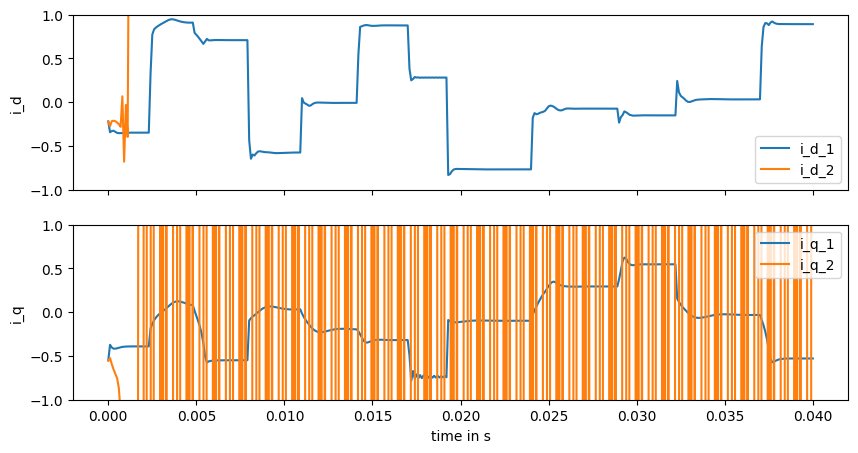

 53%|█████▎    | 157977/300000 [11:10<08:36, 275.06it/s]

Current val_loss: 9.134004301028172e+17


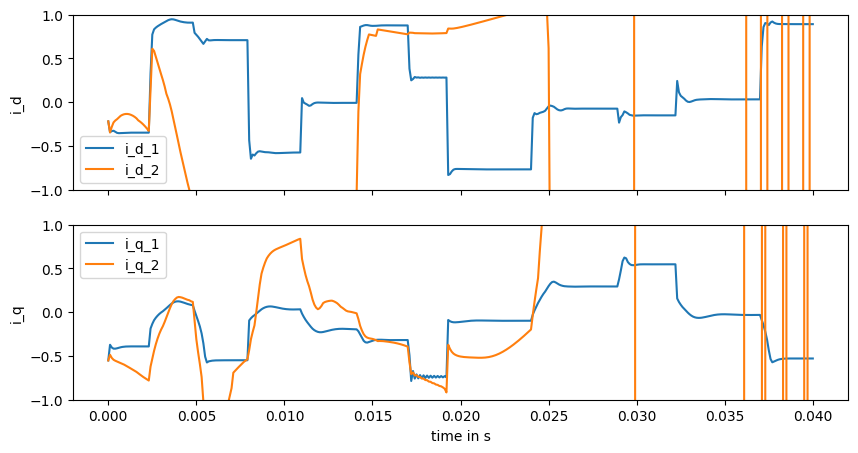

 53%|█████▎    | 159988/300000 [11:18<08:27, 275.94it/s]

Current val_loss: 3.795509584187248e+72


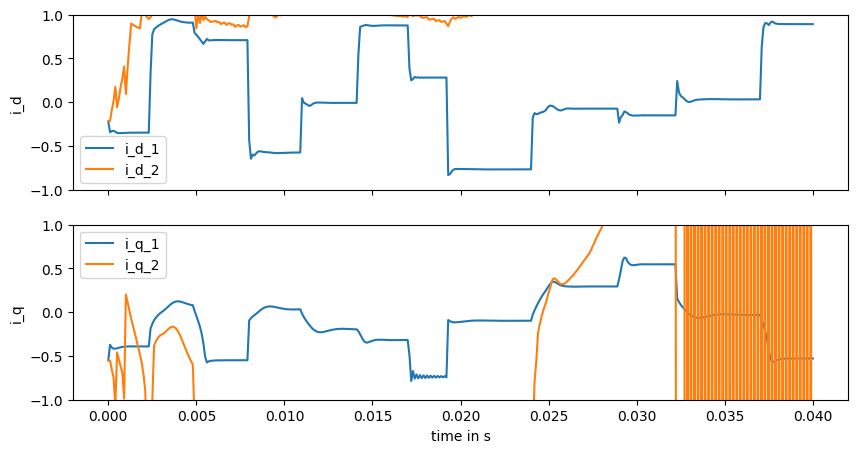

 54%|█████▍    | 162000/300000 [11:27<08:20, 275.48it/s]

Current val_loss: 1.4914596134129904e+26


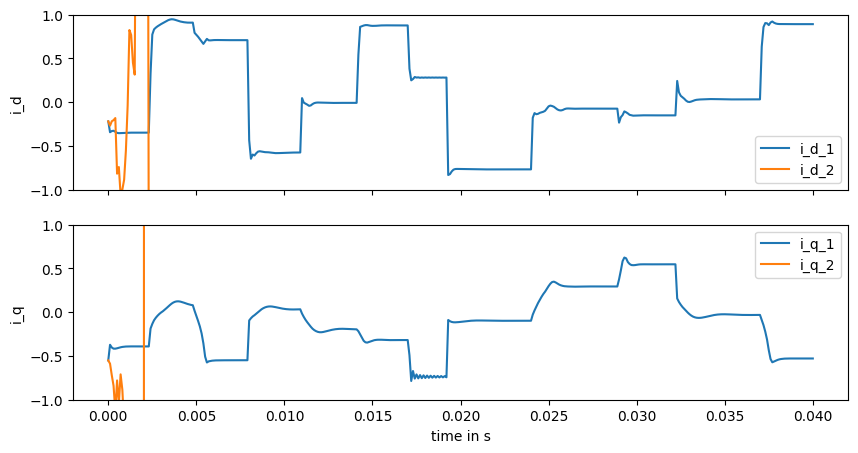

 55%|█████▍    | 163987/300000 [11:35<08:10, 277.21it/s]

Current val_loss: 1.1679734929548992e+135


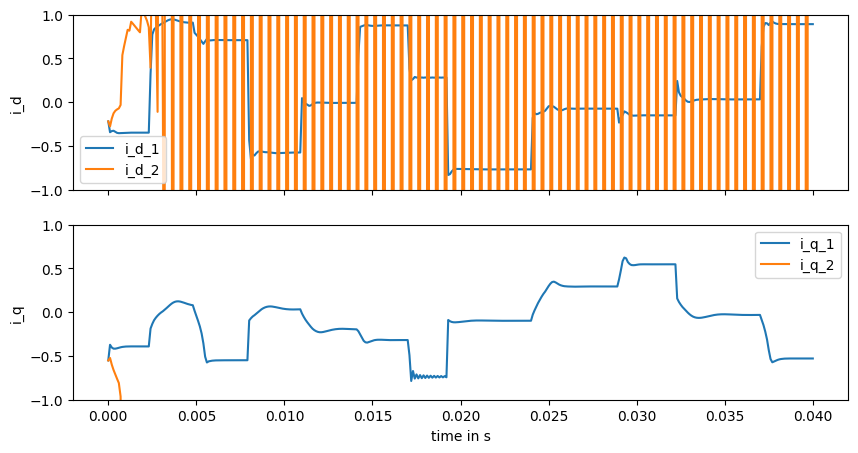

 55%|█████▌    | 165977/300000 [11:43<08:00, 279.11it/s]

Current val_loss: 2.200570233790844e+140


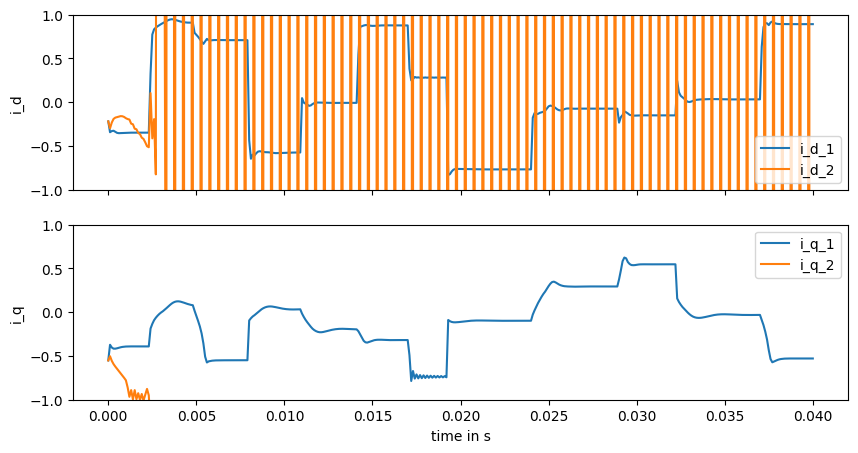

 56%|█████▌    | 167992/300000 [11:51<08:06, 271.59it/s]

Current val_loss: 7534191913243.611


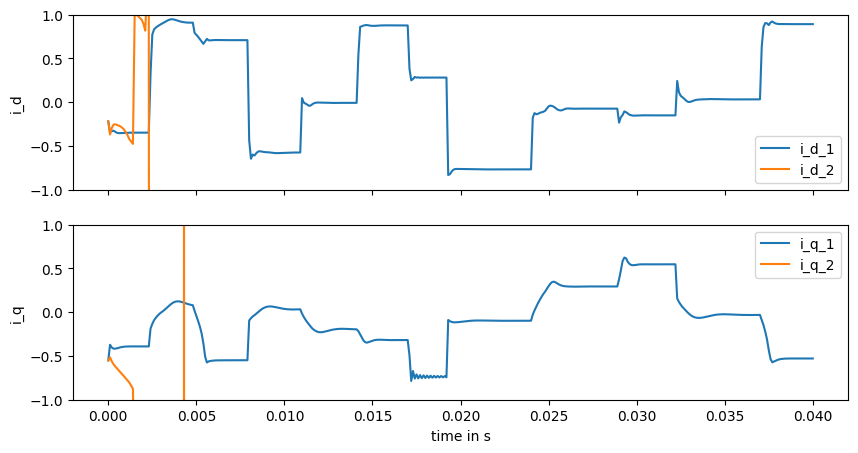

 57%|█████▋    | 169990/300000 [12:00<07:52, 275.20it/s]

Current val_loss: 4778401.161334868


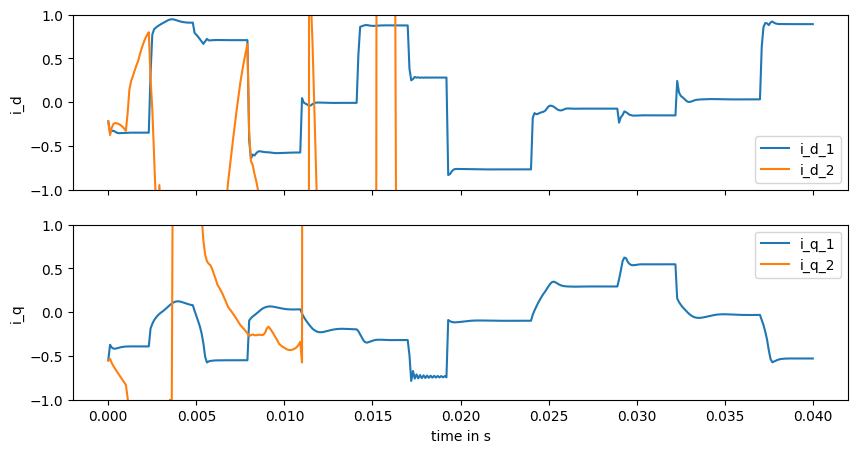

 57%|█████▋    | 171983/300000 [12:09<07:44, 275.84it/s]

Current val_loss: 4.471925654219809


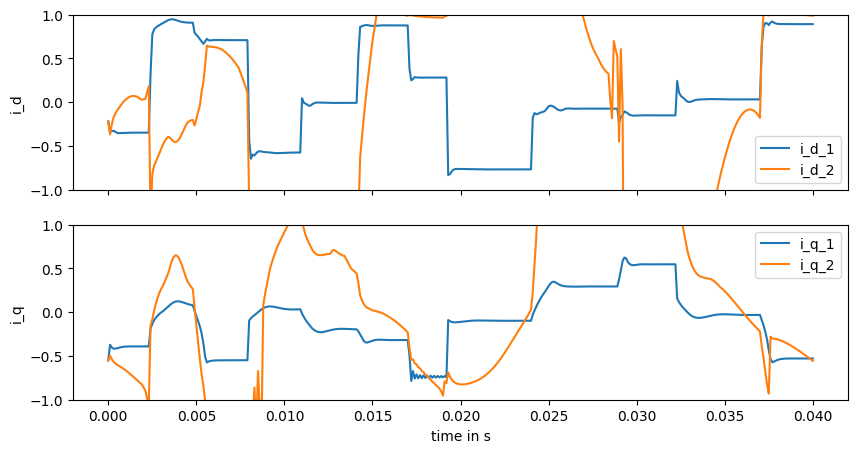

 58%|█████▊    | 174000/300000 [12:17<07:39, 273.95it/s]

Current val_loss: 1040049.3867262857


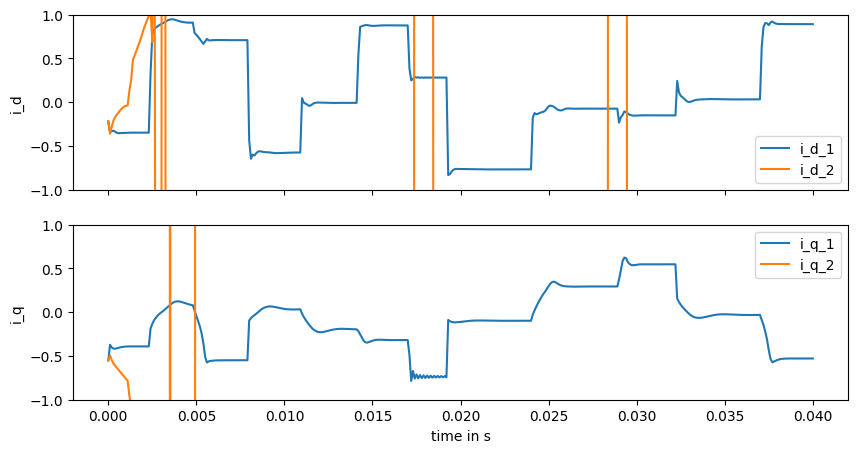

 59%|█████▊    | 175974/300000 [12:25<07:35, 272.16it/s]

Current val_loss: 2.1781034412409744e+31


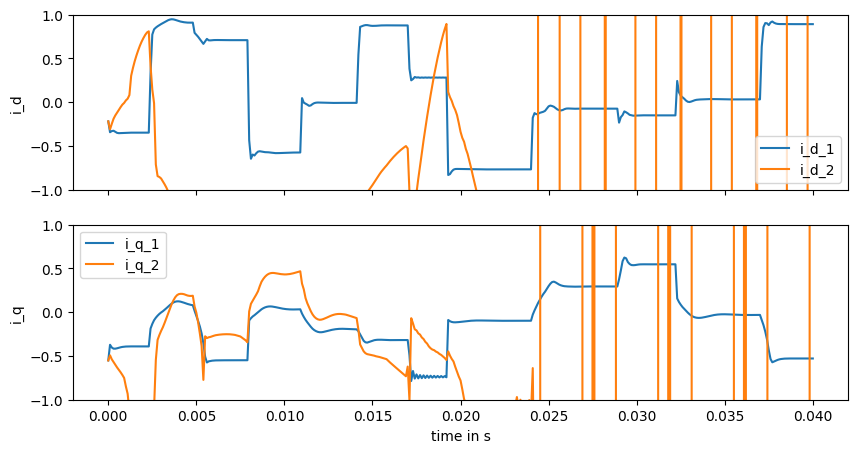

 59%|█████▉    | 177981/300000 [12:34<07:26, 273.15it/s]

Current val_loss: 2.4712506228290474


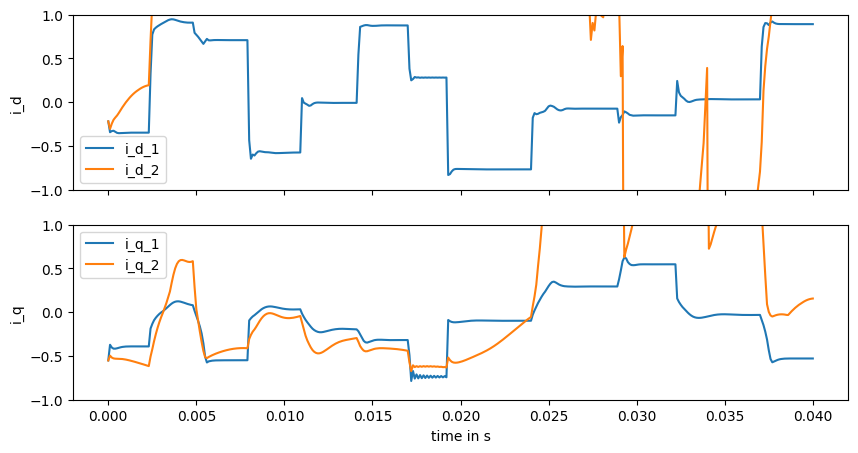

 60%|█████▉    | 179996/300000 [12:42<07:17, 274.20it/s]

Current val_loss: 3.3166807216418445e+17


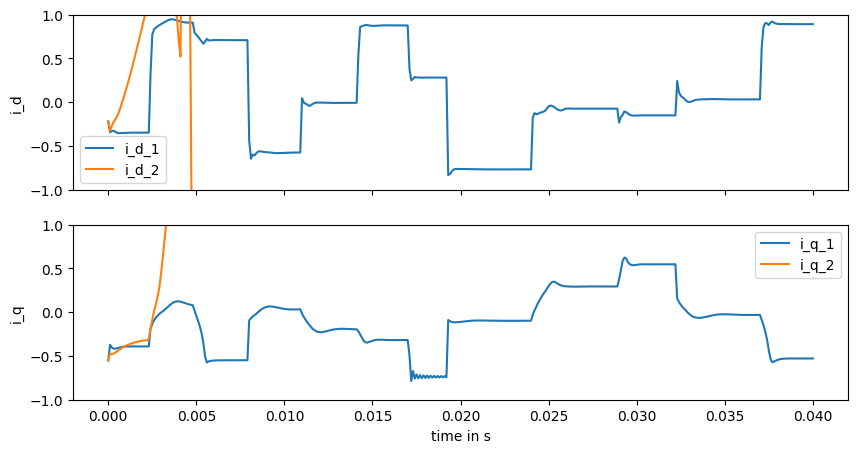

 61%|██████    | 181981/300000 [12:50<07:17, 269.70it/s]

Current val_loss: 47001062373597.21


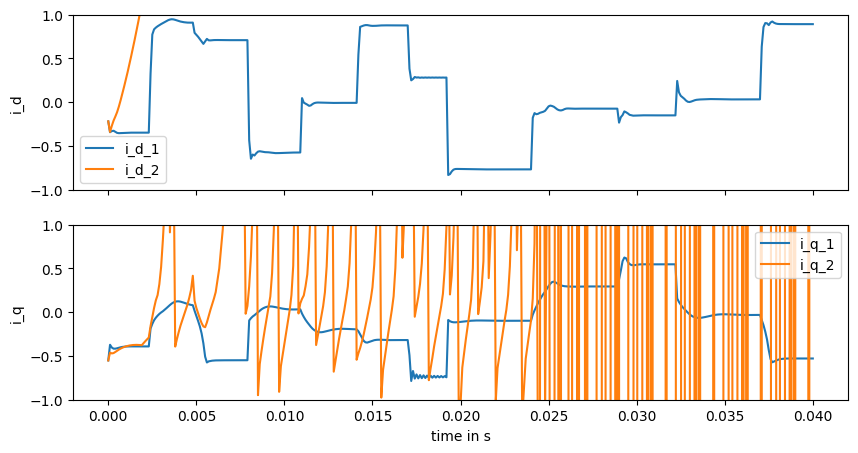

 61%|██████▏   | 183984/300000 [12:59<06:59, 276.28it/s]

Current val_loss: 2.3351492827257655e+35


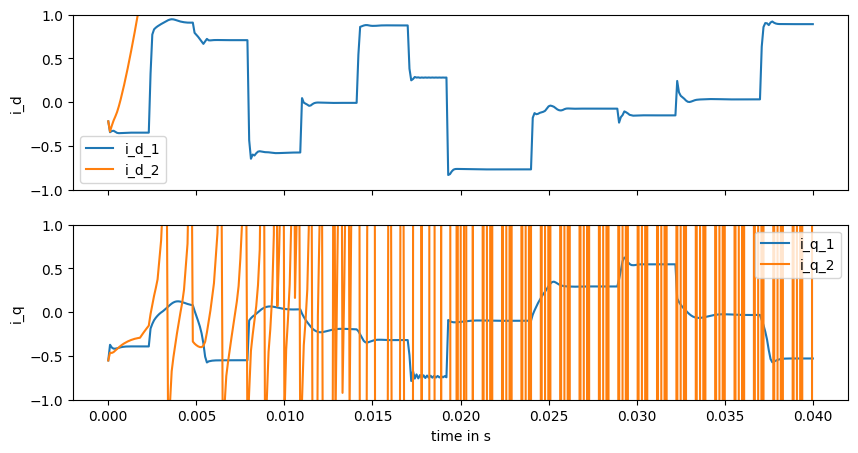

 62%|██████▏   | 186000/300000 [13:07<06:52, 276.11it/s]

Current val_loss: 1.3638636507742492e+174


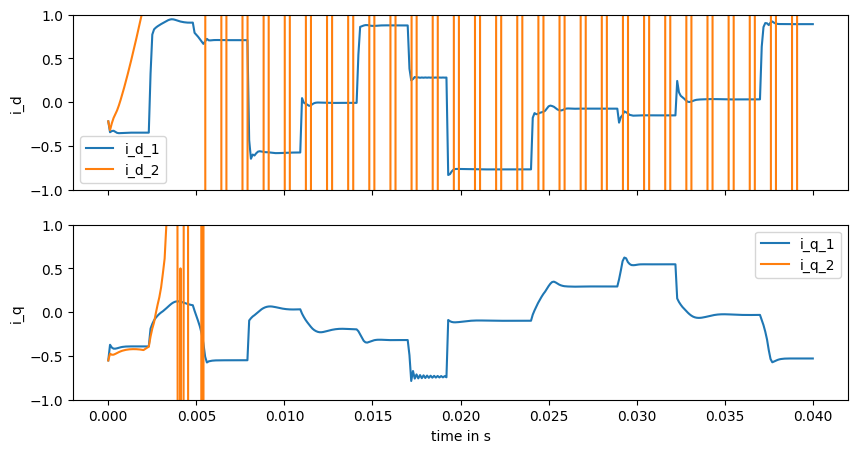

 63%|██████▎   | 187979/300000 [13:15<06:46, 275.24it/s]

Current val_loss: 2.6980655991146683


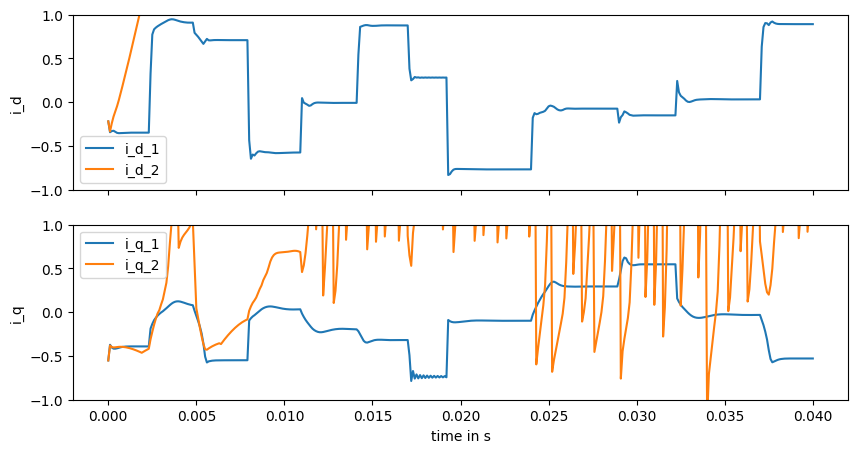

 63%|██████▎   | 189995/300000 [13:23<06:35, 278.20it/s]

Current val_loss: 2.2506564496154


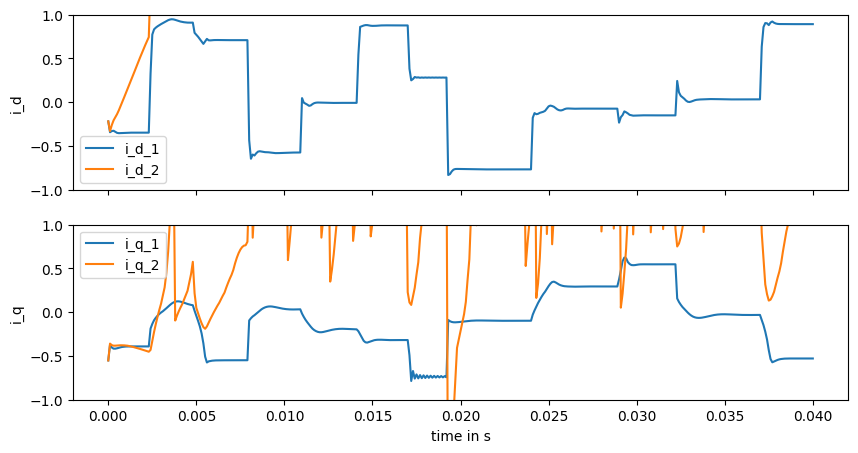

 64%|██████▍   | 191977/300000 [13:32<06:38, 270.85it/s]

Current val_loss: 2.1669478473138564


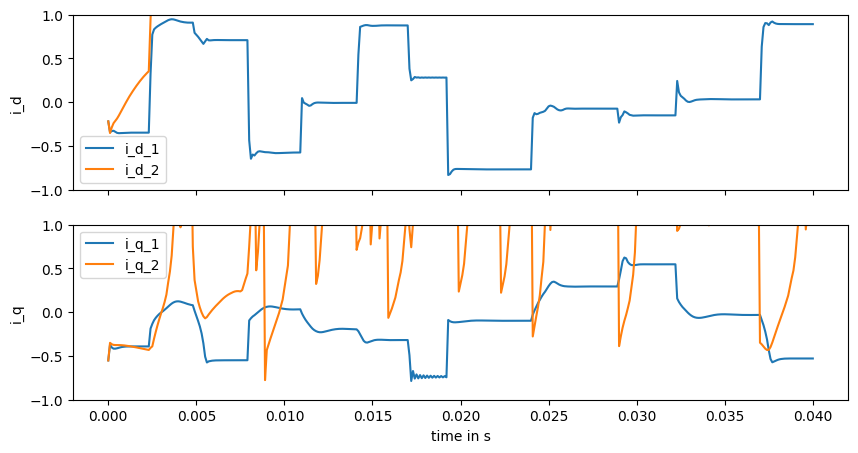

 65%|██████▍   | 193979/300000 [13:40<06:32, 269.78it/s]

Current val_loss: 1.186601261851548


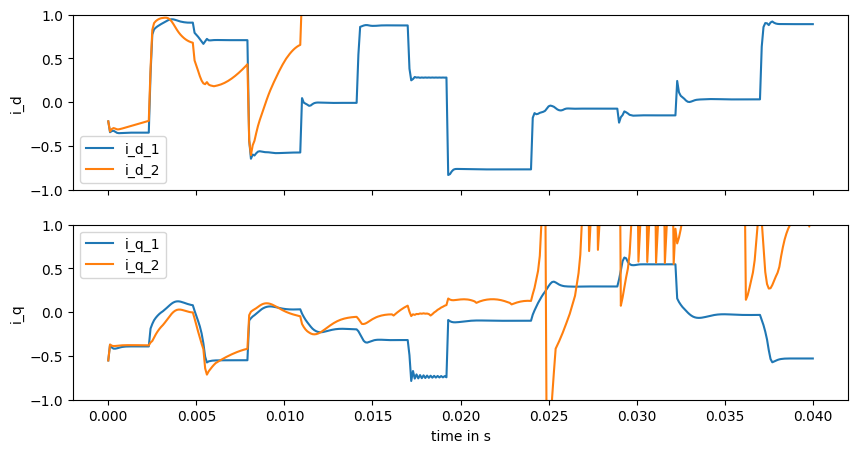

 65%|██████▌   | 195996/300000 [13:49<06:31, 265.83it/s]

Current val_loss: 0.7036028993913941


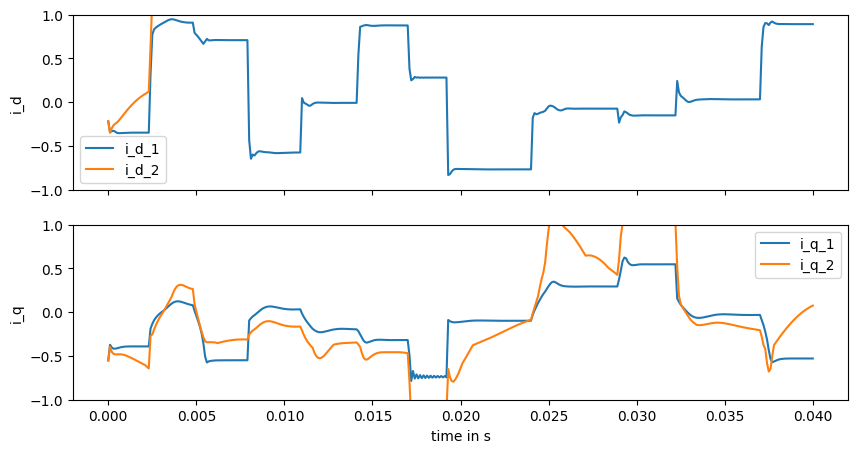

 66%|██████▌   | 197978/300000 [13:57<06:15, 271.52it/s]

Current val_loss: 5266276.772162404


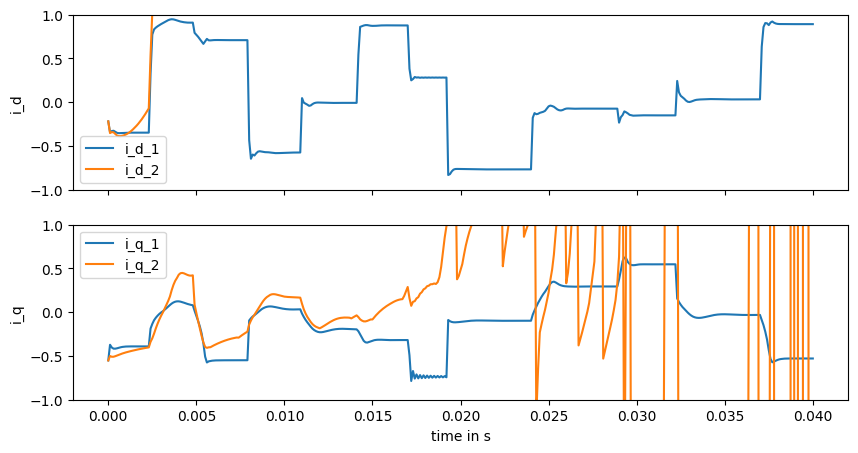

 67%|██████▋   | 199990/300000 [14:05<06:09, 270.75it/s]

Current val_loss: 45.821535704967026


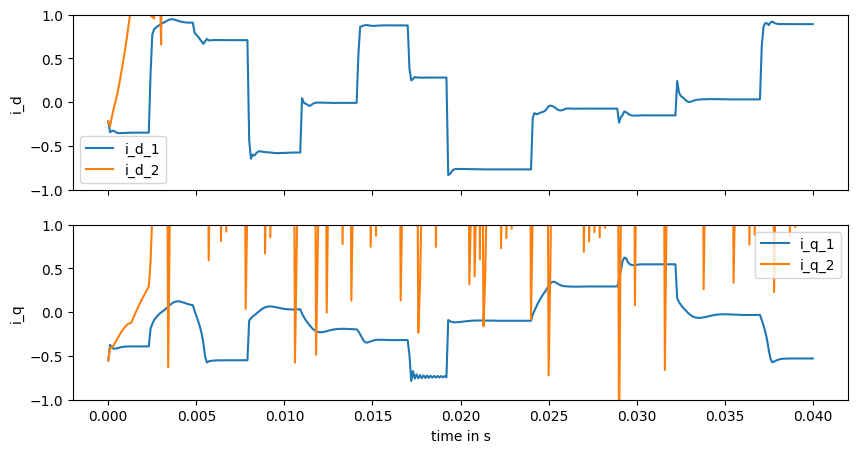

 67%|██████▋   | 201979/300000 [14:13<06:04, 269.20it/s]

Current val_loss: 5.76483539703888e+281


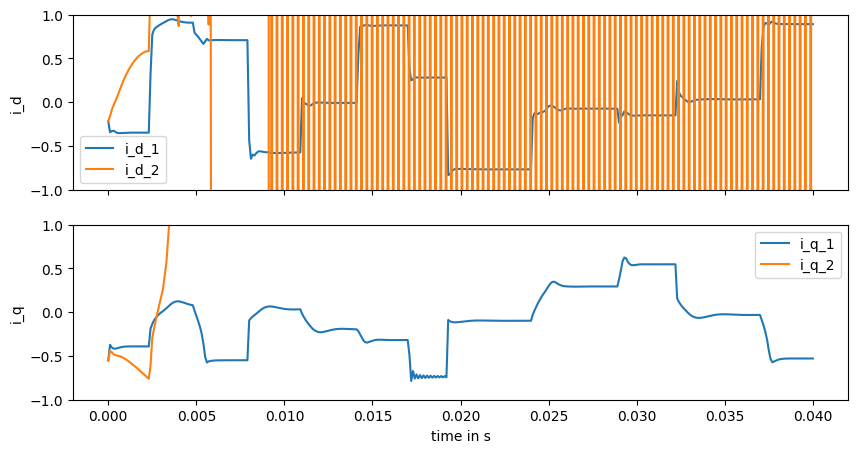

 68%|██████▊   | 203990/300000 [14:22<05:54, 270.51it/s]

Current val_loss: 4.1899000371859666e+18


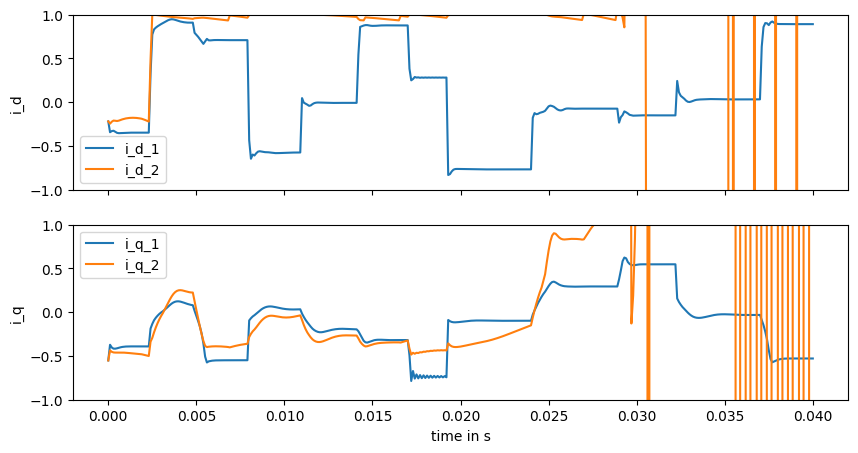

 69%|██████▊   | 205990/300000 [14:31<05:50, 268.20it/s]

Current val_loss: 1.0265948131899327


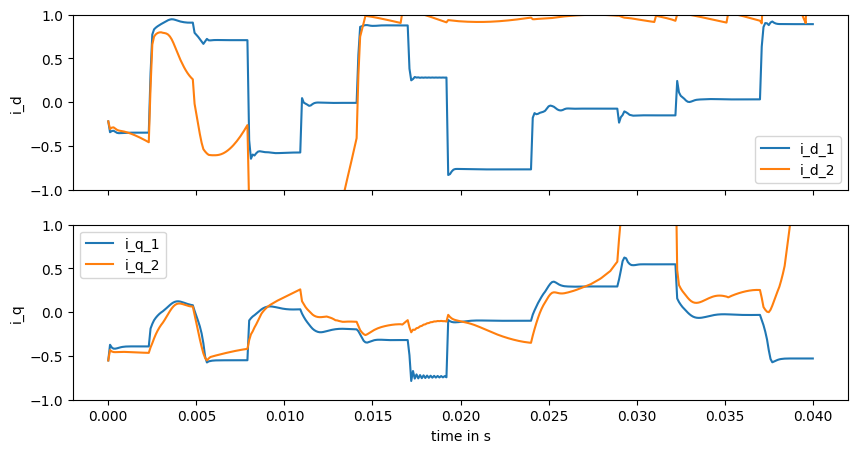

 69%|██████▉   | 207981/300000 [14:39<05:40, 270.01it/s]

Current val_loss: 3.801736715203835e+17


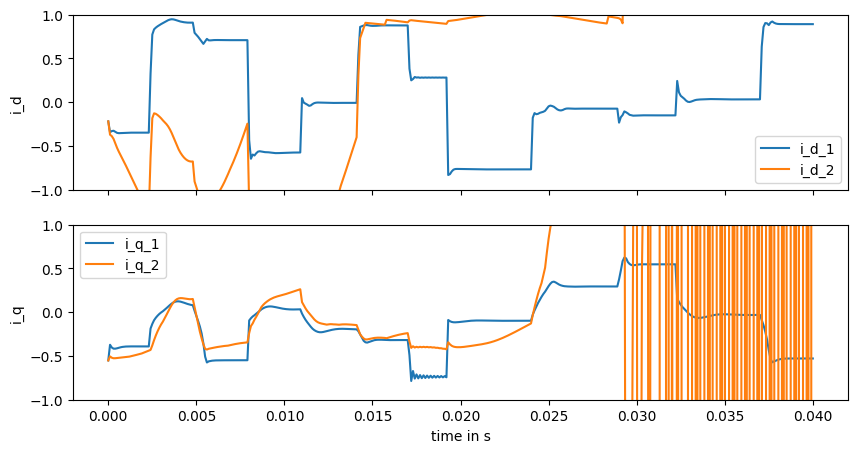

 70%|██████▉   | 209975/300000 [14:47<05:31, 271.62it/s]

Current val_loss: 2.340346178500476e+136


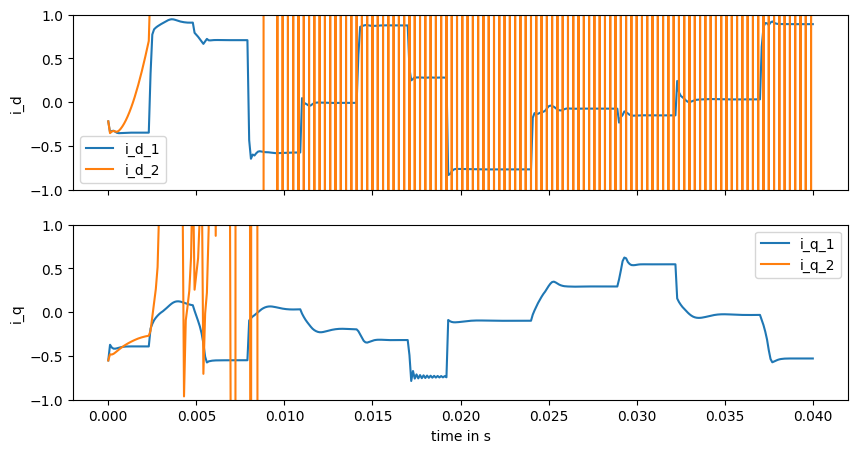

 71%|███████   | 211977/300000 [14:56<05:24, 271.20it/s]

Current val_loss: 1.1323833986241385e+25


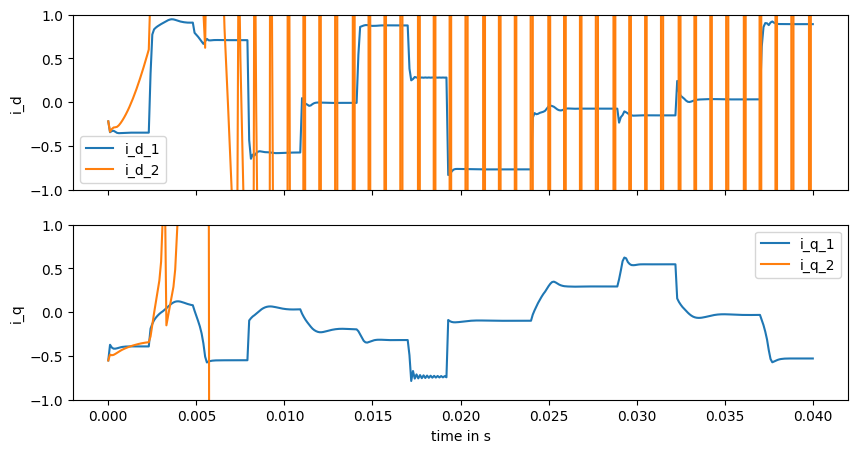

 71%|███████▏  | 213993/300000 [15:04<05:23, 265.54it/s]

Current val_loss: 1.989339582258432e+18


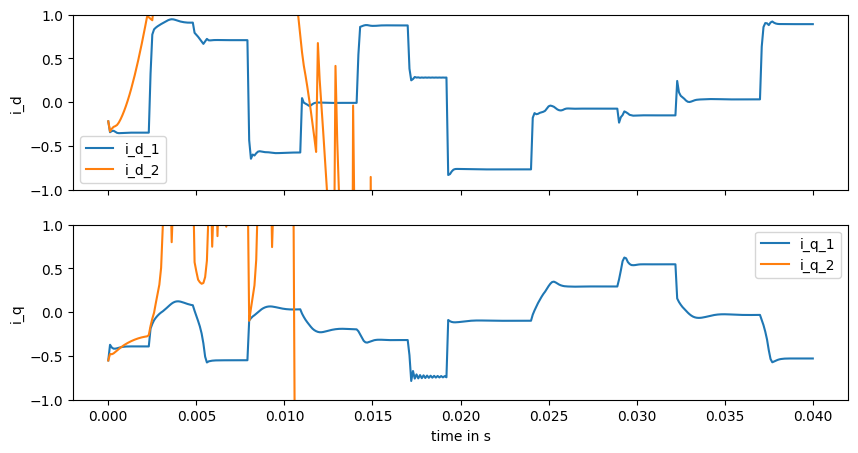

 72%|███████▏  | 215996/300000 [15:13<05:10, 270.46it/s]

Current val_loss: 1.9746254123896088e+20


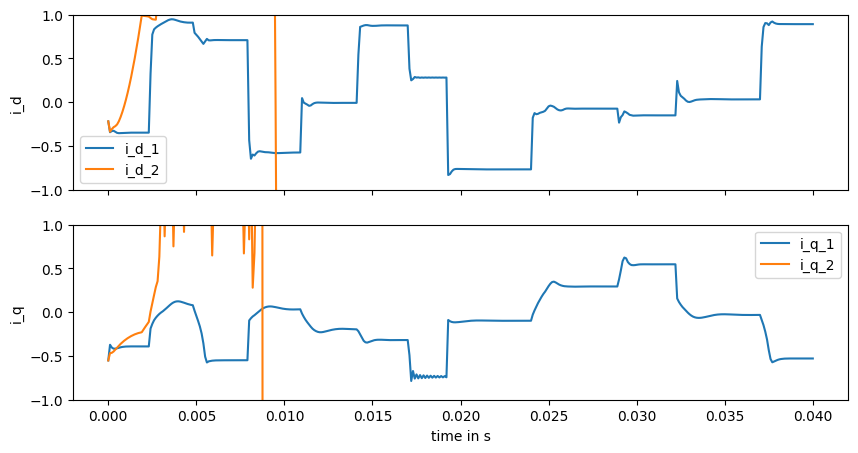

 73%|███████▎  | 217986/300000 [15:21<05:07, 266.98it/s]

Current val_loss: 4.389433155234697e+17


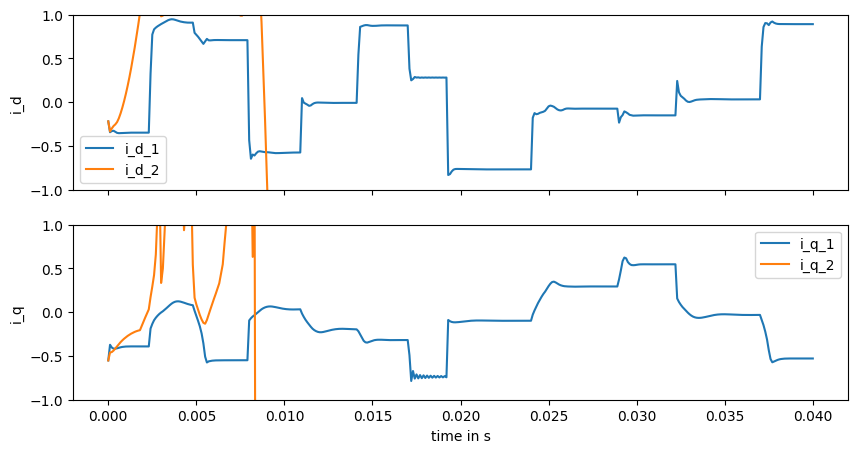

 73%|███████▎  | 219989/300000 [15:30<04:49, 276.74it/s]

Current val_loss: 285573078495.9822


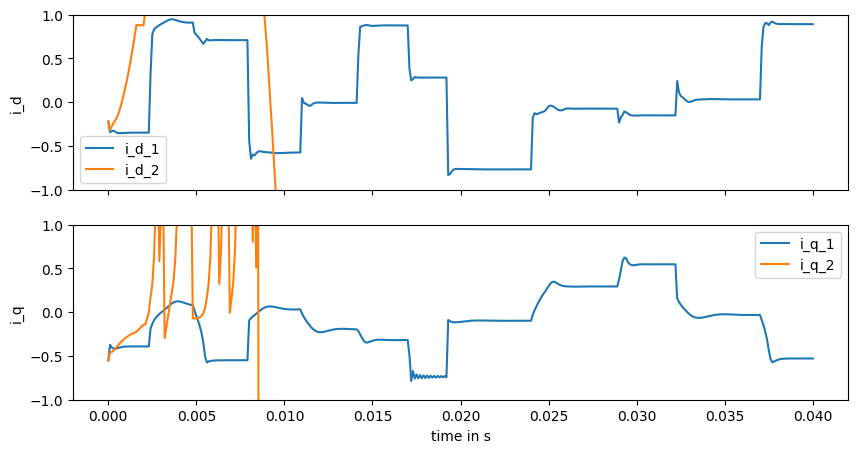

 74%|███████▍  | 221993/300000 [15:38<04:51, 267.35it/s]

Current val_loss: 14795357424918.73


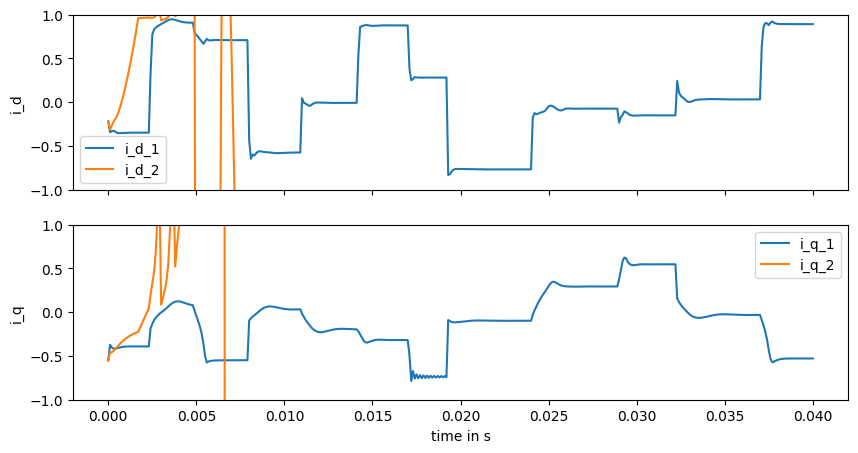

 75%|███████▍  | 223997/300000 [15:46<04:39, 271.46it/s]

Current val_loss: 2969061467953269.5


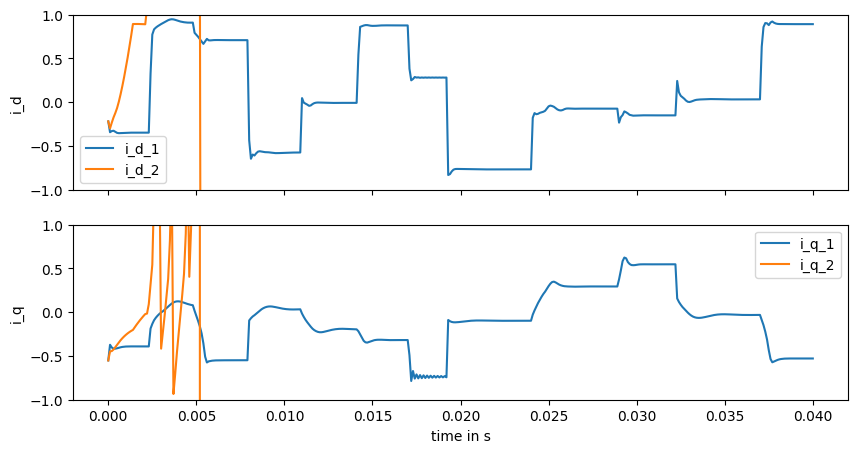

 75%|███████▌  | 225978/300000 [15:54<04:32, 271.56it/s]

Current val_loss: 1.1880970462193148e+16


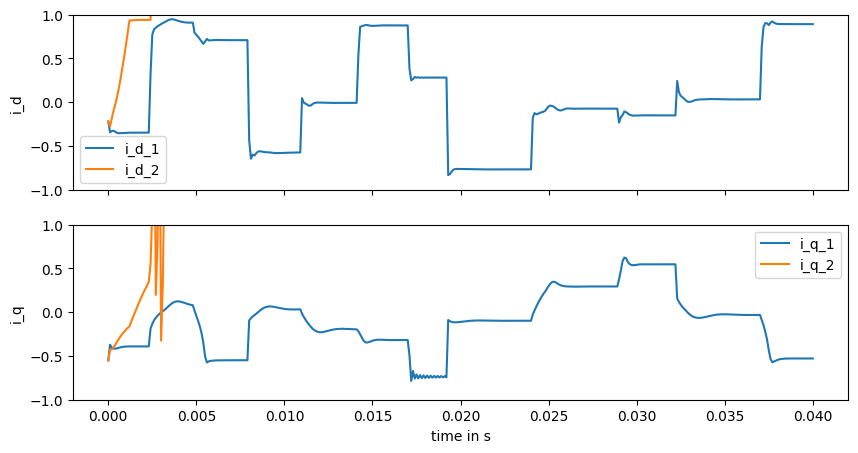

 76%|███████▌  | 227981/300000 [16:03<04:37, 259.90it/s]

Current val_loss: 356704700966.7465


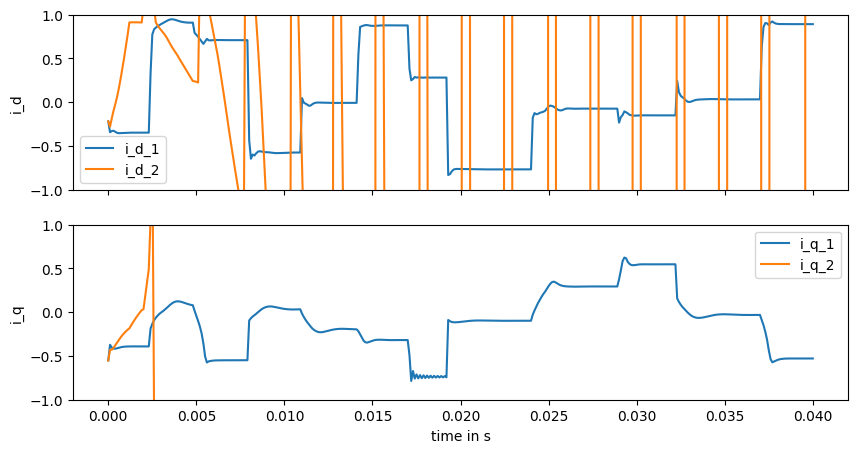

 77%|███████▋  | 229977/300000 [16:11<04:30, 259.04it/s]

Current val_loss: 871397591106.6771


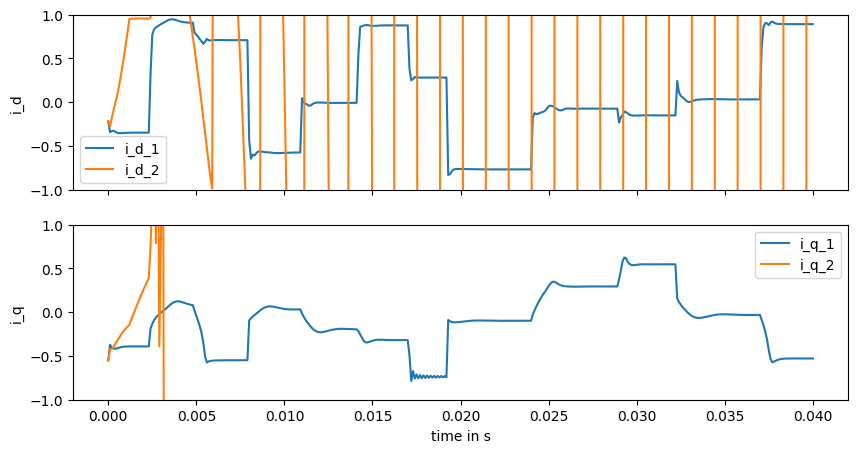

 77%|███████▋  | 231997/300000 [16:21<04:12, 268.86it/s]

Current val_loss: 311978392970.94434


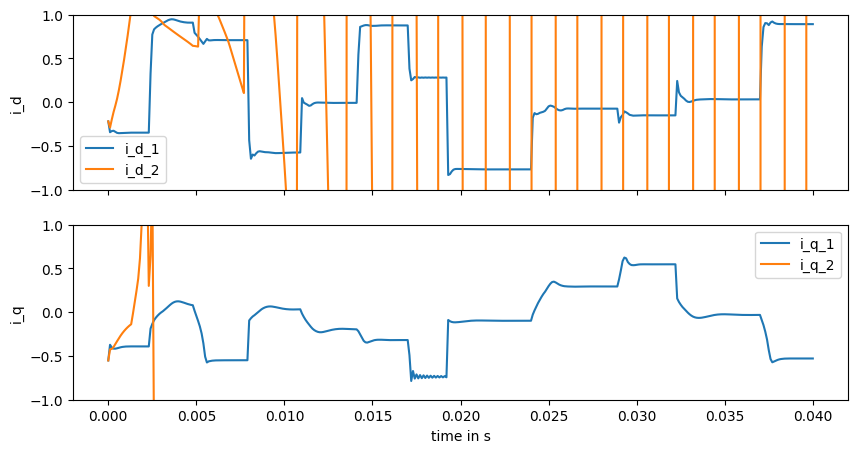

 78%|███████▊  | 233977/300000 [16:29<04:03, 271.48it/s]

Current val_loss: 1123470352056.1003


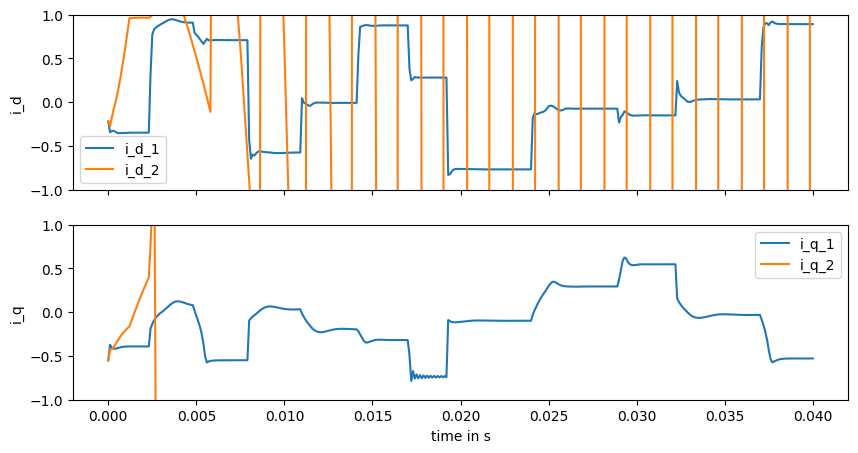

 79%|███████▊  | 235978/300000 [16:38<03:57, 269.67it/s]

Current val_loss: 44412706589177.89


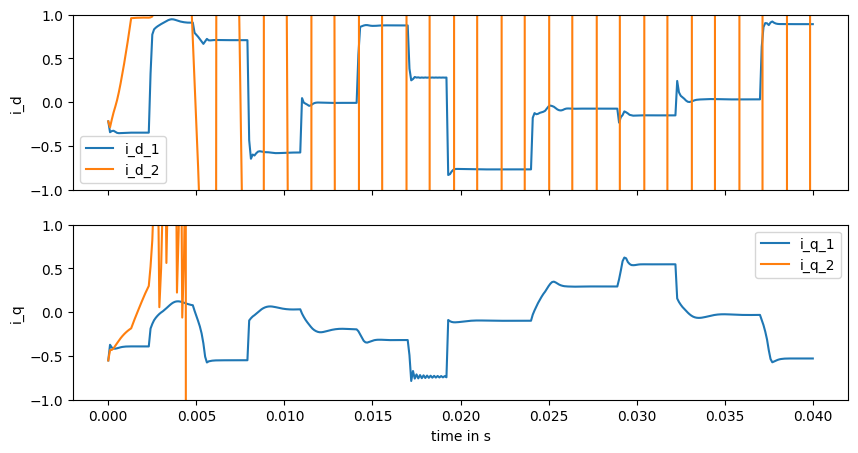

 79%|███████▉  | 237994/300000 [16:46<03:47, 272.84it/s]

Current val_loss: 903859444952.7205


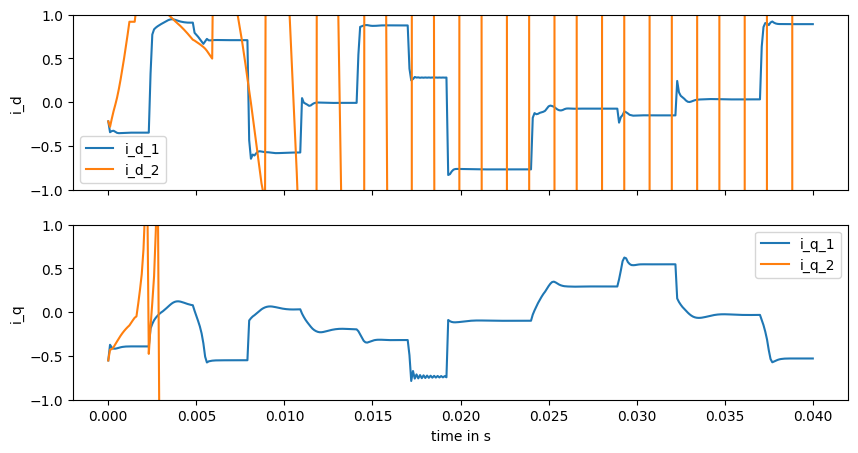

 80%|███████▉  | 239976/300000 [16:55<03:40, 272.49it/s]

Current val_loss: 3449556166708.386


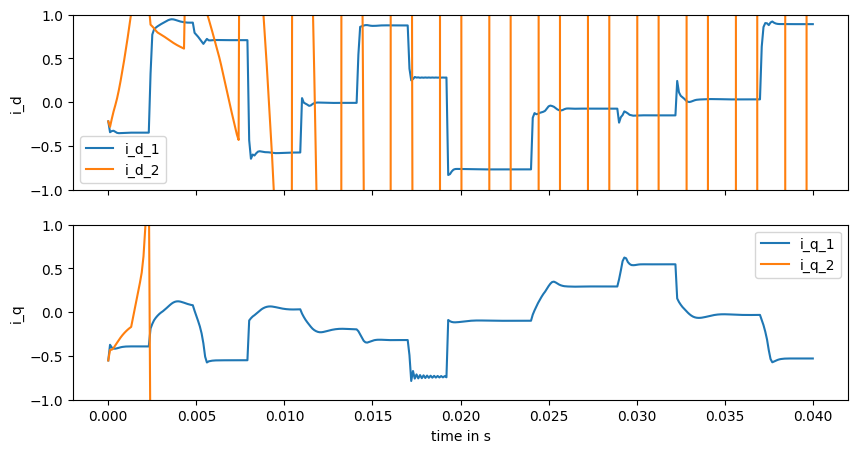

 81%|████████  | 241985/300000 [17:03<03:37, 266.39it/s]

Current val_loss: 3656942552616.0664


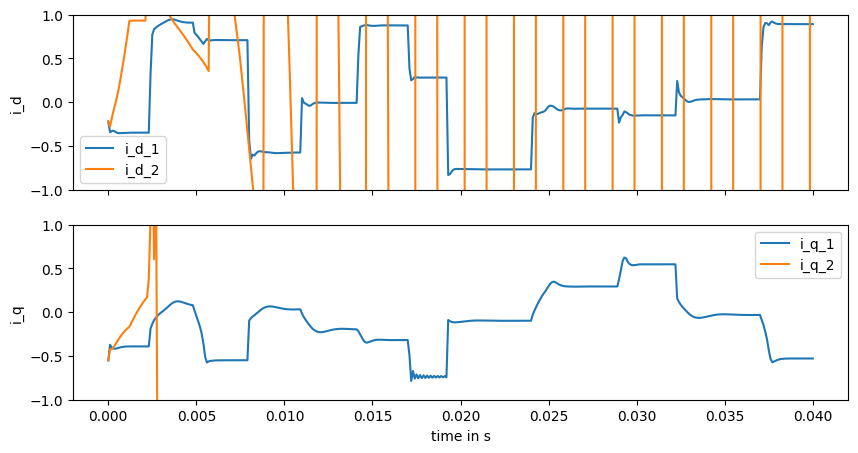

 81%|████████▏ | 243987/300000 [17:12<03:35, 259.67it/s]

Current val_loss: 77921852553.10818


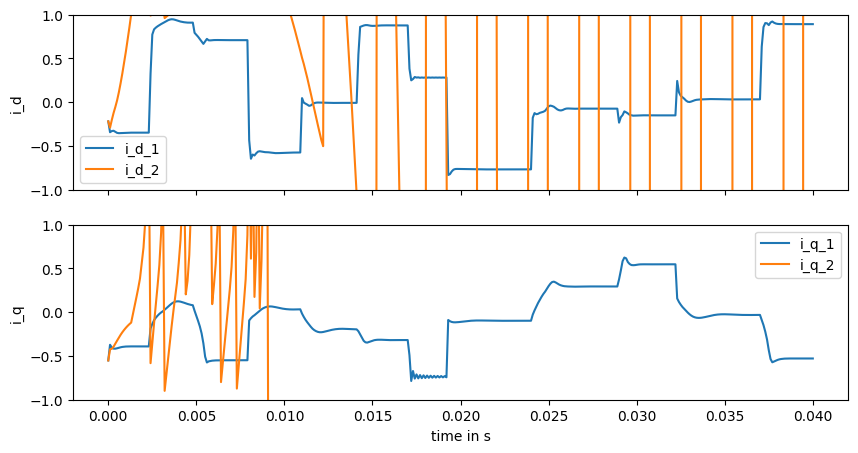

 82%|████████▏ | 245987/300000 [17:20<03:18, 271.77it/s]

Current val_loss: 13126260893049.227


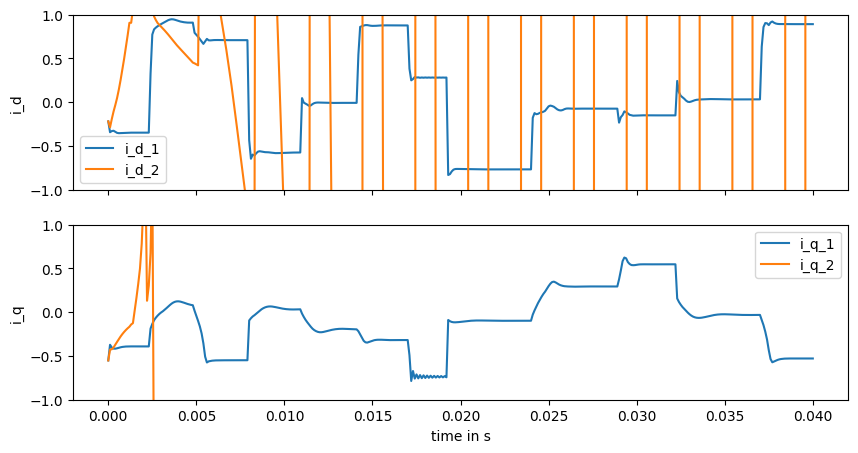

 83%|████████▎ | 247978/300000 [17:29<03:30, 247.45it/s]

Current val_loss: 13488732078178.611


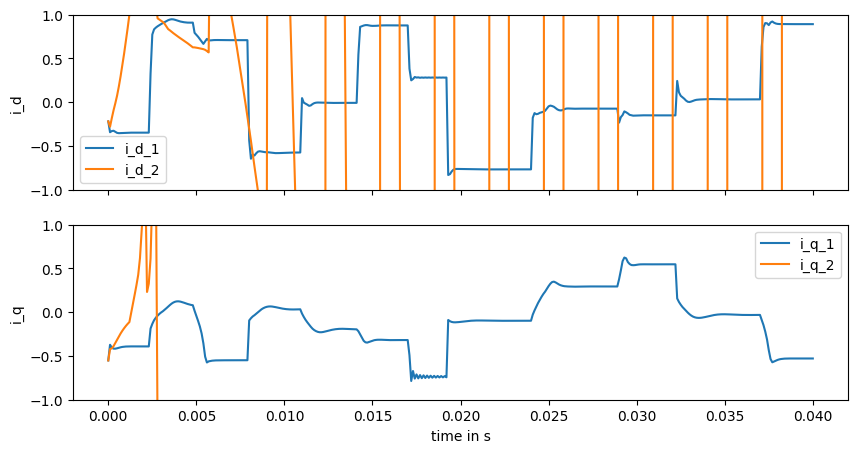

 83%|████████▎ | 249983/300000 [17:38<03:19, 250.23it/s]

Current val_loss: 315832791226543.8


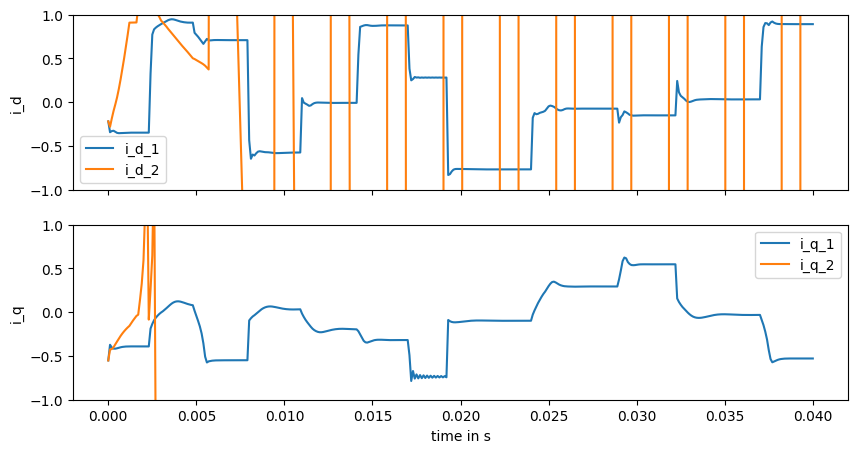

 84%|████████▍ | 251980/300000 [17:47<03:14, 246.28it/s]

Current val_loss: 269735043456920.53


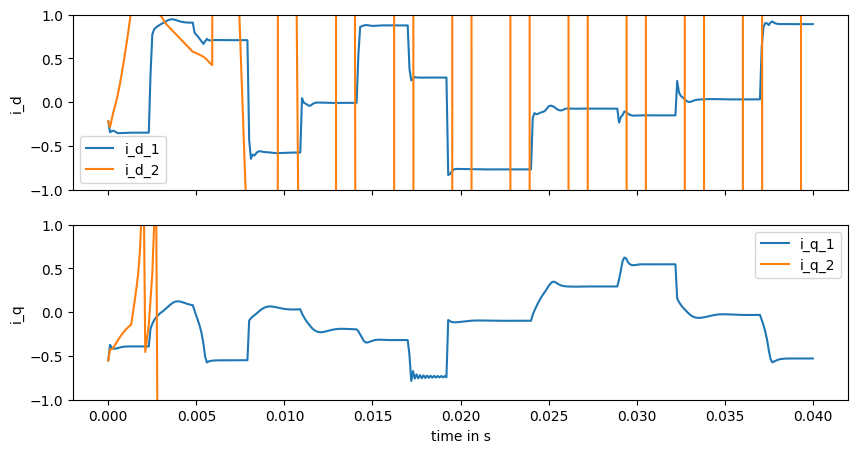

 85%|████████▍ | 253988/300000 [17:57<03:08, 243.50it/s]

Current val_loss: 2.4924772188886982e+17


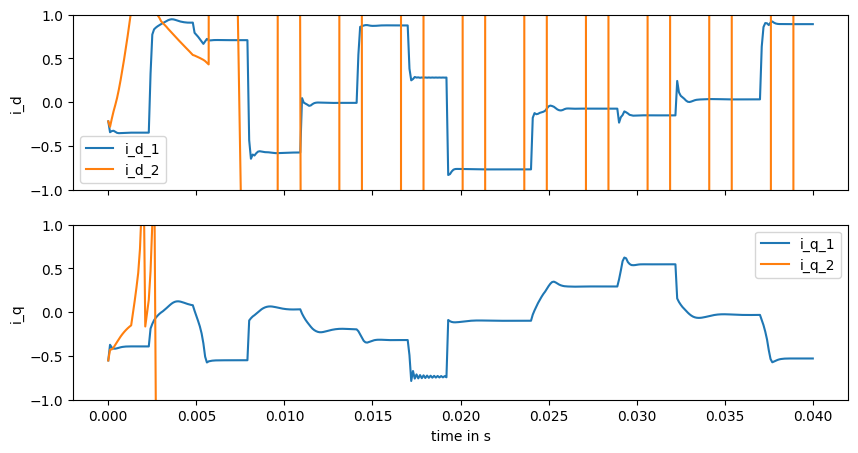

 85%|████████▌ | 255980/300000 [18:06<02:57, 248.02it/s]

Current val_loss: 1.7199729315370316e+16


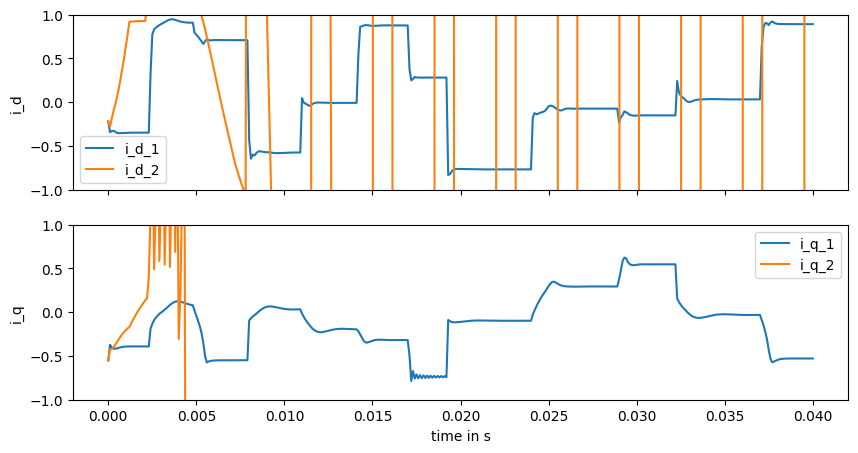

 86%|████████▌ | 257998/300000 [18:15<02:47, 250.07it/s]

Current val_loss: 1.2725760876060897e+18


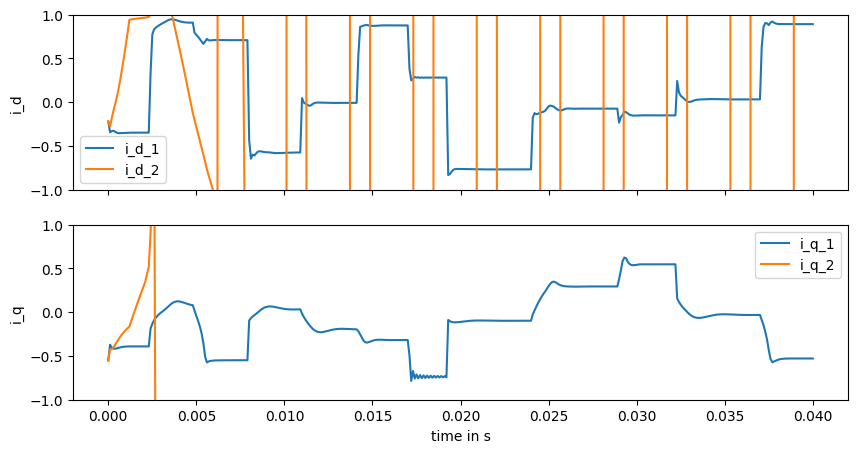

 87%|████████▋ | 259983/300000 [18:24<02:43, 245.08it/s]

Current val_loss: 6.229640486170627e+17


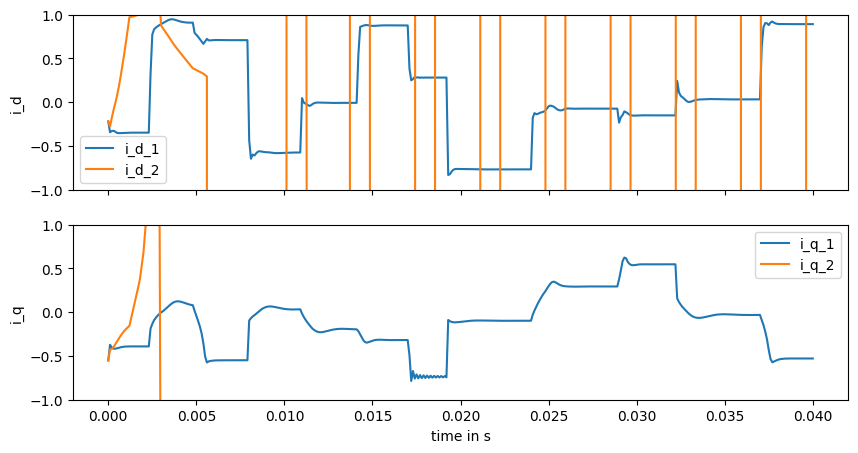

 87%|████████▋ | 261977/300000 [18:34<02:34, 245.43it/s]

Current val_loss: 1875140805897080.5


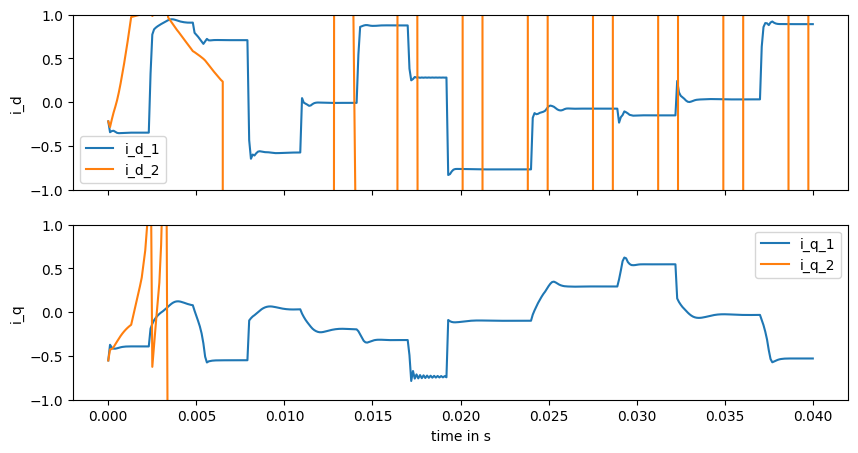

 88%|████████▊ | 263977/300000 [18:43<02:27, 243.71it/s]

Current val_loss: 4.743968976630439e+17


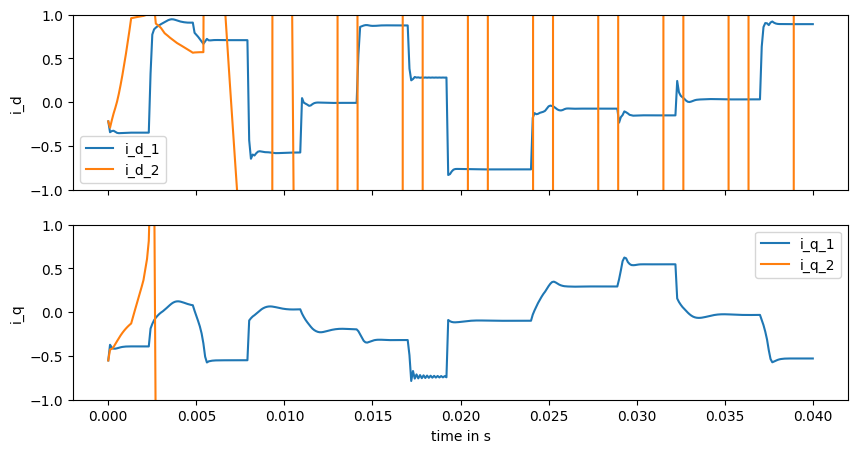

 89%|████████▊ | 265982/300000 [18:52<02:20, 242.14it/s]

Current val_loss: 3.2812749483288628e+16


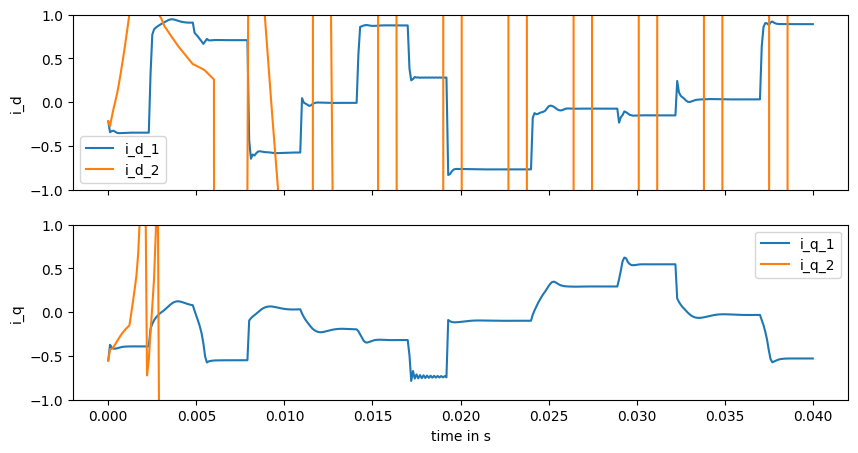

 89%|████████▉ | 267995/300000 [19:01<02:09, 246.87it/s]

Current val_loss: 2.0067600414204637e+17


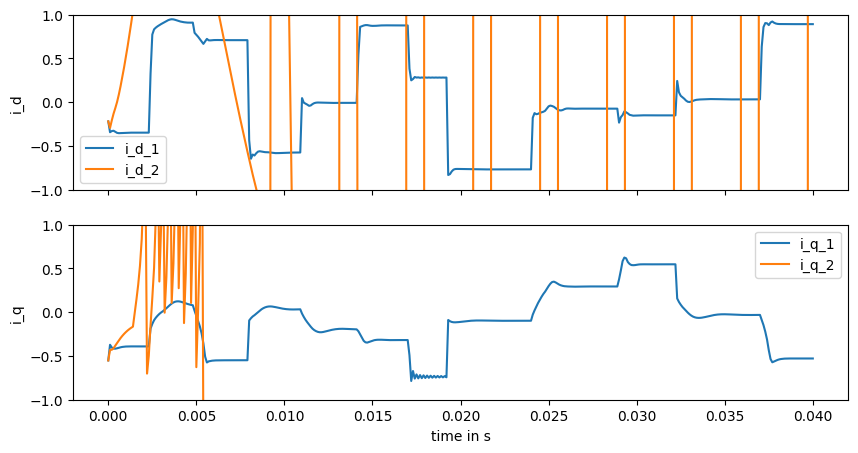

 90%|████████▉ | 269989/300000 [19:11<02:01, 247.68it/s]

Current val_loss: 6.391885956882962e+17


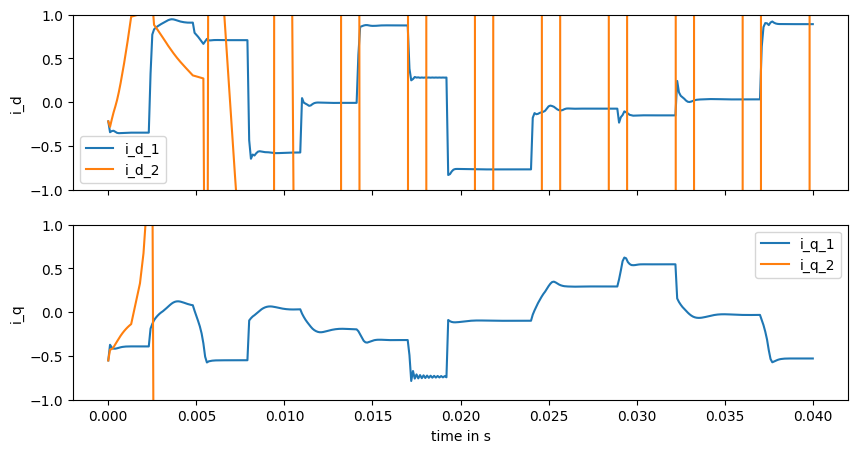

 91%|█████████ | 271977/300000 [19:20<01:54, 245.80it/s]

Current val_loss: 1.4286345831958958e+18


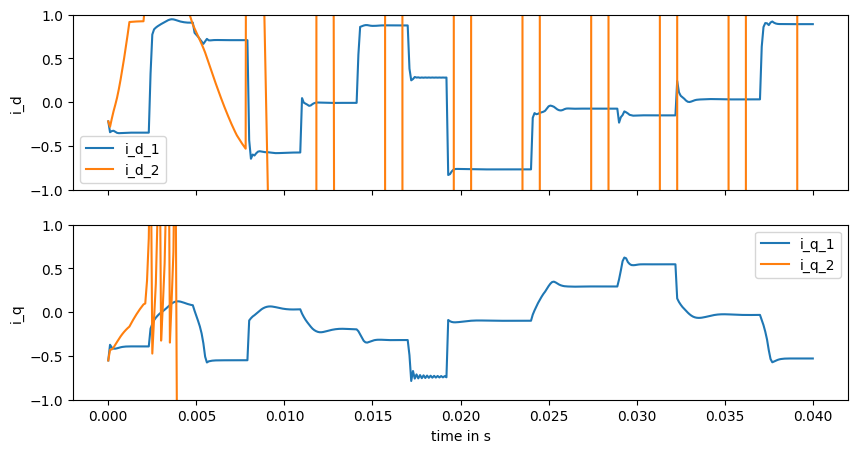

 91%|█████████▏| 273987/300000 [19:29<01:47, 241.44it/s]

Current val_loss: 7.002222098496817e+18


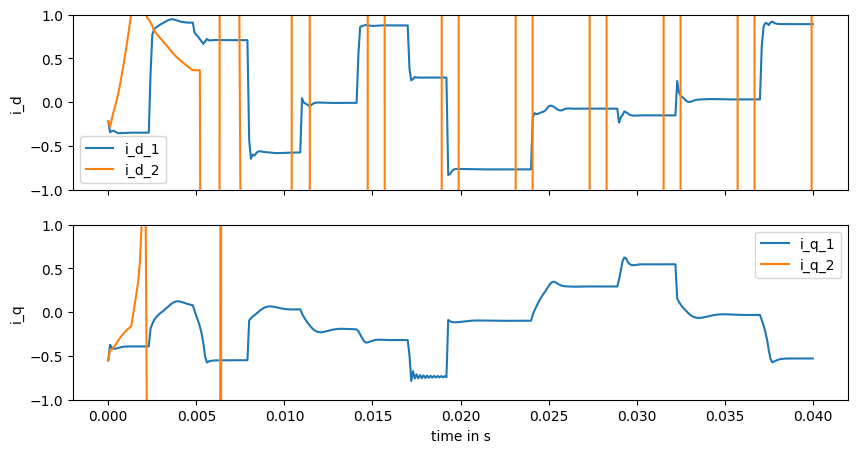

 92%|█████████▏| 275980/300000 [19:38<01:39, 242.40it/s]

Current val_loss: 9.043882291797189e+17


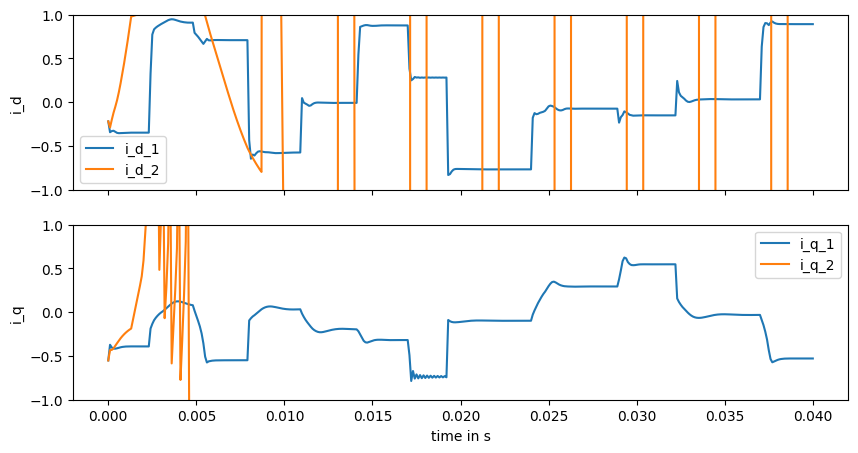

 93%|█████████▎| 277999/300000 [19:48<01:29, 245.92it/s]

Current val_loss: 619047279708447.9


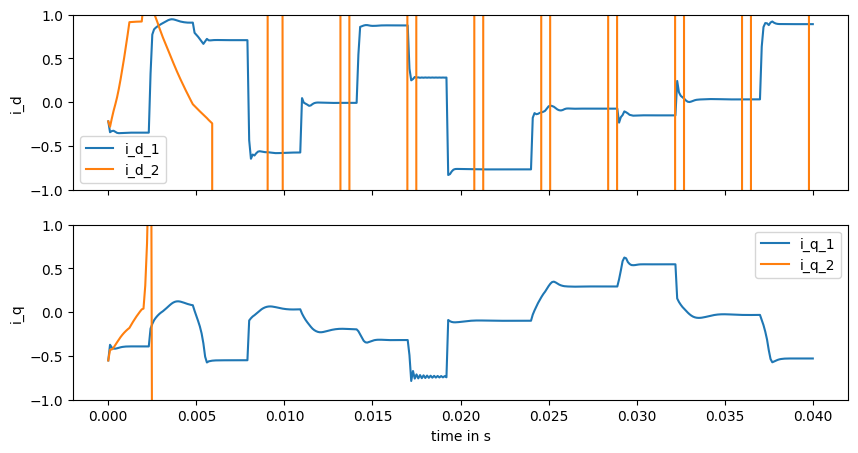

 93%|█████████▎| 279993/300000 [19:57<01:21, 245.51it/s]

Current val_loss: 2357698583163.237


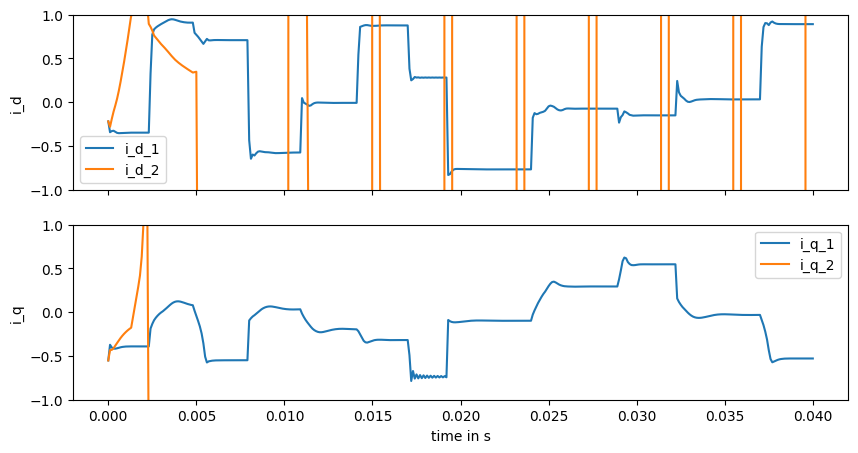

 94%|█████████▍| 281980/300000 [20:06<01:13, 246.34it/s]

Current val_loss: 2.5207121894265385e+18


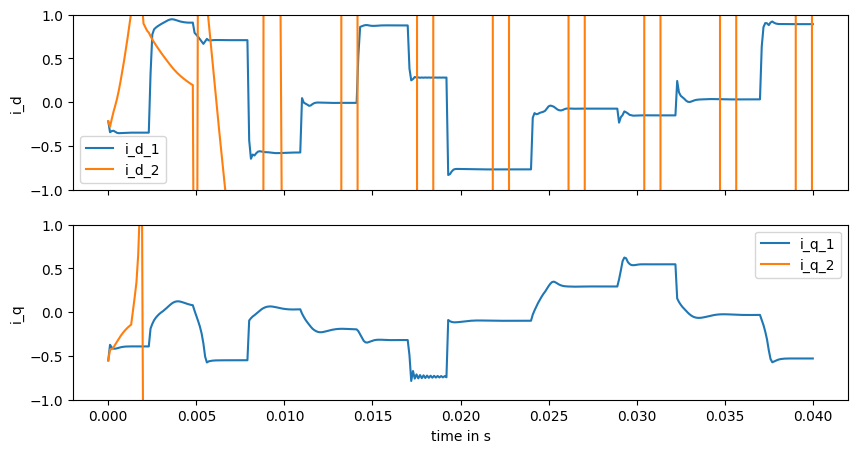

 95%|█████████▍| 283980/300000 [20:15<01:05, 246.22it/s]

Current val_loss: 5.05184919323598e+18


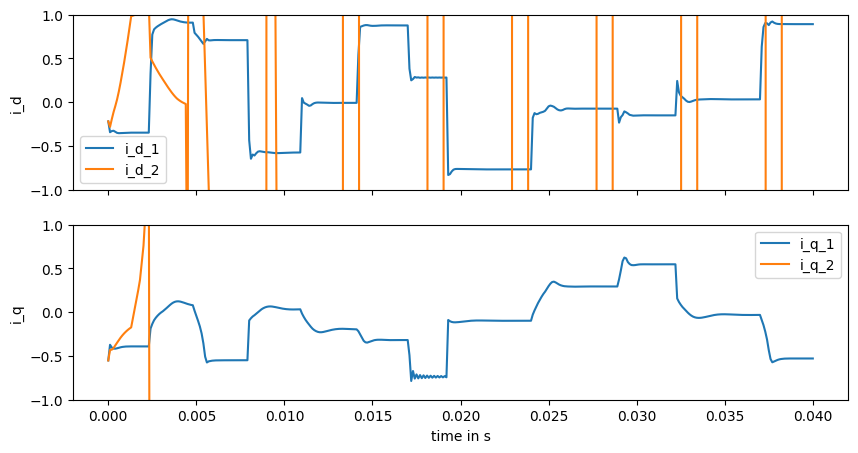

 95%|█████████▌| 285979/300000 [20:24<00:57, 245.43it/s]

Current val_loss: 2.694333963647653e+16


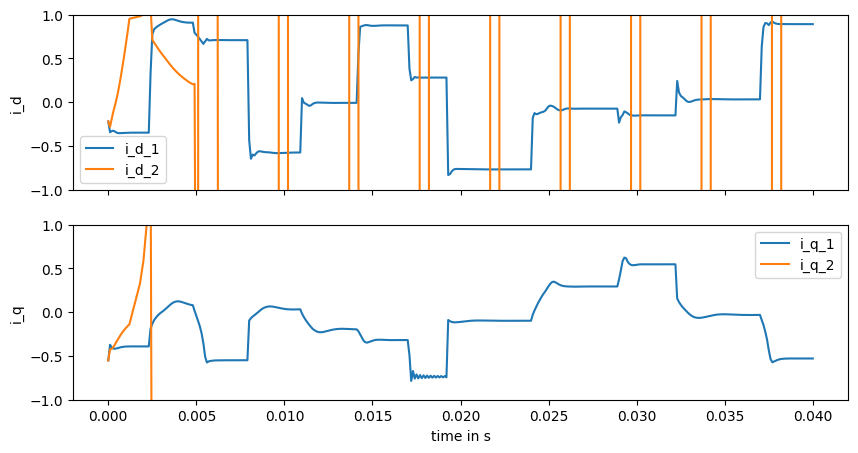

 96%|█████████▌| 287990/300000 [20:34<00:49, 241.55it/s]

Current val_loss: 1.2856053838148592e+17


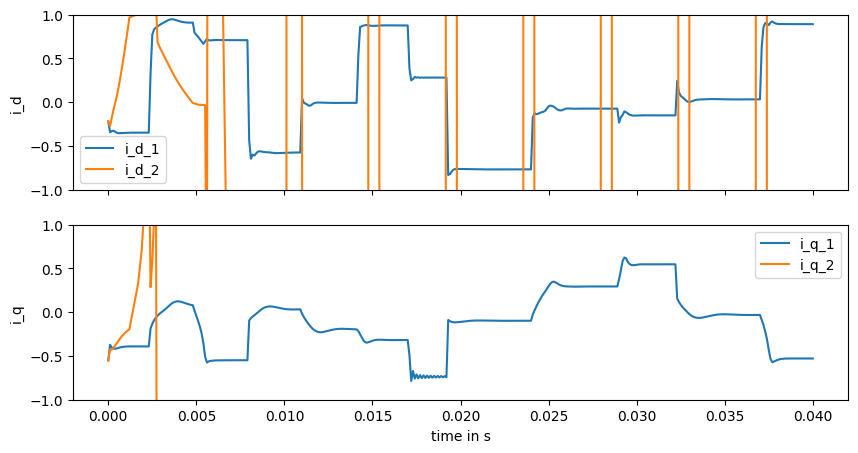

 97%|█████████▋| 289984/300000 [20:43<00:41, 242.94it/s]

Current val_loss: 365303169590.186


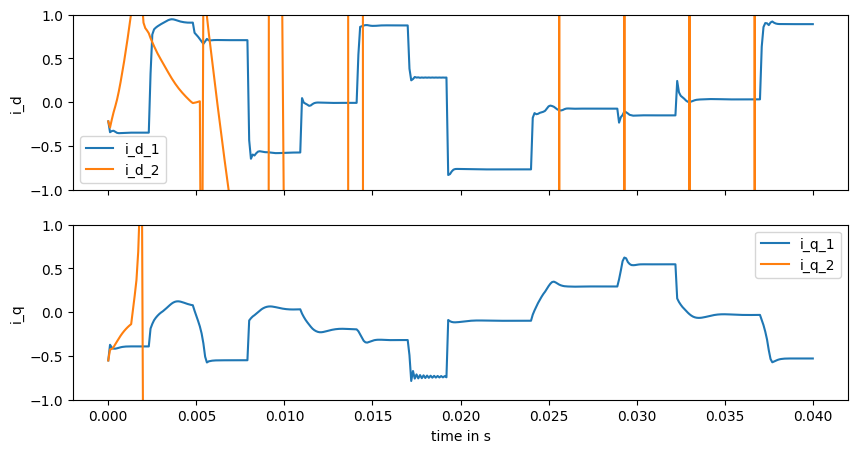

 97%|█████████▋| 291984/300000 [20:52<00:32, 245.92it/s]

Current val_loss: 801822396640469.9


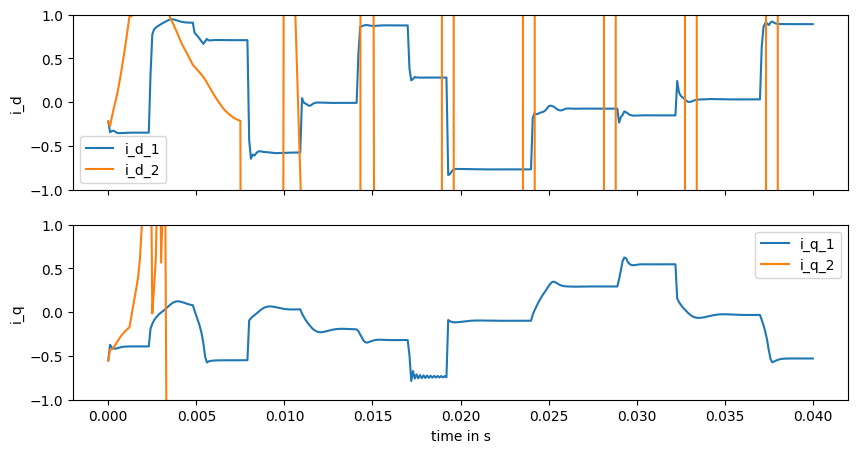

 98%|█████████▊| 293994/300000 [21:01<00:24, 248.52it/s]

Current val_loss: 115643264782321.02


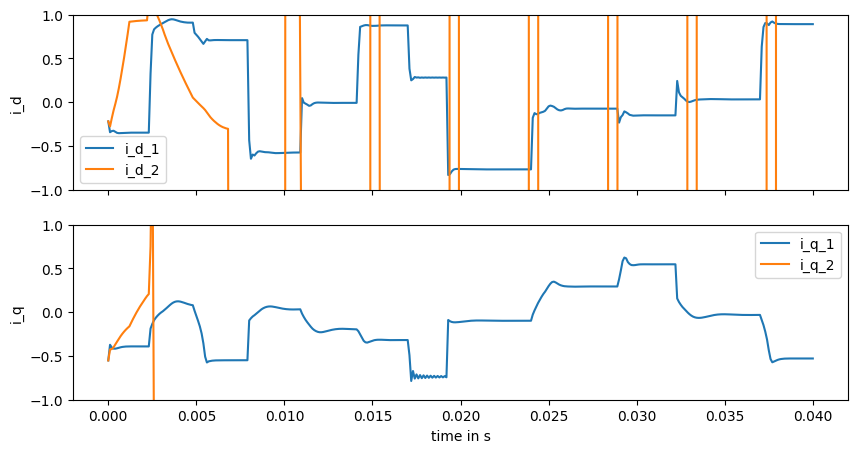

 99%|█████████▊| 295993/300000 [21:12<00:16, 247.17it/s]

Current val_loss: 7.010447157589203e+17


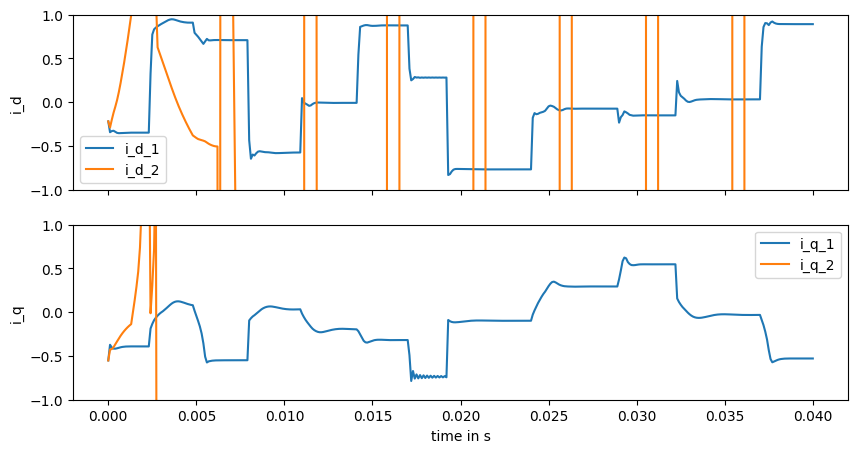

 99%|█████████▉| 297989/300000 [21:21<00:08, 247.87it/s]

Current val_loss: 3.63375498829379e+17


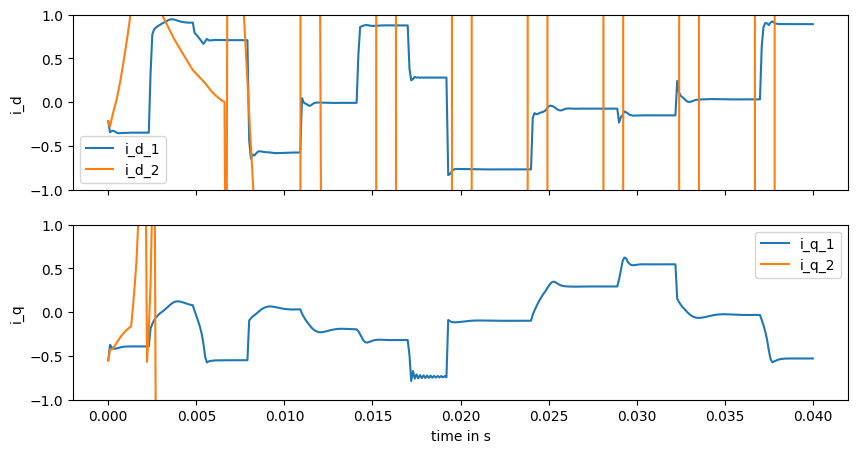

100%|██████████| 300000/300000 [21:30<00:00, 232.45it/s]


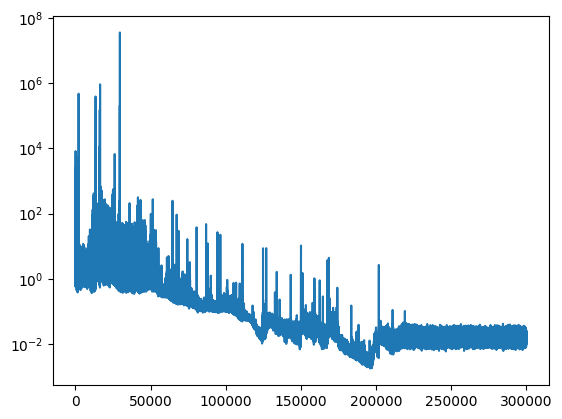

In [31]:
fin_node_dpc,fin_opt_state,fin_keys,losses, val_losses=mtrainer.fit_non_jit(node,opt_state,keys,plot_every=2000)
plt.plot(losses)
plt.yscale('log')

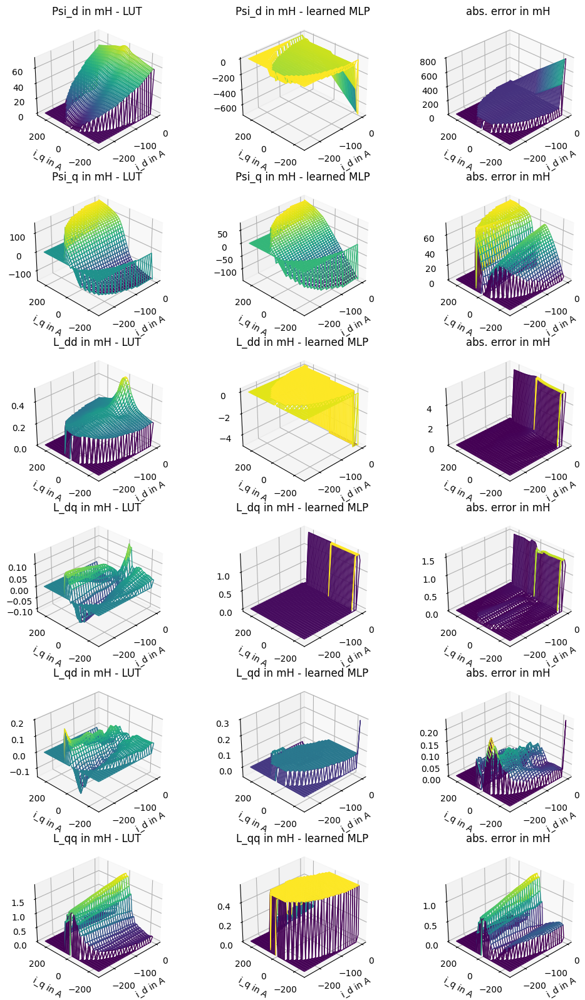

In [32]:
eval_psi_and_L(fin_node_dpc)